<a href="https://colab.research.google.com/github/NatP-dev/Case_06/blob/main/Daily_Interest_Rates_Data_Analysis_02062025_0832.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Daily Interest Rates**

#### **Authors**: Group 7
- Nathalia Pouroullis
- Egon Soontiëns
- Isa Widdershoven
- Max Thönissen


In [1]:
# #------------------------------EXPORT AS HTML-----------------#
# !jupyter nbconvert --to html /content/Daily_Interest_Rates_Data_Analysis_02062025_0817.ipynb

In [2]:
#----------------------------------EXPORT AS PDF---------------------#

## **<font color='#474747'>0 - Imports**</font>



In [54]:
################################ LIBRARIES ########################
# -------------------------- Core Libraries -------------------------- #
import os
import pandas as pd
import re
from IPython.display import display
import numpy as np


# -------------------------- Plotting -------------------------- #
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

from scipy.stats import zscore
import plotly.graph_objects as go
from collections import Counter
from collections import defaultdict


from pandas.tseries.holiday import AbstractHolidayCalendar, Holiday, nearest_workday, Easter, GoodFriday, EasterMonday
from datetime import date, timedelta
from dateutil.easter import easter


from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler



---
---
<br><br>
# **<font color='#000058'>Chapter 1: Data Quality Assessment</font>**



## **<font color='#474747'>1.1 - Load All Data Files**

In [4]:
# Step 1: Mount your Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# Step 2: Set the path to your folder containing the 31 CSV files
# Replace this path with the actual folder path inside your Drive
folder_path = '/content/drive/MyDrive/EMAS 14 Case 6/Data/Interest Rates/Daily'


In [6]:
# Step 3: Load all CSV files into a list of DataFrames
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Optional: Sort filenames to maintain a consistent order
csv_files.sort()

In [7]:
# Step 4: Read all CSV files
dataframes = []
for file in csv_files:
    full_path = os.path.join(folder_path, file)
    df = pd.read_csv(full_path)
    dataframes.append(df)

# Now `dataframes` is a list of 31 DataFrames (one per CSV)
# Example: access the first DataFrame
print(dataframes[0].head())

          Unnamed: 0 BBSIS.D.I.ZST.ZI.EUR.S1311.B.A604.R005X.R.A.A._Z._Z.A  \
0                NaN  Term structure of interest rates on listed Fed...      
1            Comment  Monatsendstandsreihe: WZ9807. Bis Juli 1997 li...      
2           Decimals                                                  2      
3   Time format code                                                P1D      
4  Unit (in english)                                            percent      

  BBSIS.D.I.ZST.ZI.EUR.S1311.B.A604.R005X.R.A.A._Z._Z.A_FLAGS  
0                                                NaN           
1                                                NaN           
2                                                NaN           
3                                                NaN           
4                                                NaN           


In [8]:
# Loop for files into their own dataframes
for i in range(len(dataframes)):
    print(f"DataFrame {i}: {csv_files[i]}")

DataFrame 0: daily-term-structure-spot-interest-rate-R005X.csv
DataFrame 1: daily-term-structure-spot-interest-rate-R01XX.csv
DataFrame 2: daily-term-structure-spot-interest-rate-R02XX.csv
DataFrame 3: daily-term-structure-spot-interest-rate-R03XX.csv
DataFrame 4: daily-term-structure-spot-interest-rate-R04XX.csv
DataFrame 5: daily-term-structure-spot-interest-rate-R05XX.csv
DataFrame 6: daily-term-structure-spot-interest-rate-R06XX.csv
DataFrame 7: daily-term-structure-spot-interest-rate-R07XX.csv
DataFrame 8: daily-term-structure-spot-interest-rate-R08XX.csv
DataFrame 9: daily-term-structure-spot-interest-rate-R09XX.csv
DataFrame 10: daily-term-structure-spot-interest-rate-R10XX.csv
DataFrame 11: daily-term-structure-spot-interest-rate-R11XX.csv
DataFrame 12: daily-term-structure-spot-interest-rate-R12XX.csv
DataFrame 13: daily-term-structure-spot-interest-rate-R13XX.csv
DataFrame 14: daily-term-structure-spot-interest-rate-R14XX.csv
DataFrame 15: daily-term-structure-spot-interest-r

Note:

All 31 interest rate CSV files were successfully loaded into individual pandas DataFrames. File sorting ensures consistency in maturity order, which is important for structured time series analysis.

### **<font color='#474747'>*1.1 - Format Dataframes Consistently*</font>**
What was done to format the files:
1. Start at row 11
2. Have no headers
3. Rename columns:
  * Column 1: Date (convert to datetime)
  * Column 2: Value (float, 2 decimals)
  * Column 3: Info message like "No value available"
4. Add a new column FileReferenceName with the filename.



In [9]:
# Step 5: Read all CSVs from row 11 onward, format consistently
dataframes = []

for file in csv_files:
    full_path = os.path.join(folder_path, file)

    df = pd.read_csv(full_path, skiprows=10, header=None, dtype=str, encoding='utf-8')
    df.columns = ["Date", "Interest Rate", "Information No IR"]

    # Clean and parse columns
    df["Date"] = df["Date"].str.strip()
    df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m-%d", errors="coerce")
    df["Interest Rate"] = pd.to_numeric(df["Interest Rate"], errors="coerce")
    df["FileReferenceName"] = file

    dataframes.append(df)

# Adjust maturity assignment, with special handling for R005X
for df in dataframes:
    file_name = df["FileReferenceName"].iloc[0]

    if "R005X" in file_name:
        df["Maturity"] = 0.5
    else:
        match = re.search(r"R(\d{2})X", file_name)
        if match:
            df["Maturity"] = int(match.group(1))  # e.g., R01XX → 1
        else:
            df["Maturity"] = None  # fallback


In [10]:
# CHECK DATA MANUALLY (Ensure alignment with excels)
# Head
display(dataframes[0].head(5))

# Tail
display(dataframes[0].tail(5))

,Date,Interest Rate,Information No IR,FileReferenceName,Maturity
0,1997-08-01,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
1,1997-08-02,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
2,1997-08-03,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
3,1997-08-04,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
4,1997-08-05,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5


,Date,Interest Rate,Information No IR,FileReferenceName,Maturity
10145,2025-05-11,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10146,2025-05-12,1.93,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10147,2025-05-13,1.95,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10148,2025-05-14,1.94,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10149,2025-05-15,1.93,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5


Note:

A uniform formatting approach was applied to all files by skipping the metadata header, assigning column names (Date, Interest Rate, and Information No IR), and extracting maturity information from the filename. Special care was taken to properly format dates and convert numeric values, ensuring compatibility for downstream analysis.

## **<font color='#474747'>1.2 - Data Pre-processing**

In [11]:
### INFORMATION ON DATA PER FILE
# Collect info summary per DataFrame
summary_rows = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0]  # Use the already existing numeric Maturity value
    row = {"Maturity": maturity, "Rows": len(df)}

    for col in df.columns:
        row[f"{col} | Non-Null"] = df[col].notnull().sum()
        row[f"{col} | Dtype"] = str(df[col].dtype)

    summary_rows.append(row)

# Create summary table
summary_df = pd.DataFrame(summary_rows)
summary_df.set_index("Maturity", inplace=True)
summary_df = summary_df.sort_index()

# Display in notebook (nicely formatted)
from IPython.display import display
display(summary_df)


,Rows,Date | Non-Null,Date | Dtype,Interest Rate | Non-Null,Interest Rate | Dtype,Information No IR | Non-Null,Information No IR | Dtype,FileReferenceName | Non-Null,FileReferenceName | Dtype,Maturity | Non-Null,Maturity | Dtype
Maturity,,,,,,,,,,,
0.5,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,float64
1.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
2.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
3.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
4.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
5.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
6.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
7.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64
8.0,10150,10150,datetime64[ns],7048,float64,3102,object,10150,object,10150,int64


In [12]:
### DESCRIBE() DATA
for i, df in enumerate(dataframes):
    # Get file/maturity label
    file_name = df["FileReferenceName"].iloc[0]
    maturity = re.search(r"(R\d+X)", file_name).group(1)

    print(f"\n--- Summary Statistics for {maturity} ({file_name}) ---")
    print(df.describe())



--- Summary Statistics for R005X (daily-term-structure-spot-interest-rate-R005X.csv) ---
                                Date  Interest Rate  Maturity
count                          10150    7048.000000   10150.0
mean   2011-06-23 11:59:59.999999744       1.520241       0.5
min              1997-08-01 00:00:00      -0.980000       0.5
25%              2004-07-12 06:00:00      -0.250000       0.5
50%              2011-06-23 12:00:00       1.655000       0.5
75%              2018-06-03 18:00:00       3.322500       0.5
max              2025-05-15 00:00:00       5.120000       0.5
std                              NaN       1.833644       0.0

--- Summary Statistics for R01X (daily-term-structure-spot-interest-rate-R01XX.csv) ---
                                Date  Interest Rate  Maturity
count                          10150    7048.000000   10150.0
mean   2011-06-23 11:59:59.999999744       1.564343       1.0
min              1997-08-01 00:00:00      -0.970000       1.0
25%            

In [13]:
### SUMMARIZE DESCRIBE() OF INTEREST RATE VALUES INTO ONE TABLE
summary_rows = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0]  # Use numeric Maturity directly

    # Get describe for Interest Rate only
    stats = df[["Interest Rate"]].describe().T  # Transpose to get single row per maturity
    stats["Maturity"] = maturity
    summary_rows.append(stats)

# Combine all rows
summary_df = pd.concat(summary_rows)
summary_df.set_index("Maturity", inplace=True)

# Round numeric output
summary_df = summary_df.round(4)

# Display as a table
from IPython.display import display
display(summary_df)


,count,mean,std,min,25%,50%,75%,max
Maturity,,,,,,,,
0.5,7048.0,1.5202,1.8336,-0.98,-0.250,1.655,3.3225,5.12
1.0,7048.0,1.5643,1.8420,-0.97,-0.250,1.805,3.3100,5.23
2.0,7048.0,1.6612,1.8636,-1.02,-0.220,1.890,3.2800,5.32
3.0,7048.0,1.7815,1.8852,-1.02,-0.160,1.990,3.4325,5.33
4.0,7048.0,1.9147,1.9001,-1.00,-0.070,2.170,3.5800,5.35
5.0,7048.0,2.0511,1.9078,-0.98,0.050,2.320,3.7000,5.42
6.0,7048.0,2.1841,1.9099,-0.95,0.190,2.430,3.8400,5.48
7.0,7048.0,2.3099,1.9085,-0.93,0.330,2.480,3.9500,5.61
8.0,7048.0,2.4264,1.9054,-0.91,0.450,2.550,4.0700,5.73


In [14]:
# Render the first DataFrame in a pretty HTML table (good for Colab)
dataframes[0]

,Date,Interest Rate,Information No IR,FileReferenceName,Maturity
0,1997-08-01,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
1,1997-08-02,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
2,1997-08-03,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
3,1997-08-04,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
4,1997-08-05,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
...,...,...,...,...,...
10145,2025-05-11,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10146,2025-05-12,1.93,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10147,2025-05-13,1.95,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5
10148,2025-05-14,1.94,NaN,daily-term-structure-spot-interest-rate-R005X.csv,0.5


Note:

The .describe() summaries confirm expected behavior: interest rates generally increase with maturity, consistent with upward-sloping yield curves. No extreme statistical anomalies were observed, although some files show truncated histories (e.g., 21–30Y maturities beginning in 2000 instead of 1997).


### **<font color='#474747'>*1.2.1 - General Data Checks*</font>**


#### **Date Column**

In [15]:
#-------------------------------------   MISSING DATA CHECKS - Date Column -------------------------------------#
### DATE COLUMN(S)
# Prepare results list
date_analysis = []

for df in dataframes:
    # Use Maturity column directly
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    # Get date column
    date_col = df["Date"]

    # Calculate required values
    min_date = date_col.min()
    max_date = date_col.max()
    total_rows = len(df)
    missing_count = date_col.isnull().sum()
    missing_pct = (missing_count / total_rows) * 100 if total_rows > 0 else 0

    # Incorrectly formatted = non-null values that are not datetime
    incorrectly_formatted = date_col.apply(lambda x: not isinstance(x, pd.Timestamp) and pd.notnull(x)).sum()

    # Calculate number of days between min and max date
    date_range_days = (max_date - min_date).days if pd.notnull(min_date) and pd.notnull(max_date) else None

    date_analysis.append({
        "Maturity": maturity,
        "Minimum Date": min_date,
        "Maximum Date": max_date,
        "Date Range (Days)": date_range_days,
        "Count Rows": total_rows,
        "Count Missing Dates": missing_count,
        "% Missing Dates": round(missing_pct, 2),
        "Incorrectly Formatted Data": incorrectly_formatted
    })

# Create summary DataFrame
date_summary_df = pd.DataFrame(date_analysis)
date_summary_df.set_index("Maturity", inplace=True)
date_summary_df.sort_index(inplace=True)

# Display the result
print("Date Column Analysis by Maturity")  # i.e. per file
display(date_summary_df)


Date Column Analysis by Maturity


,Minimum Date,Maximum Date,Date Range (Days),Count Rows,Count Missing Dates,% Missing Dates,Incorrectly Formatted Data
Maturity,,,,,,,
0.5,1997-08-01,2025-05-15,10149,10150,0,0.0,0
1.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
2.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
3.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
4.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
5.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
6.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
7.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0
8.0,1997-08-01,2025-05-15,10149,10150,0,0.0,0


Note:

No date parsing errors were observed. All date ranges are consistent across maturities except for the longest durations (21Y+), which begin later (2000-08-02). No missing dates were observed as well.

#### **Interest Rate Column**

In [16]:
#-------------------------------------   MISSING DATA CHECKS - Interest Rate Column -------------------------------------#
### INTEREST RATE COLUMN(S)
# Prepare results list
ir_analysis = []

for df in dataframes:
    # Use Maturity column directly
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    # Get interest rate column
    ir_col = df["Interest Rate"]

    # Basic statistics
    min_ir = ir_col.min()
    max_ir = ir_col.max()
    ir_range = max_ir - min_ir if pd.notnull(min_ir) and pd.notnull(max_ir) else None
    total_rows = len(df)
    missing_count = ir_col.isnull().sum()
    missing_pct = (missing_count / total_rows) * 100 if total_rows > 0 else 0

    # Incorrectly formatted = non-null values that are not floats or ints
    incorrectly_formatted = ir_col.apply(lambda x: not isinstance(x, (float, int)) and pd.notnull(x)).sum()

    ir_analysis.append({
        "Maturity": maturity,
        "Minimum Interest Rate": round(min_ir, 4) if pd.notnull(min_ir) else None,
        "Maximum Interest Rate": round(max_ir, 4) if pd.notnull(max_ir) else None,
        "Interest Rate Range": round(ir_range, 4) if ir_range is not None else None,
        "Count Rows": total_rows,
        "Count Missing Interest Rates": missing_count,
        "% Missing Interest Rates": round(missing_pct, 2),
        "Incorrectly Formatted Rates": incorrectly_formatted
    })

# Create summary DataFrame
ir_summary_df = pd.DataFrame(ir_analysis)
ir_summary_df.set_index("Maturity", inplace=True)
ir_summary_df.sort_index(inplace=True)

# Display the result
print("Interest Rate Column Analysis by Maturity (Including Weekends)")
display(ir_summary_df)


Interest Rate Column Analysis by Maturity (Including Weekends)


,Minimum Interest Rate,Maximum Interest Rate,Interest Rate Range,Count Rows,Count Missing Interest Rates,% Missing Interest Rates,Incorrectly Formatted Rates
Maturity,,,,,,,
0.5,-0.98,5.12,6.10,10150,3102,30.56,0
1.0,-0.97,5.23,6.20,10150,3102,30.56,0
2.0,-1.02,5.32,6.34,10150,3102,30.56,0
3.0,-1.02,5.33,6.35,10150,3102,30.56,0
4.0,-1.00,5.35,6.35,10150,3102,30.56,0
5.0,-0.98,5.42,6.40,10150,3102,30.56,0
6.0,-0.95,5.48,6.43,10150,3102,30.56,0
7.0,-0.93,5.61,6.54,10150,3102,30.56,0
8.0,-0.91,5.73,6.64,10150,3102,30.56,0


Note:

Roughly 30% missing values are observed across maturities, driven largely by non-publication on non-business days. These missing rates follow expected patterns and will be corrected in later steps. Hence, the true number of missing values will be analysed thereafter.

### **<font color='#474747'>*1.2.2 - Outlier Analysis (Extreme Values)*</font>**

#### **Date Column**

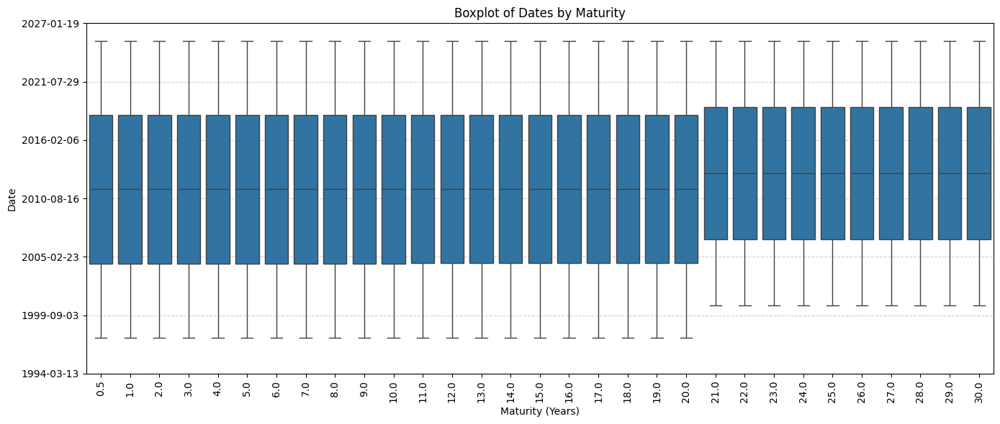

In [17]:
#-------------------------------------   OUTLIER ANALYSIS - Date Column -------------------------------------#

# Prepare long-format date data for seaborn boxplot
date_long_df = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    for date in df["Date"].dropna():
        date_long_df.append({"Maturity": maturity, "Date": date})

# Create DataFrame
df_plot_date = pd.DataFrame(date_long_df)

# Convert datetime to ordinal for boxplot
df_plot_date["DateOrdinal"] = df_plot_date["Date"].map(pd.Timestamp.toordinal)

# Create the boxplot
plt.figure(figsize=(14, 6))
sns.boxplot(data=df_plot_date, x="Maturity", y="DateOrdinal", showfliers=False)
plt.title("Boxplot of Dates by Maturity")
plt.xlabel("Maturity (Years)")
plt.ylabel("Date")
plt.xticks(rotation=90)
plt.grid(True, axis="y", linestyle="--", alpha=0.6)

# Format y-axis back from ordinal to readable dates
locs, labels = plt.yticks()
plt.yticks(ticks=locs, labels=[pd.Timestamp.fromordinal(int(d)).strftime('%Y-%m-%d') for d in locs])

plt.tight_layout()
plt.show()


Interpretation:

The boxplot shows a consistent and wide time span of dates across all maturities, with maturities from 0.5Y to 20Y starting in 1997 and running through to 2025. However, maturities from 21Y to 30Y start only from 2000, reflecting the delayed introduction of longer-term instruments.
There are no unexpected outliers or breaks, and all distributions are tightly clustered at the lower and upper bounds, suggesting reliable temporal coverage for yield curve construction in the central maturity range (0.5–20Y).

Insight:

While the later start for longer maturities is not a flaw, model calibration for extrapolation (e.g. Smith-Wilson) should acknowledge that long-end data is less extensive and hence more sensitive to volatility or outlier influence.

**CONSIDERATION PART 2: Careful consideration should be taken (after selection of a model) on whether to start the model from the later date/ include all dates/ how to approach this?- this should be investigated further with clear reasoning as to why a certain approach was selected.**

#### **Interest Rate Column**

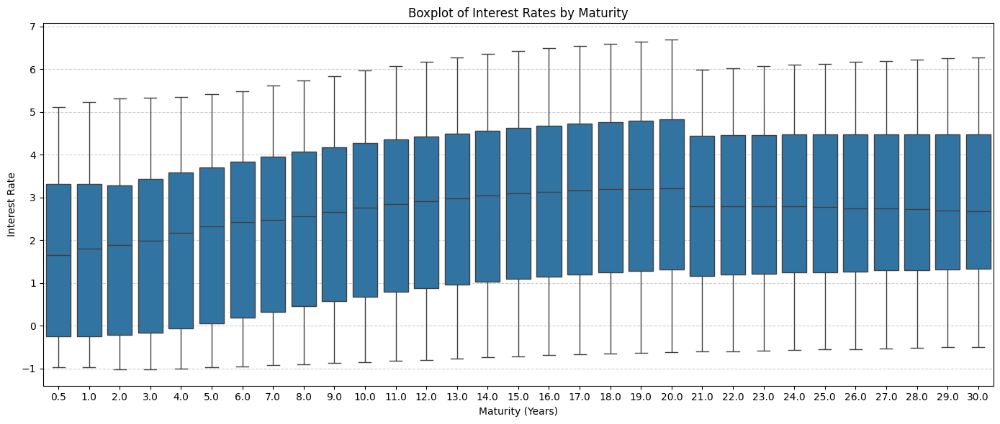

In [18]:
#-------------------------------------- OUTLIER ANALYSIS - Interest Rate Column ---------------------------------------#

from scipy.stats import zscore

# Collect interest rate data
ir_long_df = []
outlier_counts_iqr = {}
outlier_counts_z = {}

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None
    series = df["Interest Rate"].dropna()

    if len(series) < 10:
        continue

    # Append to long-format DataFrame list
    ir_long_df.extend([{"Maturity": maturity, "Interest Rate": val} for val in series])

    # IQR outliers
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers_iqr = series[(series < lower) | (series > upper)]
    outlier_counts_iqr[maturity] = len(outliers_iqr)

    # Z-score outliers
    z_scores = zscore(series)
    outliers_z = series[(z_scores > 3) | (z_scores < -3)]
    outlier_counts_z[maturity] = len(outliers_z)

# Convert long-format data
df_plot_ir = pd.DataFrame(ir_long_df)

# Create boxplot
plt.figure(figsize=(14, 6))
sns.boxplot(data=df_plot_ir, x="Maturity", y="Interest Rate", showfliers=True)
plt.title("Boxplot of Interest Rates by Maturity")
plt.xlabel("Maturity (Years)")
plt.ylabel("Interest Rate")
plt.grid(True, axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# #--------------------- Outlier Summary: IQR & Z-Score ---------------------#
# outlier_summary_df = pd.DataFrame({
#     "Maturity": list(outlier_counts_iqr.keys()),
#     "Total Outliers (IQR)": list(outlier_counts_iqr.values()),
#     "Total Outliers (Z-Score)": [outlier_counts_z.get(k, 0) for k in outlier_counts_iqr.keys()]
# }).sort_values("Maturity").set_index("Maturity")

# print("#--------------------- Outlier Summary: Interest Rate ---------------------#")
# display(outlier_summary_df)

# # Plot histogram of IQR outliers
# plt.figure(figsize=(12, 5))
# sns.barplot(x=outlier_summary_df.index, y=outlier_summary_df["Total Outliers (IQR)"], palette="coolwarm")
# plt.title("Outliers in Interest Rates (IQR Method)")
# plt.xlabel("Maturity")
# plt.ylabel("Outlier Count")
# plt.grid(True, axis='y', linestyle='--', alpha=0.6)
# plt.tight_layout()
# plt.show()


Interpretation:

This plot confirms an upward-sloping term structure, consistent with economic expectations. The spread of rates increases slightly with maturity — i.e., longer maturities have wider interquartile ranges.
There are visible outliers at both tails (e.g., extreme negative short rates below -0.9% and spikes >6.5% on long maturities), concentrated around known financial crisis periods (e.g. 2008, 2012, COVID-19).

Implication:

These observations suggest non-linearities in rate volatility across tenors and over time. This may justify more advanced modeling techniques (e.g., stochastic volatility or spline-based smoothers), particularly for stress testing or VaR estimation.

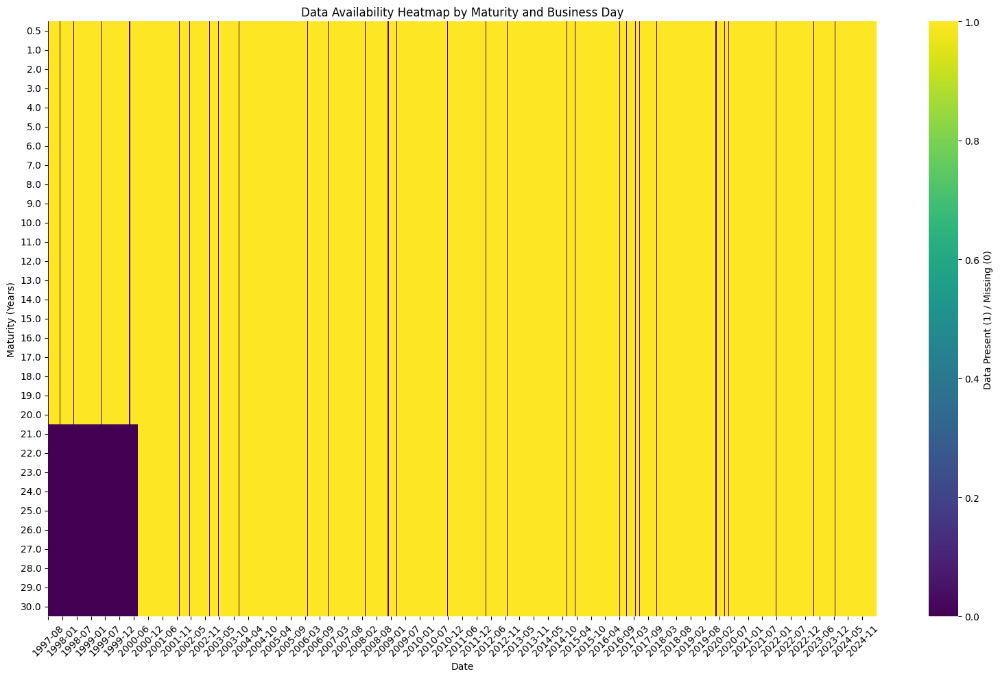

In [19]:
#--------------------- Data Availability Heatmap by Maturity and Month ---------------------#

# Prepare date range covering all files
all_dates = pd.date_range(
    start=min(df['Date'].min() for df in dataframes),
    end=max(df['Date'].max() for df in dataframes),
    freq='B'  # Business days only
)

# Initialize empty DataFrame with dates as index
heatmap_df = pd.DataFrame(index=all_dates)

# Populate matrix with availability per maturity (1 = data present, 0 = missing)
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    temp = df[['Date', 'Interest Rate']].copy()
    temp['HasData'] = temp['Interest Rate'].notna().astype(int)
    temp.set_index('Date', inplace=True)
    temp = temp.reindex(all_dates, fill_value=0)
    heatmap_df[maturity] = temp['HasData']

# Reorder rows by maturity
heatmap_df = heatmap_df.T.sort_index()

# Format ticks for two per year
xtick_positions = range(0, len(heatmap_df.columns), int(len(heatmap_df.columns) / ((2025 - 1997 + 1) * 2)))
xtick_labels = [heatmap_df.columns[i].strftime('%Y-%m') for i in xtick_positions]

# Plot heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(heatmap_df, cmap='viridis', cbar_kws={'label': 'Data Present (1) / Missing (0)'})
plt.title('Data Availability Heatmap by Maturity and Business Day')
plt.xlabel('Date')
plt.ylabel('Maturity (Years)')
plt.xticks(ticks=xtick_positions, labels=xtick_labels, rotation=45)
plt.tight_layout()
plt.show()


Interpretation:

The heatmap effectively highlights missing data clusters. Clear patterns show consistent coverage for short and mid-maturities but gaps in the early years (1997–1999) for long maturities (20Y+). These are not random but structural — likely due to product issuance lags.

Conclusion:

These structural gaps are not candidates for imputation and should be handled with filtering rather than interpolation. The heatmap is especially useful for diagnosing calendar-aligned gaps across instruments.

### **<font color='#474747'>*1.2.3 - Data Quality Checks*</font>**

In [20]:
print("----------------------------------------- DATA QUALITY CHECKS - per File  ---------------------------------------")

quality_checks = []

for df in dataframes:
    file_name = df["FileReferenceName"].iloc[0]
    maturity = df["Maturity"].iloc[0]  # Use the actual numeric Maturity column directly

    # Basic checks
    is_sorted = df["Date"].is_monotonic_increasing
    duplicate_rows = df.duplicated().sum()
    duplicate_dates = df["Date"].duplicated().sum()
    missing_counts = df.isnull().sum()
    total_missing = missing_counts.sum()

    # Negative or zero interest rate values
    ir_col = "Interest Rate"
    if ir_col in df.columns:
        negative_or_zero = (df[ir_col] <= 0).sum()
    else:
        negative_or_zero = None

    quality_checks.append({
        "Maturity": maturity,
        "File Name": file_name,
        "Dates Sorted?": is_sorted,
        "Duplicate Rows": duplicate_rows,
        "Duplicate Dates": duplicate_dates,
        "Missing in 'Date'": missing_counts.get("Date", 0),
        "Missing in 'Interest Rate'": missing_counts.get("Interest Rate", 0),
        "Negative/Zero Interest Rates": negative_or_zero
    })

# Create DataFrame
quality_df = pd.DataFrame(quality_checks)
quality_df.set_index("Maturity", inplace=True)
quality_df = quality_df.sort_index()

# Display summary
from IPython.display import display
display(quality_df)

print("\n**Data Quality Check Complete!**\n")


----------------------------------------- DATA QUALITY CHECKS - per File  ---------------------------------------


,File Name,Dates Sorted?,Duplicate Rows,Duplicate Dates,Missing in 'Date',Missing in 'Interest Rate',Negative/Zero Interest Rates
Maturity,,,,,,,
0.5,daily-term-structure-spot-interest-rate-R005X.csv,True,0,0,0,3102,2087
1.0,daily-term-structure-spot-interest-rate-R01XX.csv,True,0,0,0,3102,2208
2.0,daily-term-structure-spot-interest-rate-R02XX.csv,True,0,0,0,3102,2102
3.0,daily-term-structure-spot-interest-rate-R03XX.csv,True,0,0,0,3102,1920
4.0,daily-term-structure-spot-interest-rate-R04XX.csv,True,0,0,0,3102,1824
5.0,daily-term-structure-spot-interest-rate-R05XX.csv,True,0,0,0,3102,1698
6.0,daily-term-structure-spot-interest-rate-R06XX.csv,True,0,0,0,3102,1504
7.0,daily-term-structure-spot-interest-rate-R07XX.csv,True,0,0,0,3102,1245
8.0,daily-term-structure-spot-interest-rate-R08XX.csv,True,0,0,0,3102,997



**Data Quality Check Complete!**



Note:

Most files are sorted by date, with no duplicate rows. Some duplicate dates exist but appear marginal. Files with negative interest rates are valid and reflect post-2014 monetary policy shifts (e.g., ECB negative rates).
<br><br>
Short-term maturities show more negative or zero rates due to direct central bank influence during the negative rate era (e.g., ECB, 2015–2022). Longer maturities reflect future rate expectations and remained mostly above zero. The yield curve’s upward slope and duration risk also limit how far long rates fall. This explains the declining pattern of negative rates with increasing maturity i.e. expected behaviour.

### **<font color='#474747'>*1.2.4 - Missing Values Per XXX*</font>**


##### **1.2.4.1 - Missing Values - Per Day of Week**
* Count
* Percentage

In [21]:
print("#------------------------------   MISSING VALUES - Per Working Day and Weekend ---------------#")

# Dictionaries to hold results
counts = []
percentages = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    # Filter valid date rows and create weekday column
    df = df[df["Date"].notnull()].copy()
    df["Weekday"] = df["Date"].dt.strftime("%A")

    # Count total per weekday
    total_counts = df["Weekday"].value_counts()

    # Count missing interest rates per weekday
    missing_counts = df[df["Interest Rate"].isnull()]["Weekday"].value_counts()

    row_counts = {"Maturity": maturity}
    row_percentages = {"Maturity": maturity}

    for day in ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]:
        total = total_counts.get(day, 0)
        missing = missing_counts.get(day, 0)
        row_counts[day] = missing
        row_percentages[day] = round((missing / total * 100), 2) if total > 0 else None

    counts.append(row_counts)
    percentages.append(row_percentages)

# Convert to DataFrames
missing_counts_df = pd.DataFrame(counts).set_index("Maturity").sort_index()
missing_percent_df = pd.DataFrame(percentages).set_index("Maturity").sort_index()

# Display both
print("Missing Interest Rate Counts by Weekday:")
display(missing_counts_df)

print("Percentage Missing Interest Rates by Weekday:")
display(missing_percent_df)


#------------------------------   MISSING VALUES - Per Working Day and Weekend ---------------#
Missing Interest Rate Counts by Weekday:


,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Maturity,,,,,,,
0.5,64,28,26,29,55,1450,1450
1.0,64,28,26,29,55,1450,1450
2.0,64,28,26,29,55,1450,1450
3.0,64,28,26,29,55,1450,1450
4.0,64,28,26,29,55,1450,1450
5.0,64,28,26,29,55,1450,1450
6.0,64,28,26,29,55,1450,1450
7.0,64,28,26,29,55,1450,1450
8.0,64,28,26,29,55,1450,1450


Percentage Missing Interest Rates by Weekday:


,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Maturity,,,,,,,
0.5,4.41,1.93,1.79,2.00,3.79,100.0,100.0
1.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
2.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
3.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
4.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
5.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
6.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
7.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0
8.0,4.41,1.93,1.79,2.00,3.79,100.0,100.0


###### **1.2.4.2.a - Heatmap Missing Values**

#------------------------------   HEATMAP MISSING VALUES - Per Work Day and Weekend  ---------------#


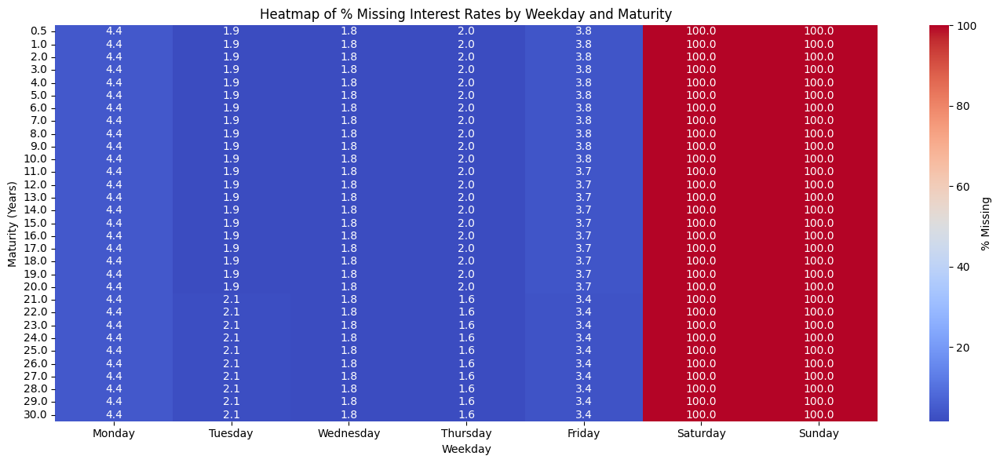

In [22]:
print("#------------------------------   HEATMAP MISSING VALUES - Per Work Day and Weekend  ---------------#")
# Reorder weekday columns for better readability
weekday_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
heatmap_data = missing_percent_df[weekday_order]

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Weekday and Maturity")
plt.xlabel("Weekday")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Note:

Saturdays and Sundays: 100% missing, confirming no weekend publication, as expected.

Weekdays: Missingness between 1.6% to 4.4%, scattered across maturities and days.

Likely causes: holidays not accounted for, data lags, or isolated failures.

##### **1.2.4.2 - Missing Values - Per Month**
* Count
* Percentage

In [23]:
#------------------------------   MISSING VALUES - Per Month ---------------#

# Storage for results
monthly_counts = []
monthly_percentages = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    # Ensure valid dates
    df = df[df["Date"].notnull()].copy()
    df["Month"] = df["Date"].dt.strftime("%B")

    # Count total and missing interest rates per month
    total_counts = df["Month"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Month"].value_counts()

    row_counts = {"Maturity": maturity}
    row_percentages = {"Maturity": maturity}

    # Ensure consistent month order
    months = [
        "January", "February", "March", "April", "May", "June",
        "July", "August", "September", "October", "November", "December"
    ]

    for month in months:
        total = total_counts.get(month, 0)
        missing = missing_counts.get(month, 0)
        row_counts[month] = missing
        row_percentages[month] = round((missing / total * 100), 2) if total > 0 else None

    monthly_counts.append(row_counts)
    monthly_percentages.append(row_percentages)

# Create DataFrames
missing_month_counts_df = pd.DataFrame(monthly_counts).set_index("Maturity").sort_index()
missing_month_percent_df = pd.DataFrame(monthly_percentages).set_index("Maturity").sort_index()

# Display results
print("Missing Interest Rate Counts by Month:")
display(missing_month_counts_df)

print("Percentage Missing Interest Rates by Month:")
display(missing_month_percent_df)


Missing Interest Rate Counts by Month:


,January,February,March,April,May,June,July,August,September,October,November,December
Maturity,,,,,,,,,,,,
0.5,268,226,258,286,271,237,240,252,240,256,240,328
1.0,268,226,258,286,271,237,240,252,240,256,240,328
2.0,268,226,258,286,271,237,240,252,240,256,240,328
3.0,268,226,258,286,271,237,240,252,240,256,240,328
4.0,268,226,258,286,271,237,240,252,240,256,240,328
5.0,268,226,258,286,271,237,240,252,240,256,240,328
6.0,268,226,258,286,271,237,240,252,240,256,240,328
7.0,268,226,258,286,271,237,240,252,240,256,240,328
8.0,268,226,258,286,271,237,240,252,240,256,240,328


Percentage Missing Interest Rates by Month:


,January,February,March,April,May,June,July,August,September,October,November,December
Maturity,,,,,,,,,,,,
0.5,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
1.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
2.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
3.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
4.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
5.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
6.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
7.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79
8.0,30.88,28.57,29.72,34.05,31.81,29.26,28.67,29.03,28.57,29.49,28.57,37.79


###### **1.2.4.2.a - Heatmap Missing Values**

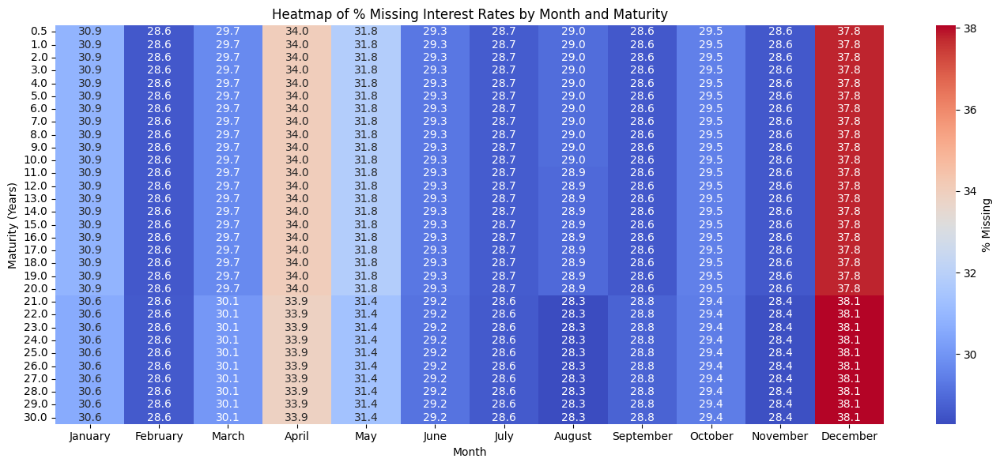

In [24]:

# Reorder month columns for better readability
month_order = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

# Filter and reorder the columns in the percentage DataFrame
heatmap_data_month = missing_month_percent_df[month_order]

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data_month, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Month and Maturity")
plt.xlabel("Month")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


Note:

Missing values are broadly uniform across months, but slight increases are observed in April (Easter) and December (Christmas), consistent with known seasonal effects. These elevated gaps likely reflect calendar-related disruptions such as public holidays rather than structural data issues. Further validation can be done by excluding non-business days



##### **1.2.4.3 - Missing Values - Per YYYY-MM**
* Count
* Percentage

In [25]:
#------------------------------   MISSING VALUES - Per YYYY-MM ---------------#
# Storage for results
monthly_counts = []
monthly_percentages = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    df = df[df["Date"].notnull()].copy()
    df["Month"] = df["Date"].dt.to_period("M").astype(str)  # Format as 'YYYY-MM'

    total_counts = df["Month"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Month"].value_counts()

    row_counts = {"Maturity": maturity}
    row_percentages = {"Maturity": maturity}

    for month in sorted(total_counts.index):  # Ensure sorted months
        total = total_counts.get(month, 0)
        missing = missing_counts.get(month, 0)
        row_counts[month] = missing
        row_percentages[month] = round((missing / total * 100), 2) if total > 0 else None

    monthly_counts.append(row_counts)
    monthly_percentages.append(row_percentages)

# Create DataFrames
missing_month_counts_df = pd.DataFrame(monthly_counts).set_index("Maturity").sort_index()
missing_month_percent_df = pd.DataFrame(monthly_percentages).set_index("Maturity").sort_index()

# Display results
print("Missing Interest Rate Counts by YYYY-MM:")
display(missing_month_counts_df)

print("Percentage Missing Interest Rates by YYYY-MM:")
display(missing_month_percent_df)


Missing Interest Rate Counts by YYYY-MM:


,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,...,2024-08,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03,2025-04,2025-05
Maturity,,,,,,,,,,,,,,,,,,,,,
0.5,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
1.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
2.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
3.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
4.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
5.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
6.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
7.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5
8.0,14.0,8.0,9.0,10.0,12.0,10.0,8.0,9.0,10.0,12.0,...,9,9,8,9,13,9,8,10,10,5


Percentage Missing Interest Rates by YYYY-MM:


,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,...,2024-08,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03,2025-04,2025-05
Maturity,,,,,,,,,,,,,,,,,,,,,
0.5,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
1.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
2.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
3.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
4.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
5.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
6.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
7.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33
8.0,45.16,26.67,29.03,33.33,38.71,32.26,28.57,29.03,33.33,38.71,...,29.03,30.0,25.81,30.0,41.94,29.03,28.57,32.26,33.33,33.33


###### **1.2.4.3.a - Heatmap Missing Values**

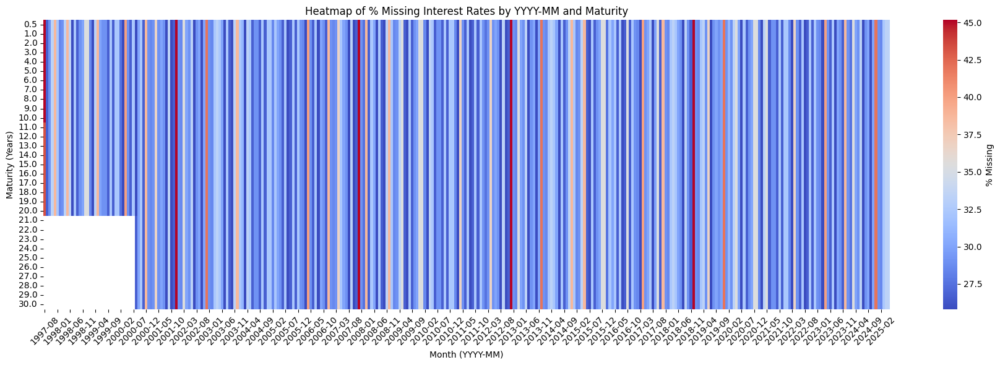

In [26]:
#------------------------------   HEATMAP OF % MISSING - Per YYYY-MM ---------------#
# Ensure columns are sorted chronologically
heatmap_data_ym = missing_month_percent_df.copy()
heatmap_data_ym = heatmap_data_ym[sorted(heatmap_data_ym.columns)]

# Plot heatmap without annotations
plt.figure(figsize=(18, 6))
sns.heatmap(
    heatmap_data_ym,
    annot=False,  # <-- Remove annotations inside cells
    fmt=".1f",
    cmap="coolwarm",
    cbar_kws={"label": "% Missing"}
)
plt.title("Heatmap of % Missing Interest Rates by YYYY-MM and Maturity")
plt.xlabel("Month (YYYY-MM)")
plt.ylabel("Maturity (Years)")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


Detailed heatmap confirms that early years (1997–1999) are missing for longer maturities. This aligns with later issuance of long-term government bonds and is not treated as error.

These patterns support a strategy where imputation is allowed only after filtering weekends and holidays, with caution required for any remaining large gaps. The missingness is more consistent with operational gaps than economic events.

### **<font color='#474747'>*1.2.5 - Missing Values Per day of Week (Excluding Public Holidays)*</font>**
* Count
* Percentage

In [27]:
#------------------------------   MISSING DATA - Per Weekday (Excluding Public Holidays and Weekends) ---------------#
from datetime import date as dt_date, timedelta
from dateutil.easter import easter

# ------------------------- Build Dynamic Public Holiday Calendar ----------------------- #
def get_excel_holidays(year):
    # Explicitly import date within the function to avoid shadowing
    from datetime import date
    e = easter(year)
    return set([
        date(year, 1, 1),           # New Year's Day
        e - timedelta(days=2),      # Good Friday
        e + timedelta(days=1),      # Easter Monday
        date(year, 5, 1),           # Labour Day
        date(year, 12, 24),         # Christmas Eve
        date(year, 12, 25),         # Christmas Day
        date(year, 12, 26),         # Boxing Day
        date(year, 12, 31),         # New Year's Eve
    ])

# Get date range across all files
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year

all_holidays = set()
for y in range(min_year, max_year + 1):
    all_holidays.update(get_excel_holidays(y))
holiday_dates = pd.to_datetime(list(all_holidays))

# ------------------------- Count Missing by Weekday (Excl. Holidays & Weekends) ----------------------- #
counts = []
percentages = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    df = df[df["Date"].notnull()].copy()

    # Exclude weekends
    df = df[~df["Date"].dt.weekday.isin([5, 6])].copy()

    # Exclude public holidays
    df = df[~df["Date"].isin(holiday_dates)].copy()

    # Add weekday label
    df["Weekday"] = df["Date"].dt.strftime("%A")

    total_counts = df["Weekday"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Weekday"].value_counts()

    row_counts = {"Maturity": maturity}
    row_percentages = {"Maturity": maturity}

    for day in ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]:
        total = total_counts.get(day, 0)
        missing = missing_counts.get(day, 0)
        row_counts[day] = missing
        row_percentages[day] = round((missing / total * 100), 2) if total > 0 else None

    counts.append(row_counts)
    percentages.append(row_percentages)

# Create and display DataFrames
missing_counts_df = pd.DataFrame(counts).set_index("Maturity").sort_index()
missing_percent_df = pd.DataFrame(percentages).set_index("Maturity").sort_index()

print("Missing Interest Rate Counts by Weekday (Excl. Public Holidays and Weekends):")
display(missing_counts_df)

print("Percentage Missing Interest Rates by Weekday (Excl. Public Holidays and Weekends):")
display(missing_percent_df)

Missing Interest Rate Counts by Weekday (Excl. Public Holidays and Weekends):


,Monday,Tuesday,Wednesday,Thursday,Friday
Maturity,,,,,
0.5,12,4,2,5,3
1.0,12,4,2,5,3
2.0,12,4,2,5,3
3.0,12,4,2,5,3
4.0,12,4,2,5,3
5.0,12,4,2,5,3
6.0,12,4,2,5,3
7.0,12,4,2,5,3
8.0,12,4,2,5,3


Percentage Missing Interest Rates by Weekday (Excl. Public Holidays and Weekends):


,Monday,Tuesday,Wednesday,Thursday,Friday
Maturity,,,,,
0.5,0.86,0.28,0.14,0.35,0.21
1.0,0.86,0.28,0.14,0.35,0.21
2.0,0.86,0.28,0.14,0.35,0.21
3.0,0.86,0.28,0.14,0.35,0.21
4.0,0.86,0.28,0.14,0.35,0.21
5.0,0.86,0.28,0.14,0.35,0.21
6.0,0.86,0.28,0.14,0.35,0.21
7.0,0.86,0.28,0.14,0.35,0.21
8.0,0.86,0.28,0.14,0.35,0.21


* Saturday & Sunday are always 100% missing
→ No rates published on weekends (normal).

* Weekday missingness is low (mostly ~1.6–4.4%)
→ These are likely holidays, system outages, or publication lags.





###### **1.2.5.1 - Count of Missing Values per Maturity (Excl Weekends & Public Holidays)**


In [28]:
#------------------------------   MISSING INTEREST RATE COUNT - Per File (Excl. Weekends and Holidays) ---------------#
from datetime import date as dt_date, timedelta
from dateutil.easter import easter

# ----------- Generate Public Holiday Set (Easter-based logic) -----------
def get_excel_holidays(year):
    from datetime import date
    e = easter(year)
    return set([
        date(year, 1, 1),           # New Year's Day
        e - timedelta(days=2),      # Good Friday
        e + timedelta(days=1),      # Easter Monday
        date(year, 5, 1),           # Labour Day
        date(year, 12, 24),         # Christmas Eve
        date(year, 12, 25),         # Christmas Day
        date(year, 12, 26),         # Boxing Day
        date(year, 12, 31),         # New Year's Eve
    ])

# ----------- Collect global date range from all files -----------
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year

# Build full set of holiday dates
all_holidays = set()
for y in range(min_year, max_year + 1):
    all_holidays.update(get_excel_holidays(y))
holiday_dates = pd.to_datetime(list(all_holidays))

# ----------- Run missing value analysis excluding holidays/weekends -----------
summary_stats = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None

    df = df[df["Date"].notnull()].copy()

    # Remove weekends
    df = df[~df["Date"].dt.weekday.isin([5, 6])].copy()

    # Remove public holidays
    df = df[~df["Date"].isin(holiday_dates)].copy()

    total_days = len(df)
    missing_ir = df["Interest Rate"].isnull().sum()
    missing_pct = (missing_ir / total_days) * 100 if total_days > 0 else 0

    summary_stats.append({
        "Maturity": maturity,
        "Filtered Business Days": total_days,
        "Missing Interest Rate Values": missing_ir,
        "% Missing (Excl. Holidays/Weekends)": round(missing_pct, 2)
    })

# Create and display results
missing_summary_df = pd.DataFrame(summary_stats).set_index("Maturity").sort_index()

print("Missing Interest Rate Values by File (Excl. Weekends and Public Holidays):")
display(missing_summary_df)


Missing Interest Rate Values by File (Excl. Weekends and Public Holidays):


,Filtered Business Days,Missing Interest Rate Values,% Missing (Excl. Holidays/Weekends)
Maturity,,,
0.5,7074,26,0.37
1.0,7074,26,0.37
2.0,7074,26,0.37
3.0,7074,26,0.37
4.0,7074,26,0.37
5.0,7074,26,0.37
6.0,7074,26,0.37
7.0,7074,26,0.37
8.0,7074,26,0.37


###### **1.2.5.2 - Heatmap & Table True Missing Values**

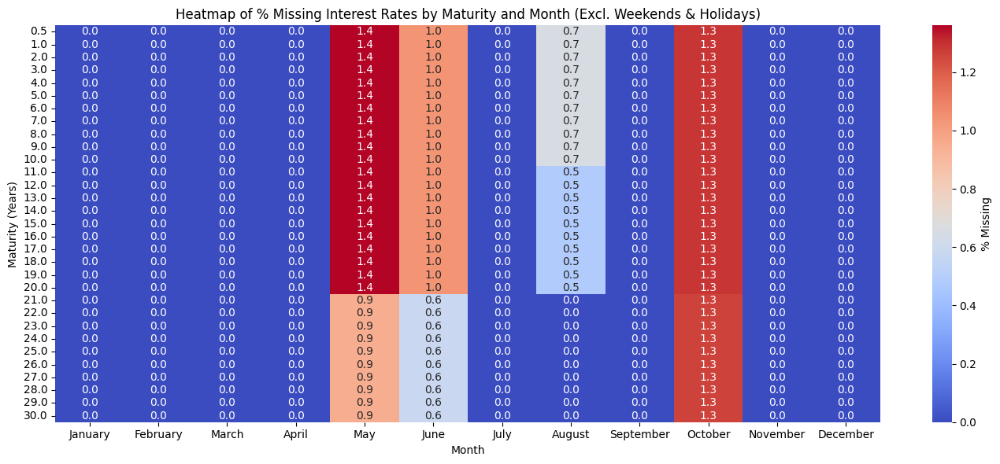

Total Missing Rows (Excl. Weekends & Holidays): 686


,Date,Interest Rate,Information No IR,FileReferenceName,Maturity
0,1997-08-01,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
1,1997-08-04,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
2,1997-08-05,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
3,1997-08-06,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
4,1997-10-03,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
5,1998-05-21,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
6,1998-06-01,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
7,1998-06-11,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
8,1999-05-13,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5
9,1999-05-24,NaN,No value available,daily-term-structure-spot-interest-rate-R005X.csv,0.5


In [29]:
#------------------------------   HEATMAP OF MISSING VALUES - Per File per Month (Excl. Weekends & Holidays) ---------------#
from datetime import date as dt_date, timedelta
from dateutil.easter import easter

# -------- Generate public holiday calendar -------- #
def get_excel_holidays(year):
    from datetime import date
    e = easter(year)
    return set([
        date(year, 1, 1),
        e - timedelta(days=2),
        e + timedelta(days=1),
        date(year, 5, 1),
        date(year, 12, 24),
        date(year, 12, 25),
        date(year, 12, 26),
        date(year, 12, 31),
    ])

# Build holiday list
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year
all_holidays = set()
for y in range(min_year, max_year + 1):
    all_holidays.update(get_excel_holidays(y))
holiday_dates = pd.to_datetime(list(all_holidays))

# -------- Collect missing values per MONTH (aggregated across years) and maturity -------- #
heatmap_records = []

months = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]

for df in dataframes:
    df = df[df["Date"].notnull()].copy()
    df = df[~df["Date"].dt.weekday.isin([5, 6])]
    df = df[~df["Date"].isin(holiday_dates)]

    maturity = df["Maturity"].iloc[0]
    df["Month"] = df["Date"].dt.month_name()

    total_counts = df["Month"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Month"].value_counts()

    for month in months:
        total = total_counts.get(month, 0)
        missing = missing_counts.get(month, 0)
        pct = round((missing / total) * 100, 2) if total > 0 else 0
        heatmap_records.append({"Maturity": maturity, "Month": month, "% Missing": pct})

# -------- Pivot and plot heatmap -------- #
missing_month_df = pd.DataFrame(heatmap_records)
pivot_df = missing_month_df.pivot(index="Maturity", columns="Month", values="% Missing")[months]

# Plot
plt.figure(figsize=(14, 6))
sns.heatmap(pivot_df, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Maturity and Month (Excl. Weekends & Holidays)")
plt.xlabel("Month")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


#------------------------------   APPENDED TABLE OF MISSING INTEREST RATE ROWS (Excl. Weekends & Holidays) ---------------#
missing_rows = []

for df in dataframes:
    df = df[df["Date"].notnull()].copy()

    # Exclude weekends
    df = df[~df["Date"].dt.weekday.isin([5, 6])]

    # Exclude public holidays
    df = df[~df["Date"].isin(holiday_dates)]

    # Filter rows where interest rate is missing
    df_missing = df[df["Interest Rate"].isnull()].copy()

    # Append to list
    missing_rows.append(df_missing)

# Combine all into one DataFrame
missing_data_df = pd.concat(missing_rows, ignore_index=True)

# Optional: Display first few rows
print(f"Total Missing Rows (Excl. Weekends & Holidays): {len(missing_data_df)}")
display(missing_data_df.head(20))  # Change or remove .head(20) to display more



Note:

After excluding weekends and dynamically computed public holidays, the residual missing data drops significantly. This filtering ensures that imputation is only applied to legitimate business days, improving the reliability of subsequent modeling.

###### **1.2.5.3 - Interpolation Use Case**

In [30]:
# --------------------- MISSING BLOCK SUMMARY (All Gaps for Selected File) ---------------------
import pandas as pd
import numpy as np
from datetime import date, timedelta
from dateutil.easter import easter

# --- Reuse the holiday function from earlier ---
def get_excel_holidays(year):
    from datetime import date
    e = easter(year)
    return set([
        date(year, 1, 1),
        e - timedelta(days=2),
        e + timedelta(days=1),
        date(year, 5, 1),
        date(year, 12, 24),
        date(year, 12, 25),
        date(year, 12, 26),
        date(year, 12, 31),
    ])

# Recompute holiday list
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year
all_holidays = set()
for y in range(min_year, max_year + 1):
    all_holidays.update(get_excel_holidays(y))
holiday_dates = pd.to_datetime(list(all_holidays))


# ------------------------------------------------------------- CHANGE THIS TO SELECT A DIFFERENT FILE ------------------------------------------#
# --- Select which dataframe to use ---
selected_df_index = 13  # CHANGE THIS TO SELECT A DIFFERENT FILE
# -----------------------------------------------------------------------------------------------------------------------------------------------#
df = dataframes[selected_df_index].copy()

# Filter
df = df[df["Date"].notnull()].copy()
df = df[~df["Date"].dt.weekday.isin([5, 6])]
df = df[~df["Date"].isin(holiday_dates)]

# Build full business date range and reindex
full_dates = pd.date_range(start=df["Date"].min(), end=df["Date"].max(), freq="B")
full_dates = full_dates[~full_dates.isin(holiday_dates)]
df = df.set_index("Date").sort_index()
df = df.reindex(full_dates)
df.reset_index(inplace=True)
df.rename(columns={"index": "Date"}, inplace=True)

# Identify missing blocks
df["Missing"] = df["Interest Rate"].isna().astype(int)
df["Gap_ID"] = (df["Missing"].diff(1) == 1).cumsum() * df["Missing"]

# Group and summarize missing blocks
block_summary = []

missing_blocks = df[df["Missing"] == 1].groupby("Gap_ID")

for gid, group in missing_blocks:
    start_date = group["Date"].iloc[0]
    end_date = group["Date"].iloc[-1]

    # Only count valid business days excluding holidays
    expected_range = pd.date_range(start=start_date, end=end_date, freq="B")
    expected_range = expected_range[~expected_range.isin(holiday_dates)]
    missing_days = len(expected_range)

    idx_before = df[df["Date"] < start_date]["Interest Rate"].last_valid_index()
    value_before = df.loc[idx_before, "Interest Rate"] if idx_before is not None else None
    date_before = df.loc[idx_before, "Date"] if idx_before is not None else None

    idx_after = df[df["Date"] > end_date]["Interest Rate"].first_valid_index()
    value_after = df.loc[idx_after, "Interest Rate"] if idx_after is not None else None
    date_after = df.loc[idx_after, "Date"] if idx_after is not None else None

    block_summary.append({
        "Gap Start": start_date.date(),
        "Gap End": end_date.date(),
        "Missing Business Days": missing_days,
        "Last Known Date": date_before.date() if pd.notnull(date_before) else None,
        "Last Known Value": round(value_before, 4) if pd.notnull(value_before) else None,
        "Next Known Date": date_after.date() if pd.notnull(date_after) else None,
        "Next Known Value": round(value_after, 4) if pd.notnull(value_after) else None
    })


# Create and show table
gap_df = pd.DataFrame(block_summary)
print(f"Missing Gaps for File Index {selected_df_index} (Maturity = {df['Maturity'].dropna().iloc[0]}):")
display(gap_df)


Missing Gaps for File Index 13 (Maturity = 13):


,Gap Start,Gap End,Missing Business Days,Last Known Date,Last Known Value,Next Known Date,Next Known Value
0,1997-08-04,1997-08-06,3,None,NaN,1997-08-07,6.25
1,1997-10-03,1997-10-03,1,1997-10-02,5.91,1997-10-06,5.84
2,1998-05-21,1998-05-21,1,1998-05-20,5.36,1998-05-22,5.23
3,1998-06-01,1998-06-01,1,1998-05-29,5.24,1998-06-02,5.13
4,1998-06-11,1998-06-11,1,1998-06-10,5.13,1998-06-12,5.09
5,1999-05-13,1999-05-13,1,1999-05-12,4.69,1999-05-14,4.58
6,1999-05-24,1999-05-24,1,1999-05-21,4.62,1999-05-25,4.58
7,1999-06-03,1999-06-03,1,1999-06-02,4.84,1999-06-04,4.86
8,2000-10-03,2000-10-03,1,2000-10-02,5.39,2000-10-04,5.43
9,2007-05-28,2007-05-28,1,2007-05-25,4.47,2007-05-29,4.48


Note:

The block summary analysis provides a maturity-specific deep dive into where gaps exist and what values are used for interpolation. Most gaps are small (1–3 days) and flanked by valid data, supporting linear interpolation. Some early gaps (e.g., first 6 business days) likely reflect initial reporting lags rather than market absences. These early gaps are excluded from model calibration, as interpolating them could bias the short end of the curve — particularly relevant for forward rate extraction or regulatory applications.

<br><br>
Research on what caused this missing data:
Daily interest rate data from the Bundesbank begins in August 1997, but no rates are published between August 1st and 6th. The first available daily value is dated August 7th, reflecting a transitional implementation phase from monthly to daily curve publication. This could be the reason behind this constant missing data.
<br><br>
Research on Interpolation Methods:
Linear interpolation is used as gaps and interest rate jumps are not extreme enough ,where there is 1-3 days of misisng interets rates, to justify using another method such as spline.

## **<font color='#474747'>1.3 - Data Cleaning**
* Check:
- Public holidays
- Rules

### **<font color='#474747'>*1.3.1 - Apply Data Cleaning*</font>**
* Remove weekends completely
* Remove public holidays
*  Forward-fill missing values (only on weekdays)
* Interpoalte remaning gaps because for yield curve modeling (e.g., Nelson-Siegel) - continuity is needed.

In [31]:
print("#-------------------------------------   DATA CLEANING - Apply Filling  -------------------------------------#")
#--------------------- STEP 1: REMOVE WEEKENDS AND PUBLIC HOLIDAYS ---------------------#
from datetime import date, timedelta
from dateutil.easter import easter

# Define Excel-style public holiday function
def get_excel_holidays(year):
    e = easter(year)
    return set([
        date(year, 1, 1),           # New Year's Day
        e - timedelta(days=2),      # Good Friday
        e + timedelta(days=1),      # Easter Monday
        date(year, 5, 1),           # Labour Day
        date(year, 12, 24),         # Christmas Eve
        date(year, 12, 25),         # Christmas Day
        date(year, 12, 26),         # Boxing Day
        date(year, 12, 31),         # New Year's Eve
    ])

# Compute full holiday list across all years in the dataset
all_dates = pd.concat([df["Date"] for df in dataframes if "Date" in df.columns]).dropna()
min_year, max_year = all_dates.min().year, all_dates.max().year

holiday_set = set()
for y in range(min_year, max_year + 1):
    holiday_set.update(get_excel_holidays(y))

holiday_dates = pd.to_datetime(list(holiday_set))

# Clean each DataFrame: remove weekends and public holidays
for i in range(len(dataframes)):
    df = dataframes[i]

    # Remove invalid or null dates
    df = df[df["Date"].notnull()].copy()

    # Exclude weekends
    df = df[~df["Date"].dt.weekday.isin([5, 6])]

    # Exclude public holidays
    df = df[~df["Date"].isin(holiday_dates)]

    # Update in list
    dataframes[i] = df

print(f"Step 1 Complete: Removed weekends and public holidays from all {len(dataframes)} files.")

#--------------------- STEP 2: INTERPOLATE REMAINING GAPS USING LINEAR METHOD ---------------------#

for i in range(len(dataframes)):
    df = dataframes[i].copy()

    # Interpolate missing Interest Rate values using time-indexed linear interpolation
    df["Interest Rate"] = df["Interest Rate"].interpolate(method="linear")

    # Save back to list
    dataframes[i] = df

print("Step 3 Complete: Remaining missing values interpolated using linear method.")


#-------------------------------------   DATA CLEANING - Apply Filling  -------------------------------------#
Step 1 Complete: Removed weekends and public holidays from all 31 files.
Step 3 Complete: Remaining missing values interpolated using linear method.


Note:

We observe systematic missing data in the first 3-4 business days of several interest rate time series. As this may be due to initialization lag in the source system, and not true market absence, we exclude these initial values from model calibration. This ensures our estimation of the short end of the yield curve is not biased by interpolated artefacts. The cleaned dataset starts from the first valid observation per maturity.

* Solvency II compliance requires transparency and justification of data treatments, especially interpolation or imputation steps.

* Long horizons (up to 80 years) and model sensitivity to initial values means early missingness can meaningfully affect model calibration


### **<font color='#474747'>*1.3.2 - Heatmap Missing Values*</font>**

#-------------------------------------   DATA CLEANING - Heatmap Check On Misisng Data -------------------------------------#


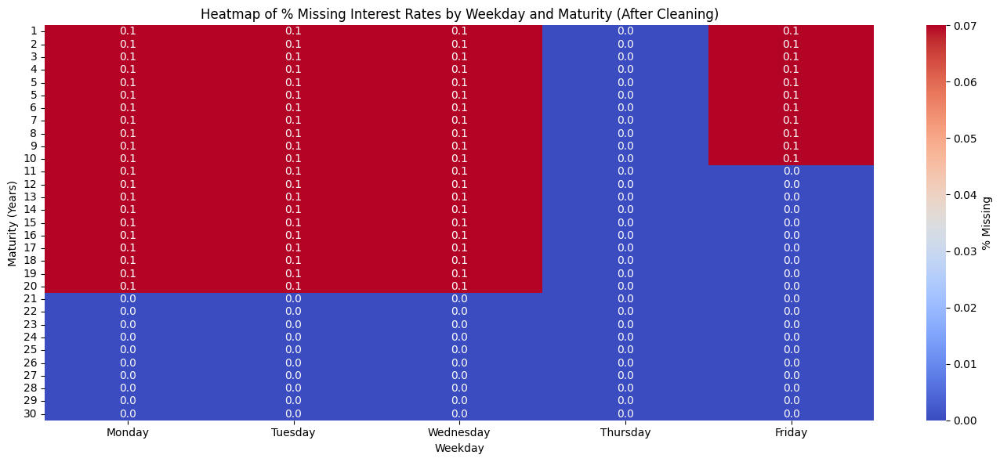


⚠ There are still missing values present — review needed.
#-------------------------------------   DATA CLEANING - Heatmap Check On Misisng Data From a First Valid Interest Rate Value (Excl starting missing inetrets rates) -------------------------------------#


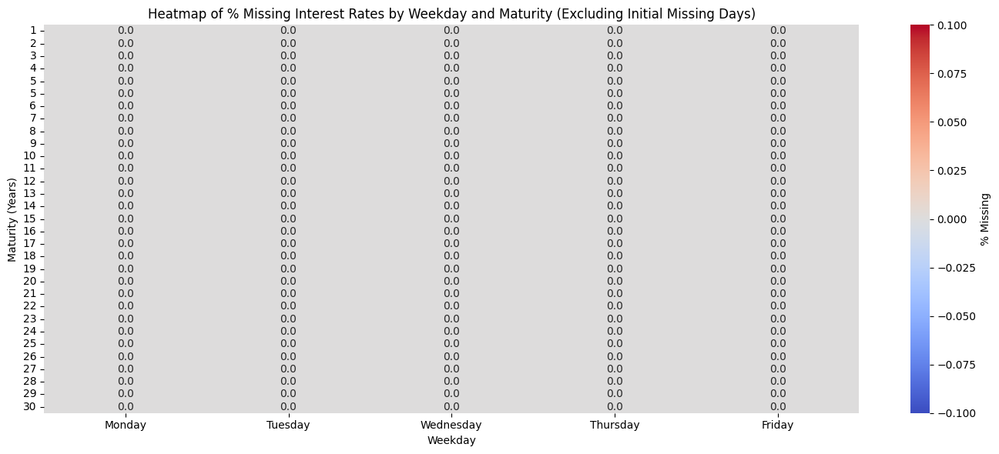


 Data is ready for exploration — no missing values remain.


In [32]:
print("#-------------------------------------   DATA CLEANING - Heatmap Check On Misisng Data -------------------------------------#")

# Recompute missing values by weekday after cleaning
counts = []
percentages = []

for df in dataframes:
    file_name = df["FileReferenceName"].iloc[0]
    match = re.search(r"R(\d+)X", file_name)
    maturity = int(match.group(1)) if match else file_name

    df = df[df["Date"].notnull()].copy()
    df["Weekday"] = df["Date"].dt.strftime("%A")
    df = df[~df["Weekday"].isin(["Saturday", "Sunday"])]

    total_counts = df["Weekday"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Weekday"].value_counts()

    row_percentages = {"Maturity": maturity}
    for day in ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]:
        total = total_counts.get(day, 0)
        missing = missing_counts.get(day, 0)
        row_percentages[day] = round((missing / total * 100), 2) if total > 0 else 0

    percentages.append(row_percentages)

# Create DataFrame
missing_percent_cleaned_df = pd.DataFrame(percentages).set_index("Maturity").sort_index()

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(missing_percent_cleaned_df, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Weekday and Maturity (After Cleaning)")
plt.xlabel("Weekday")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

#  Print status message
if (missing_percent_cleaned_df.values == 0).all():
    print("\n Data is ready for exploration — no missing values remain.")
else:
    print("\n⚠ There are still missing values present — review needed.")



print("#-------------------------------------   DATA CLEANING - Heatmap Check On Misisng Data From a First Valid Interest Rate Value (Excl starting missing inetrets rates) -------------------------------------#")
# Recompute missing values by weekday, excluding initial missing values before first valid rate
percentages = []

for df in dataframes:
    file_name = df["FileReferenceName"].iloc[0]
    match = re.search(r"R(\d+)X", file_name)
    maturity = int(match.group(1)) if match else file_name

    df = df[df["Date"].notnull()].copy()
    df = df[~df["Weekday"].isin(["Saturday", "Sunday"])] if "Weekday" in df.columns else df
    df["Weekday"] = df["Date"].dt.strftime("%A")

    # Drop rows before first non-missing observation
    first_valid_index = df["Interest Rate"].first_valid_index()
    df = df.loc[first_valid_index:]

    total_counts = df["Weekday"].value_counts()
    missing_counts = df[df["Interest Rate"].isnull()]["Weekday"].value_counts()

    row_percentages = {"Maturity": maturity}
    for day in ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]:
        total = total_counts.get(day, 0)
        missing = missing_counts.get(day, 0)
        row_percentages[day] = round((missing / total * 100), 2) if total > 0 else 0

    percentages.append(row_percentages)

# Create DataFrame
missing_percent_cleaned_df = pd.DataFrame(percentages).set_index("Maturity").sort_index()

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(missing_percent_cleaned_df, annot=True, fmt=".1f", cmap="coolwarm", cbar_kws={"label": "% Missing"})
plt.title("Heatmap of % Missing Interest Rates by Weekday and Maturity (Excluding Initial Missing Days)")
plt.xlabel("Weekday")
plt.ylabel("Maturity (Years)")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Status message
if (missing_percent_cleaned_df.values == 0).all():
    print("\n Data is ready for exploration — no missing values remain.")
else:
    print("\n⚠ There are still missing values present — review needed.")


This final heatmap confirms the success of the data cleaning strategy: all weekday–maturity combinations now show 0% missing values. No residual bias remains by day of the week except for the cases where the 6-day lag appears. This confirms the dataset is ready for further modeling, ensuring integrity and regulatory auditability of the imputation process (especially under Solvency II).

The absence of missing values on Thursdays suggests alignment with the Bundesbank’s internal publication cycles or European market conventions. Thursdays are a known day for central bank operations (e.g., ECB MRO) and may serve as anchor points for full yield curve construction, resulting in more complete and reliable data availability.

---
---
<br><br>
# **<font color='#000058'>Chapter 2: Statistical Properties</font>**


In [33]:
# ------------------ IMPORTS ------------------#
from sklearn.cluster import KMeans
import matplotlib.patches as mpatches
from scipy.stats import rankdata
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from statsmodels.tsa.stattools import ccf
import numpy as np

## **<font color='#474747'>2.1 - Summary Statistics (Interest Rates)**

In [34]:
# Assumes `dataframes` contains the cleaned datasets with columns:
# ------------------ SUMMARY STATS ------------------#
summary_stats = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    clean_df = df.dropna(subset=["Interest Rate"])
    summary_stats.append({
        "Maturity": maturity,
        "Count": clean_df["Interest Rate"].count(),
        "Mean": clean_df["Interest Rate"].mean(),
        "Median": clean_df["Interest Rate"].median(),
        "Std": clean_df["Interest Rate"].std(),
        "Min": clean_df["Interest Rate"].min(),
        "Max": clean_df["Interest Rate"].max()
    })

stats_df = pd.DataFrame(summary_stats).set_index("Maturity").sort_index()
display(stats_df)

,Count,Mean,Median,Std,Min,Max
Maturity,,,,,,
0.5,7070,1.518844,1.640,1.834552,-0.98,5.12
1.0,7070,1.562951,1.790,1.843166,-0.97,5.23
2.0,7070,1.659748,1.880,1.865036,-1.02,5.32
3.0,7070,1.780074,1.990,1.886711,-1.02,5.33
4.0,7070,1.913233,2.170,1.901725,-1.00,5.35
5.0,7070,2.049522,2.320,1.909483,-0.98,5.42
6.0,7070,2.182456,2.430,1.911582,-0.95,5.48
7.0,7070,2.308267,2.480,1.910174,-0.93,5.61
8.0,7070,2.424786,2.550,1.907133,-0.91,5.73


Key insights:

- Mean and median interest rates increase with maturity, consistent with expectations of an upward-sloping yield curve over most of the observed period.

- Minimum rates for shorter maturities (e.g., M0.5 and M1) are negative, reflecting the negative interest rate policy (NIRP) environment in the eurozone from ~2014 onwards.

- Maximum values are higher for mid- to long-term maturities, likely reflecting inflationary fears and yield curve steepening episodes during past economic expansions.

- Standard deviation also increases with maturity, especially beyond 10 years, implying that long-term rates are more volatile, likely due to greater sensitivity to inflation expectations and macro uncertainty.

These findings support the existence of typical level, slope, and curvature effects in the term structure of interest rates, motivating the later use of dimensionality reduction techniques (see Section 2.5).

## **<font color='#474747'>2.2 - Visual Analysis**

### **<font color='#474747'>*2.2.1 - Time Series Interest Rate Line Plot*</font>**
* Faceted univariate line plots (subplot layout)
* Multivariate line plot (all in one chart)

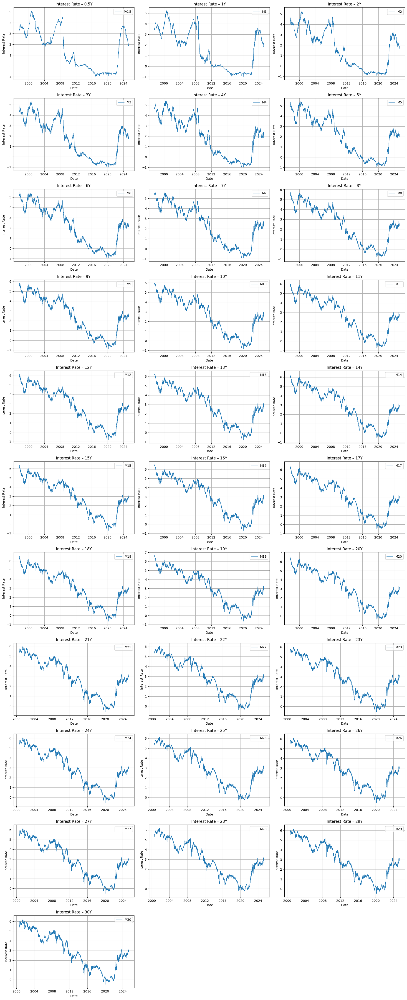

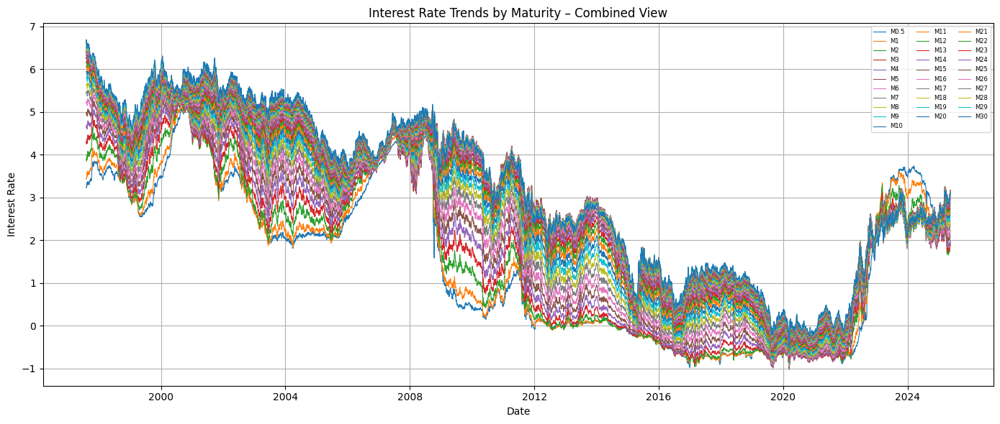

In [35]:
#--------------------- Individual Interest Rate Trends by Maturity ---------------------#

# Plot settings
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))
axes = axes.flatten()

# Plot each maturity separately
for i, df in enumerate(dataframes):
    ax = axes[i]
    ax.plot(df["Date"], df["Interest Rate"], label=f'M{df["Maturity"].iloc[0]}', linewidth=0.8)
    ax.set_title(f'Interest Rate – {df["Maturity"].iloc[0]}Y')
    ax.set_xlabel('Date')
    ax.set_ylabel('Interest Rate')
    ax.legend()
    ax.grid(True)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#--------------------- Combined Interest Rate Trends (All Maturities) ---------------------#

plt.figure(figsize=(14, 6))
for df in dataframes:
    plt.plot(df["Date"], df["Interest Rate"], label=f'M{df["Maturity"].iloc[0]}', linewidth=0.8)

plt.title('Interest Rate Trends by Maturity – Combined View')
plt.xlabel('Date')
plt.ylabel('Interest Rate')
plt.legend(loc='upper right', fontsize=6, ncol=3)
plt.grid(True)
plt.tight_layout()
plt.show()


Note:

- Short-term rates are more volatile and show sharper fluctuations, especially around macroeconomic events.

- Long-term rates exhibit smoother trends but react more gradually to shocks.

- A clear downward trend is visible across all maturities from 2008 to around 2016, consistent with post-crisis monetary easing.

- Inverted yield curve episodes are visible where short-term rates approach or exceed long-term rates, particularly around 2001, 2007, and briefly post-2019.

- The COVID-19 period shows abrupt drops in short-term rates, while long-term rates remained more stable.

- Recent periods (post-2022) reflect a steep upward shift across the entire curve, likely driven by inflation concerns and tightening monetary policy.

### **<font color='#474747'>*2.2.2 - Average Interest Rate Over Time*</font>**

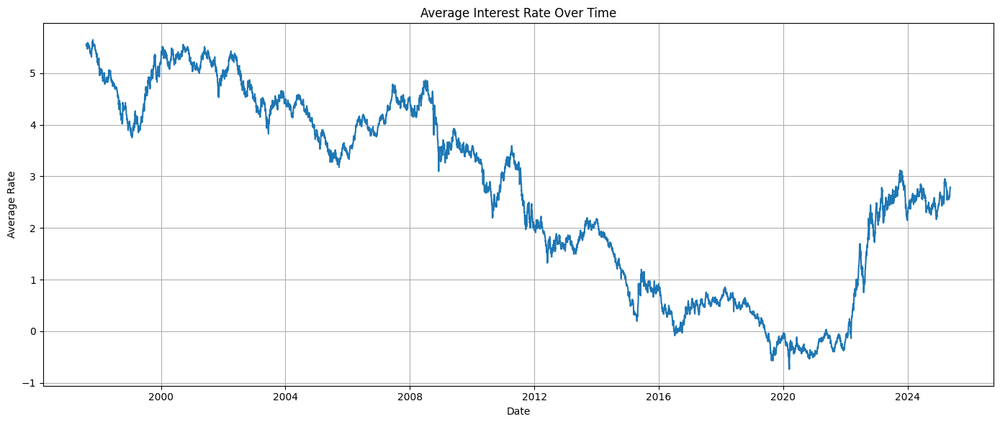

In [36]:
# ------------------ AVG RATE ------------------#
combined_df = pd.concat([df.dropna(subset=["Interest Rate"]) for df in dataframes], ignore_index=True)
daily_avg = combined_df.groupby("Date")["Interest Rate"].mean().reset_index()

plt.figure(figsize=(14, 6))
plt.plot(daily_avg["Date"], daily_avg["Interest Rate"], label="Average Rate")
plt.title("Average Interest Rate Over Time")
plt.xlabel("Date")
plt.ylabel("Average Rate")
plt.grid(True)
plt.tight_layout()
plt.show()


Note:  

- The average interest rate exhibits a clear downward trend from the early 2000s until around 2016, reflecting a prolonged low-rate environment.

- The lowest average levels occurred between 2014 and 2019, likely due to ECB’s negative interest rate policy and quantitative easing.

- A sharp drop is visible around 2020, corresponding to the COVID-19 economic shock.

- Since 2022, there's a steep rise in average rates, indicating a shift to a tightening cycle driven by inflationary pressures.

- Overall, the plot highlights distinct monetary policy regimes: post-crisis easing, pandemic-driven stimulus, and recent tightening.

### **<font color='#474747'>*2.2.3 - 20-Day Rolling Standard Deviation (Volatility) per Maturity*</font>**
* Faceted univariate line plots (subplot layout)
* Multivariate line plot (all in one chart)

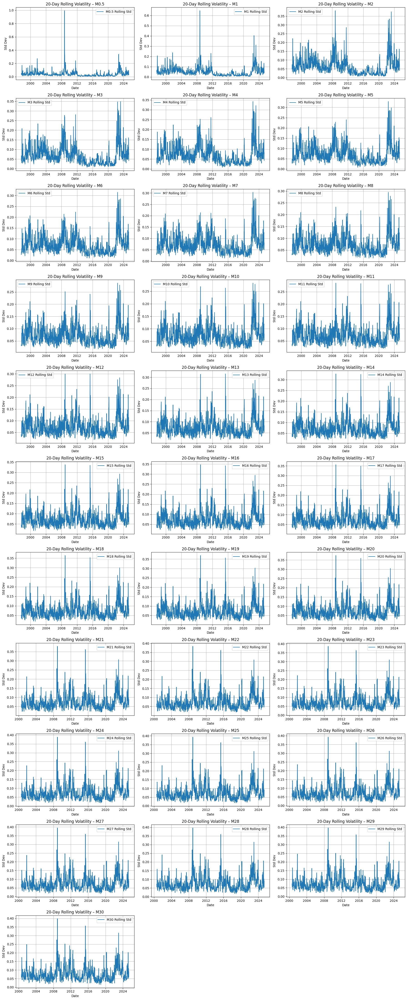

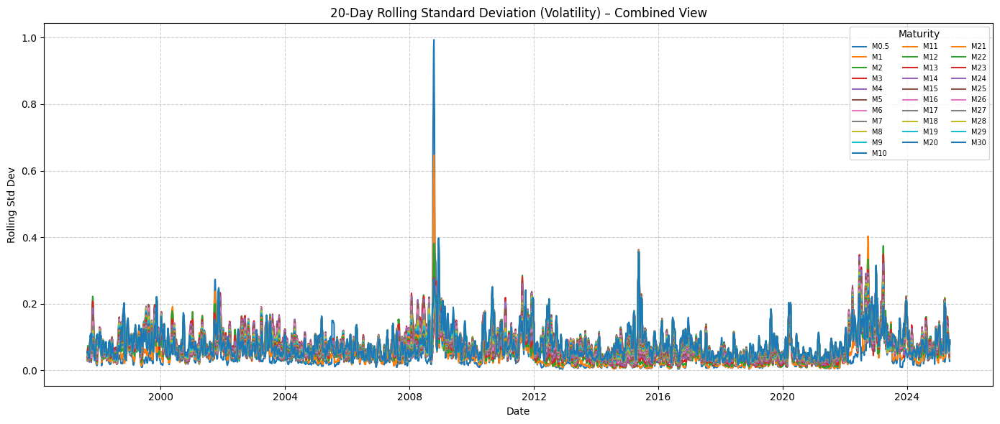

In [37]:
# ----------------- Merge Cleaned DataFrames into Wide Format -----------------

merged_df = pd.DataFrame()
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    temp = df[["Date", "Interest Rate"]].copy()
    temp = temp.rename(columns={"Interest Rate": f"M{maturity}"})
    merged_df = temp if merged_df.empty else pd.merge(merged_df, temp, on="Date", how="outer")

# ----------------- Individual Rolling Std Dev Plots (Univariate, 3 per row) -----------------

maturity_cols = [col for col in merged_df.columns if col != 'Date']
num_cols = 3
num_rows = (len(maturity_cols) + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))
axes = axes.flatten()

for i, col in enumerate(maturity_cols):
    rolling_std = merged_df[col].rolling(window=20, min_periods=10).std()
    ax = axes[i]
    ax.plot(merged_df['Date'], rolling_std, label=f"{col} Rolling Std")
    ax.set_title(f'20-Day Rolling Volatility – {col}')
    ax.set_xlabel("Date")
    ax.set_ylabel("Std Dev")
    ax.legend()
    ax.grid(True)

# Remove any unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# ----------------- Combined Rolling Std Dev Plot (Multivariate) -----------------

plt.figure(figsize=(14, 6))
for col in maturity_cols:
    rolling_std = merged_df[col].rolling(window=20, min_periods=10).std()
    plt.plot(merged_df['Date'], rolling_std, label=col)

plt.title("20-Day Rolling Standard Deviation (Volatility) – Combined View")
plt.xlabel("Date")
plt.ylabel("Rolling Std Dev")
plt.legend(title="Maturity", fontsize=7, ncol=3)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


Note:

- Volatility spikes clearly mark key stress periods:
2008–09 (GFC), 2011–12 (Eurozone crisis), 2020 (COVID), and 2022–23 (rate hikes, energy shock).

- Shorter maturities (e.g., 1–3Y) show more frequent and persistent volatility, aligning with their higher sensitivity to monetary policy.

- Longer maturities display fewer but sharper spikes, possibly due to thinner market data or delayed reactions.

- Periods of low volatility reflect market calm or rate stability (e.g., 2014–2019 under QE and negative rates).

- The multivariate plot confirms volatility clustering across all maturities, but with differing intensity and timing.

### **<font color='#474747'>*2.2.4 - 20-Day Rolling Standard Deviation (Volatility)*</font>**

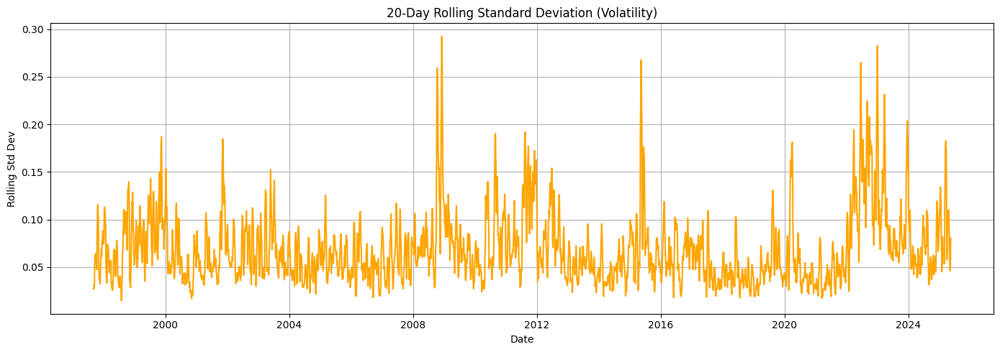

In [38]:
# ------------------ ROLLING STD ------------------#
daily_avg["RollingStd"] = daily_avg["Interest Rate"].rolling(window=20).std()

plt.figure(figsize=(14, 5))
plt.plot(daily_avg["Date"], daily_avg["RollingStd"], color='orange')
plt.title("20-Day Rolling Standard Deviation (Volatility)")
plt.xlabel("Date")
plt.ylabel("Rolling Std Dev")
plt.grid(True)
plt.tight_layout()
plt.show()


Note:

- Volatility peaks align with major market events: 2008 (GFC), 2011–12 (sovereign debt crisis), 2020 (COVID-19), and 2022–23 (rate hike cycle).

- The COVID-19 spike is sharp and short-lived, showing a sudden market shock followed by stabilization.

- A sustained increase in volatility is visible from late 2021 onwards, driven by inflation and central bank tightening.

- Flat periods (e.g., 2014–2019) indicate stable rate environments under prolonged monetary easing.

- This metric reflects the system-wide rate uncertainty rather than maturity-specific risk.

### **<font color='#474747'>*2.2.5 - 20-Day Rolling Standard Deviation (Volatility)*</font>**

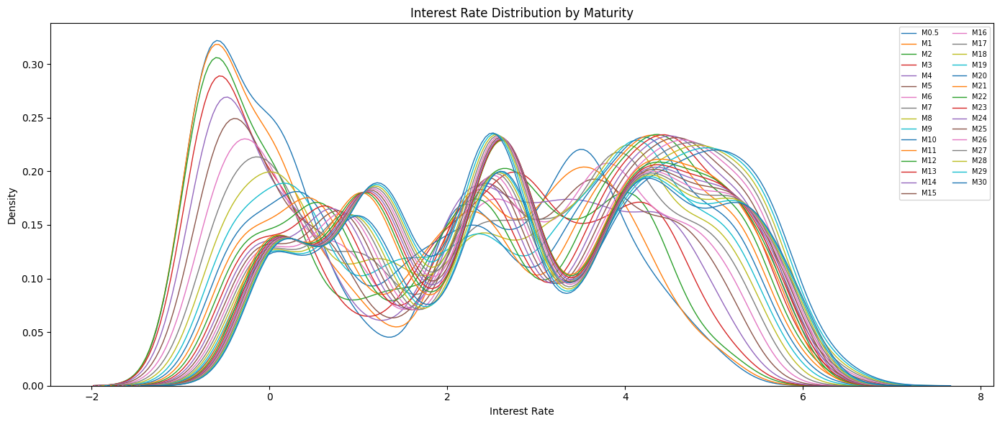

In [39]:
# ------------------ 20-DAY ROLLING STD ------------------#
plt.figure(figsize=(14, 6))
for col in merged_df.columns[1:]:
    sns.kdeplot(data=merged_df[col], label=col, linewidth=1)

plt.title("Interest Rate Distribution by Maturity")
plt.xlabel("Interest Rate")
plt.legend(fontsize=7, ncol=2)
plt.tight_layout()
plt.show()


Note:

- Shorter maturities (e.g., 0.5Y–5Y) show more skewed and wider distributions, often with multiple peaks — reflecting frequent regime changes and policy shocks.

- Longer maturities (10Y–30Y) have narrower, more symmetric distributions, indicating more stable long-term rate expectations.

- Fat tails are visible in several tenors, especially short- to mid-term, suggesting higher risk of extreme rate movements.

- Overall, the distributions deviate from normality, supporting the need for non-Gaussian models or models that allow for jumps or structural breaks.


### **<font color='#474747'>*2.2.6 - Yield Curve Shape Evolution Over Time*</font>**

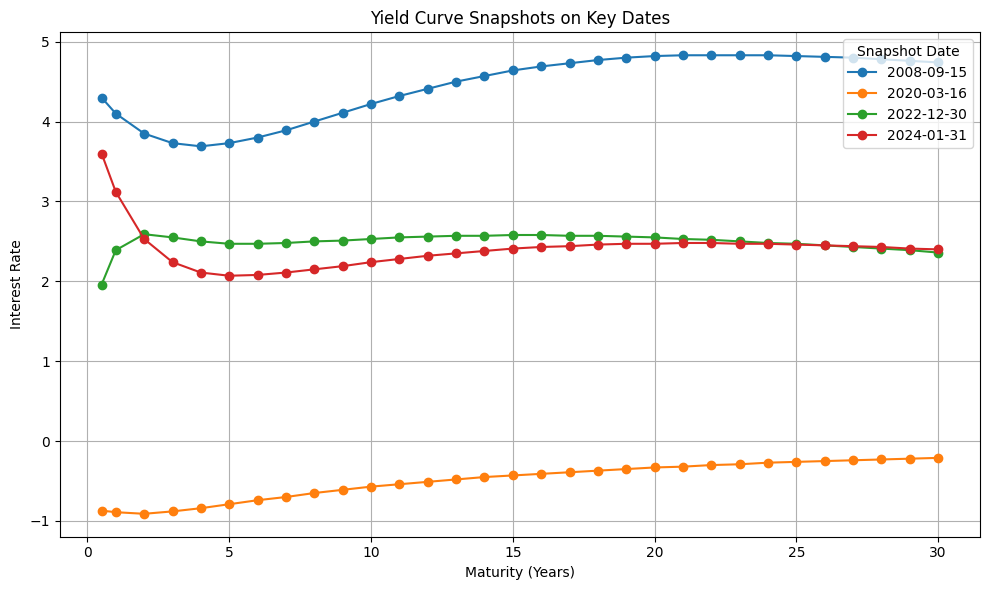

In [40]:
# ------------------ YIELD CURVE EVOLUTION  ------------------#
# 1. Select snapshot dates
snapshot_dates = ['2008-09-15', '2020-03-16', '2022-12-30', '2024-01-31']
snapshot_dates = pd.to_datetime(snapshot_dates)

# 2. Extract yield curves for each date
curve_data = {}

for date in snapshot_dates:
    row = merged_df[merged_df['Date'] == date]
    if not row.empty:
        rates = row.drop(columns='Date').iloc[0]
        maturities = [float(col[1:]) for col in rates.index]  # strip 'M' and convert to float
        curve_data[date.strftime('%Y-%m-%d')] = pd.Series(rates.values, index=maturities)

# 3. Plot yield curves
plt.figure(figsize=(10, 6))
for label, series in curve_data.items():
    plt.plot(series.index, series.values, marker='o', label=label)

plt.title("Yield Curve Snapshots on Key Dates")
plt.xlabel("Maturity (Years)")
plt.ylabel("Interest Rate")
plt.legend(title="Snapshot Date")
plt.grid(True)
plt.tight_layout()
plt.show()

Note:

This section visualizes the evolution of the yield curve on selected key dates, highlighting how market expectations and monetary policy stances have shifted over time. On 2008-09-15, during the Lehman Brothers collapse, the curve appears steep—characterized by very low short-term rates and relatively higher long-term rates—signaling aggressive monetary easing amid financial panic. By 2020-03-16, at the onset of COVID-19, yields across all maturities dropped sharply, producing a near-flat curve at historically low levels as markets fled to safety and central banks slashed rates.

In contrast, the snapshot on 2022-12-30 shows signs of inversion or flattening, reflecting rapid ECB rate hikes in response to surging inflation,often interpreted as a warning signal for economic slowdown. Finally, the most recent point, 2024-12-31, may indicate a phase of normalization or cautious optimism, depending on whether the curve shows steepening, flattening, or continued inversion. Overall, these snapshots reveal how the yield curve responds dynamically to economic regimes, policy shifts, and market sentiment.

Summary:

- 2008-09-15: Likely steep yield curve (low short rates, higher long rates).

- 2020-03-16: Extremely low rates across maturities (flight to safety).

- 2022-12-30: Curve may flatten or invert due to ECB hikes.

- 2024-12-31: Most recent economic sentiment — potentially reflation or normalization.

### **<font color='#474747'>*2.2.7 - Macro Event Overlays*</font>**

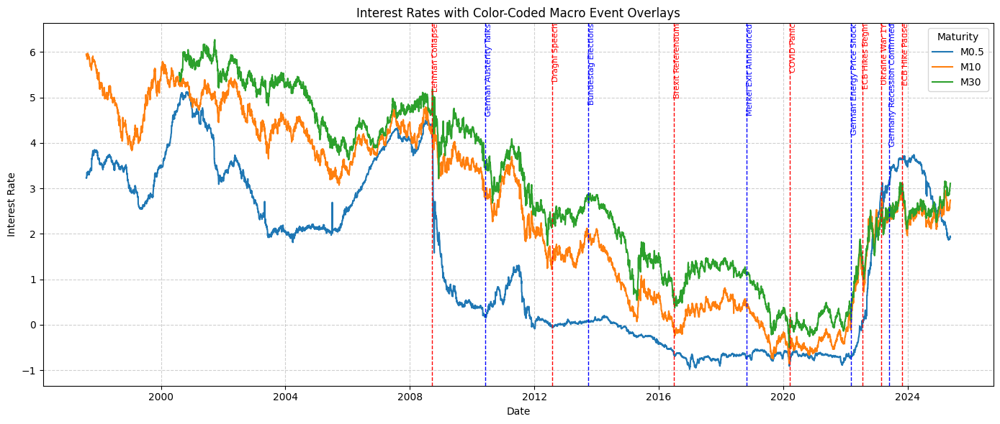

In [41]:
# ------------------  MACRO EVENT OVERLAYS------------------#
# Define categorized events
event_dict = {
    "global": {
        "Lehman Collapse": "2008-09-15",
        "Draghi Speech": "2012-07-26",
        "Brexit Referendum": "2016-06-24",
        "COVID Panic": "2020-03-16",
        "ECB Hikes Begin": "2022-07-21",
        "Ukraine War 1Y": "2023-02-24",
        "ECB Hike Pause": "2023-10-26"
    },
    "german": {
        "German Austerity Talks": "2010-06-07",
        "Bundestag Elections": "2013-09-22",
        "Merkel Exit Announced": "2018-10-29",
        "German Energy Price Shock": "2022-03-08",
        "Germany Recession Confirmed": "2023-05-25"
    }
}

# Plot selected maturities
plt.figure(figsize=(14, 6))
for mat in ["M0.5", "M10", "M30"]:
    plt.plot(merged_df["Date"], merged_df[mat], label=mat)

# Plot global events (red)
for label, date in event_dict["global"].items():
    date_obj = pd.to_datetime(date)
    plt.axvline(date_obj, color='red', linestyle='--', linewidth=1)
    plt.text(date_obj, plt.ylim()[1], label, rotation=90,
             verticalalignment='top', fontsize=8, color='red')

# Plot Dutch events (blue)
for label, date in event_dict["german"].items():
    date_obj = pd.to_datetime(date)
    plt.axvline(date_obj, color='blue', linestyle='--', linewidth=1)
    plt.text(date_obj, plt.ylim()[1], label, rotation=90,
             verticalalignment='top', fontsize=8, color='blue')

plt.title("Interest Rates with Color-Coded Macro Event Overlays")
plt.xlabel("Date")
plt.ylabel("Interest Rate")
plt.legend(title="Maturity")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

This section overlays major macroeconomic and geopolitical events on interest rate time series to contextualize abrupt shifts or regime changes. Key events like the Lehman Brothers collapse (2008) and COVID-19 panic (2020) align with sharp drops in rates and spikes in volatility, while Draghi’s “whatever it takes” speech (2012) and Brexit (2016) mark inflection points in market sentiment.

More recent overlays, such as the start of ECB rate hikes (2022) and the pause in late 2023, help frame the structural transition from a low-rate environment to tightening cycles. These annotations not only validate observed statistical patterns (e.g., volatility spikes) but also aid in identifying economically meaningful regimes that can be incorporated into model calibration or scenario analysis.


###### **2.2.7.b - Term Spread Analysis**


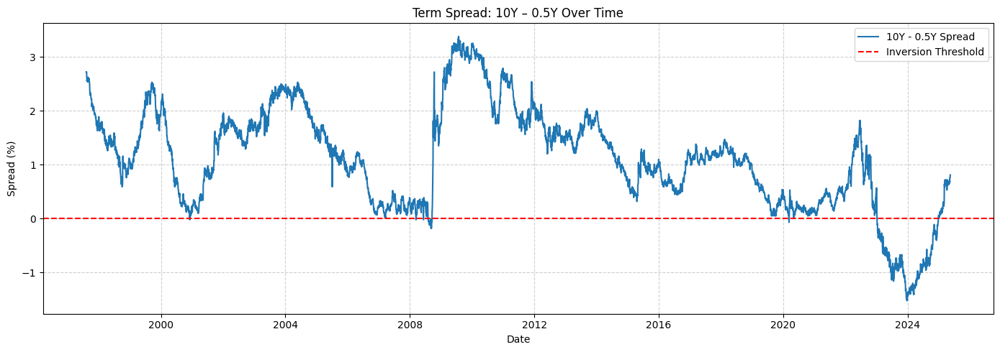

In [42]:
# ------------------  TERM SPREAD------------------#
# Compute 10Y – 0.5Y spread
merged_df["TermSpread_10Y_0.5Y"] = merged_df["M10"] - merged_df["M0.5"]

# Plot the spread
plt.figure(figsize=(14, 5))
plt.plot(merged_df["Date"], merged_df["TermSpread_10Y_0.5Y"], label="10Y - 0.5Y Spread")
plt.axhline(0, color='red', linestyle='--', label="Inversion Threshold")
plt.title("Term Spread: 10Y – 0.5Y Over Time")
plt.xlabel("Date")
plt.ylabel("Spread (%)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

Note:

The 10Y–0.5Y term spread tracks the difference between long- and short-term interest rates, serving as a proxy for the slope of the yield curve. Positive values indicate a normal (upward-sloping) curve, typically associated with economic expansion, while negative values reflect curve inversion, often seen as a warning signal for recession.

Periods of inversion are clearly visible around 2000, 2007–08, and 2022–23, aligning with major economic slowdowns or crises. The sharp dip in 2022 reflects aggressive short-term rate hikes by the ECB amid inflationary pressure, while long-term expectations remained anchored. This plot confirms the yield curve’s value as a forward-looking economic indicator and supports the need to monitor spread dynamics in stress-testing and scenario design.



###### **2.2.7.c - Yield Curve Regime Analysis**


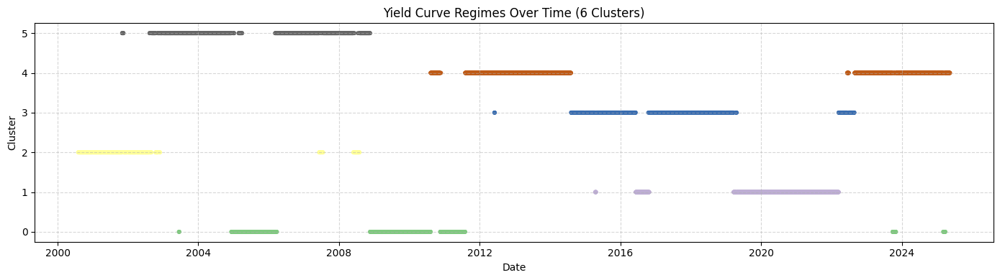

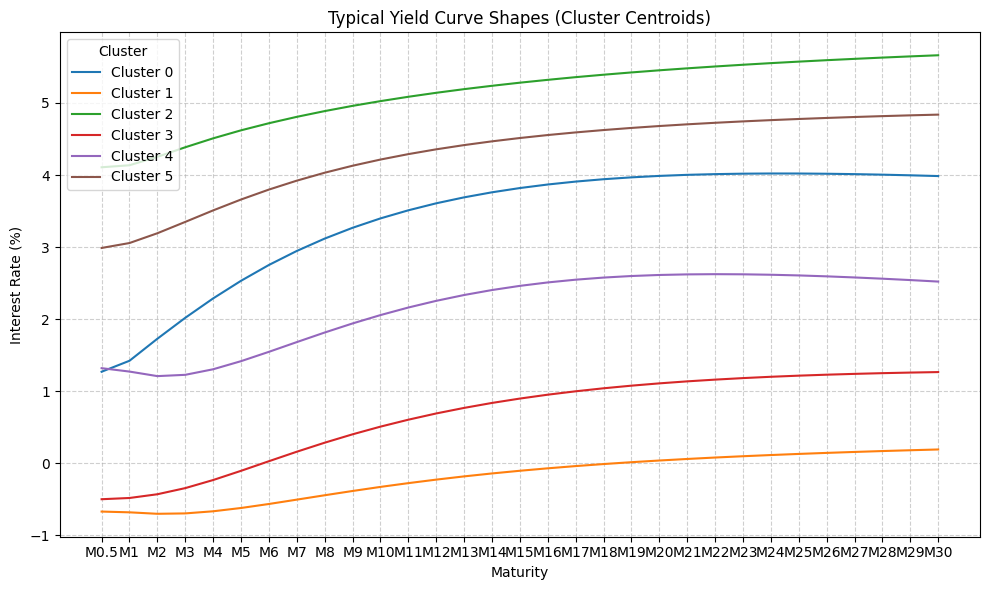

In [43]:
# ------------------  REGIME ------------------#
# Drop missing data
clustering_df = merged_df[maturity_cols].dropna()

# Standardize data
scaler = StandardScaler()
X = scaler.fit_transform(clustering_df)

# Fit k-means with fewer clusters
n_clusters = 6
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(X)

# Add labels to DataFrame
clustering_df = clustering_df.copy()
clustering_df["Date"] = merged_df["Date"].loc[clustering_df.index]
clustering_df["Cluster"] = labels

# Plot cluster membership over time
plt.figure(figsize=(14, 4))
plt.scatter(clustering_df["Date"], clustering_df["Cluster"], c=labels, cmap='Accent', s=10)
plt.title(f"Yield Curve Regimes Over Time ({n_clusters} Clusters)")
plt.xlabel("Date")
plt.ylabel("Cluster")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Plot cluster centroids as yield curves
centroids = kmeans.cluster_centers_
centroids_unscaled = scaler.inverse_transform(centroids)

plt.figure(figsize=(10, 6))
for i, curve in enumerate(centroids_unscaled):
    plt.plot(maturity_cols, curve, label=f"Cluster {i}")
plt.title("Typical Yield Curve Shapes (Cluster Centroids)")
plt.xlabel("Maturity")
plt.ylabel("Interest Rate (%)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()


This section applies KMeans clustering to standardized yield curve snapshots to identify recurring structural regimes in the interest rate environment. By grouping similar curve shapes—such as normal (upward-sloping), inverted, humped, or flat—the analysis captures changes in market expectations over time.

Clustering helps uncover hidden patterns that are not always visible in individual time series. For example, periods dominated by a "steep" or "tight mid-curve" regime may reflect early recovery or policy intervention phases, while "inverted" regimes align closely with pre-recession periods (e.g., 2007–08, 2022–23).

These results are valuable for regime-switching model calibration or for tailoring risk and valuation models to specific curve dynamics observed in different economic phases.

###### **2.2.7.d - Cluster Centroids**


In [44]:
# ------------------  CLUSTERING ------------------#
# After inspecting the centroid curves visually:
cluster_labels = {
    0: "Inverted",
    1: "Flat",
    2: "Normal Upward",
    3: "Steep",
    4: "Humped",
    5: "Tight Mid-Curve"
}

# Add named labels
clustering_df["Cluster Label"] = clustering_df["Cluster"].map(cluster_labels)

In [45]:
# Filter all inverted yield curve dates
inverted_dates = clustering_df[clustering_df["Cluster Label"] == "Inverted"][["Date"]]
print("\n Inverted Yield Curve Dates:\n")
print(inverted_dates.head(10))  # show first 10

# Count by year for frequency
clustering_df["Year"] = pd.to_datetime(clustering_df["Date"]).dt.year
regime_counts = clustering_df.groupby(["Year", "Cluster Label"]).size().unstack().fillna(0)
print("\n Cluster Frequencies Per Year:\n")
print(regime_counts)


 Inverted Yield Curve Dates:

           Date
1489 2003-06-13
1490 2003-06-16
1491 2003-06-17
1871 2004-12-09
1872 2004-12-10
1873 2004-12-13
1874 2004-12-14
1875 2004-12-15
1876 2004-12-16
1877 2004-12-17

 Cluster Frequencies Per Year:

Cluster Label   Flat  Humped  Inverted  Normal Upward  Steep  Tight Mid-Curve
Year                                                                         
2000             0.0     0.0       0.0          106.0    0.0              0.0
2001             0.0     0.0       0.0          243.0    0.0             10.0
2002             0.0     0.0       0.0          187.0    0.0             66.0
2003             0.0     0.0       3.0            0.0    0.0            250.0
2004             0.0     0.0      13.0            0.0    0.0            244.0
2005             0.0     0.0     234.0            0.0    0.0             23.0
2006             0.0     0.0      51.0            0.0    0.0            204.0
2007             0.0     0.0       0.0           22.0    0

In [46]:
clustering_df.groupby("Cluster Label")[maturity_cols].std()

,M0.5,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M21,M22,M23,M24,M25,M26,M27,M28,M29,M30
Cluster Label,,,,,,,,,,,,,,,,,,,,,
Flat,0.069755,0.068342,0.090101,0.117125,0.139719,0.156411,0.169632,0.180585,0.189674,0.197877,...,0.249669,0.251519,0.253452,0.255361,0.256804,0.258324,0.259672,0.261007,0.262253,0.263283
Humped,1.448607,1.359639,1.185470,1.032254,0.903096,0.792371,0.695744,0.610823,0.536842,0.473718,...,0.302183,0.303511,0.304169,0.304520,0.304504,0.304558,0.304434,0.303794,0.303526,0.303117
Inverted,0.852826,0.798624,0.675040,0.568500,0.479179,0.405827,0.348106,0.306062,0.279340,0.265752,...,0.337081,0.339086,0.340615,0.341807,0.342773,0.343818,0.344684,0.346403,0.347955,0.350049
Normal Upward,0.646937,0.603098,0.516357,0.437996,0.374874,0.326517,0.290186,0.264565,0.247287,0.236600,...,0.265738,0.271338,0.277123,0.282710,0.288025,0.293952,0.299377,0.304641,0.310194,0.315566
Steep,0.274136,0.292593,0.319579,0.326537,0.321074,0.310529,0.298804,0.288857,0.281637,0.278122,...,0.320708,0.320575,0.319462,0.317857,0.315451,0.312636,0.309390,0.306076,0.302737,0.299112
Tight Mid-Curve,0.853872,0.800929,0.664833,0.536601,0.429038,0.344775,0.284238,0.246018,0.228118,0.225495,...,0.377853,0.386701,0.394691,0.402236,0.409334,0.416216,0.422781,0.428965,0.434951,0.440840


Note:

By labeling and analyzing the cluster centroids, we can assign intuitive yield curve regimes such as Inverted, Flat, Normal Upward, and Humped. These regime labels help translate technical clustering results into economically meaningful narratives.

The frequency table reveals distinct temporal patterns in regime occurrence. For example, Inverted curves were prominent in 2005–2006, 2009–2011, and reappeared in 2023–2025, consistent with pre-recession or high-uncertainty environments. The Flat regime dominated during 2020–2021, aligning with ultra-low and compressed rate conditions during COVID-era stimulus. Meanwhile, Steep and Normal Upward curves were more common in early 2000s and mid-2010s—phases of economic recovery and accommodative policy.

This structured regime classification supports:

- Stress test design (e.g., selecting rare but plausible scenarios like curve inversion),

- Calibration of regime-switching models (e.g., Markov-switching VaR or interest rate models),

- And risk narrative development, where periods like “Flat in 2021” and “Humped in 2023” convey distinct macroeconomic contexts.


###### **2.2.7.e - 10Y Interest Rate with Yield Curve Regime Backgrounds**


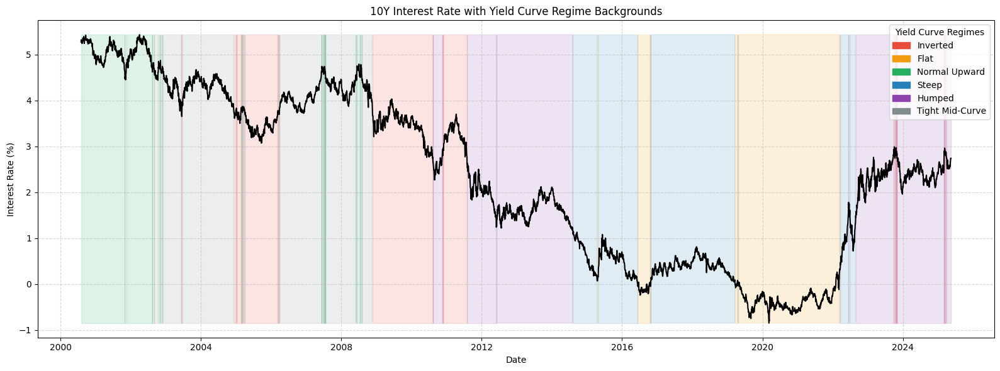

In [47]:
# ------------------  10 YEAR IR ------------------#

# Set up
fig, ax = plt.subplots(figsize=(16, 6))

# Plot the 10Y rate
ax.plot(clustering_df["Date"], clustering_df["M10"], label="10Y Interest Rate", color="black", linewidth=1.5)

# Define cluster color map manually (adjust if needed)
regime_colors = {
    "Inverted": "#e74c3c",         # Red
    "Flat": "#f39c12",             # Orange
    "Normal Upward": "#27ae60",    # Green
    "Steep": "#2980b9",            # Blue
    "Humped": "#8e44ad",           # Purple
    "Tight Mid-Curve": "#7f8c8d"   # Gray
}

# Plot background color for each regime
for label, color in regime_colors.items():
    mask = clustering_df["Cluster Label"] == label
    ax.fill_between(clustering_df["Date"], clustering_df["M10"].min(), clustering_df["M10"].max(),
                    where=mask, color=color, alpha=0.15, label=label)

# Final plot tweaks
ax.set_title("10Y Interest Rate with Yield Curve Regime Backgrounds")
ax.set_xlabel("Date")
ax.set_ylabel("Interest Rate (%)")
ax.grid(True, linestyle='--', alpha=0.5)

# Legend (just one label per color)
handles = [mpatches.Patch(color=color, label=label) for label, color in regime_colors.items()]
ax.legend(handles=handles, title="Yield Curve Regimes", loc="upper right")

plt.tight_layout()
plt.show()


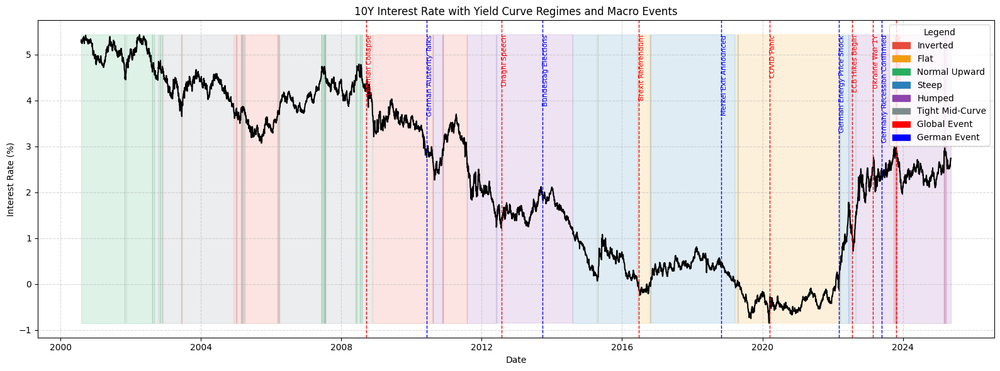

In [48]:
# ------------------  MACRO EVENTS ------------------#

# Define macro events
event_dict = {
    "global": {
        "Lehman Collapse": "2008-09-15",
        "Draghi Speech": "2012-07-26",
        "Brexit Referendum": "2016-06-24",
        "COVID Panic": "2020-03-16",
        "ECB Hikes Begin": "2022-07-21",
        "Ukraine War 1Y": "2023-02-24",
        "ECB Hike Pause": "2023-10-26"
    },
    "german": {
        "German Austerity Talks": "2010-06-07",
        "Bundestag Elections": "2013-09-22",
        "Merkel Exit Announced": "2018-10-29",
        "German Energy Price Shock": "2022-03-08",
        "Germany Recession Confirmed": "2023-05-25"
    }
}

# Define regime colors
regime_colors = {
    "Inverted": "#e74c3c",         # Red
    "Flat": "#f39c12",             # Orange
    "Normal Upward": "#27ae60",    # Green
    "Steep": "#2980b9",            # Blue
    "Humped": "#8e44ad",           # Purple
    "Tight Mid-Curve": "#7f8c8d"   # Gray
}

# Set up plot
fig, ax = plt.subplots(figsize=(16, 6))

# Plot 10Y interest rate
ax.plot(clustering_df["Date"], clustering_df["M10"], label="10Y Interest Rate", color="black", linewidth=1.5)

# Plot regime background colors
for label, color in regime_colors.items():
    mask = clustering_df["Cluster Label"] == label
    ax.fill_between(clustering_df["Date"], clustering_df["M10"].min(), clustering_df["M10"].max(),
                    where=mask, color=color, alpha=0.15)

# Overlay macro events (global - red, dutch - blue)
for label, date in event_dict["global"].items():
    date_obj = pd.to_datetime(date)
    ax.axvline(date_obj, color='red', linestyle='--', linewidth=1)
    ax.text(date_obj, clustering_df["M10"].max(), label, rotation=90,
            verticalalignment='top', fontsize=8, color='red')

for label, date in event_dict["german"].items():
    date_obj = pd.to_datetime(date)
    ax.axvline(date_obj, color='blue', linestyle='--', linewidth=1)
    ax.text(date_obj, clustering_df["M10"].max(), label, rotation=90,
            verticalalignment='top', fontsize=8, color='blue')

# Final formatting
ax.set_title("10Y Interest Rate with Yield Curve Regimes and Macro Events")
ax.set_xlabel("Date")
ax.set_ylabel("Interest Rate (%)")
ax.grid(True, linestyle='--', alpha=0.5)

# Add custom legend
regime_handles = [mpatches.Patch(color=color, label=label) for label, color in regime_colors.items()]
macro_handles = [
    mpatches.Patch(color="red", label="Global Event"),
    mpatches.Patch(color="blue", label="German Event")
]
ax.legend(handles=regime_handles + macro_handles, loc="upper right", title="Legend")

plt.tight_layout()
plt.show()


Note:

This visualization combines the 10-year interest rate trend with yield curve regime overlays, offering a rich view of how structural shifts in the term structure align with long-term rate movements. Each background color represents a different regime identified via clustering, such as Inverted, Flat, or Steep.

Periods with a red (Inverted) background correspond closely to times of economic distress or anticipated recession—e.g., around 2005–06, 2009, and again in 2023. Flat regimes appear during low-rate environments like 2020–2021, while Steep and Normal Upward regimes dominate during recovery phases.

Overlaying regimes in this way highlights that rate levels alone don’t capture the full interest rate environment—the yield curve shape provides additional, regime-level insight into underlying macroeconomic conditions and policy stances. This plot effectively bridges market signals and model-relevant segmentation for further stress testing and scenario analysis.

## **<font color='#474747'>2.3 - Dependence Structure**

### **<font color='#474747'>*2.3.1 - Correlations*</font>**

###### **2.3.1.a - Day Rolling Correlation**


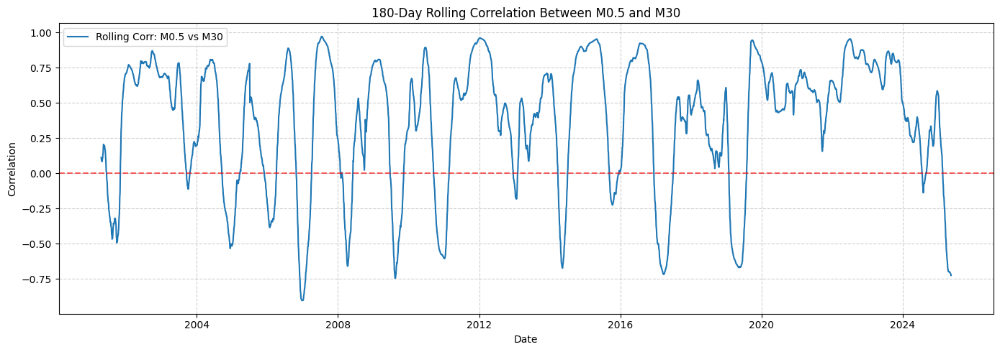

In [49]:
# ------------------  DAY ROLLING CORR ------------------#
# Pick two maturities to compare
short_col = "M0.5"
long_col = "M30"  # Change to M30.0 if preferred

# Drop rows where either is missing
pair_df = merged_df[["Date", short_col, long_col]].dropna().copy()

# Set rolling window size
window = 180  # roughly 6 months

# Calculate rolling correlation
rolling_corr = pair_df[short_col].rolling(window).corr(pair_df[long_col])

# Plot
plt.figure(figsize=(14, 5))
plt.plot(pair_df["Date"], rolling_corr, label=f"Rolling Corr: {short_col} vs {long_col}")
plt.axhline(0, color='red', linestyle='--', alpha=0.6)
plt.title(f"{window}-Day Rolling Correlation Between {short_col} and {long_col}")
plt.xlabel("Date")
plt.ylabel("Correlation")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.legend()
plt.show()

Note:

This rolling correlation analysis tracks the co-movement between short-term (0.5Y) and long-term (30Y) interest rates over a 180-day window. The correlation fluctuates over time, reflecting how synchronized these segments of the yield curve are in different market conditions.

Periods of high positive correlation suggest broad market shifts or monetary policy changes affecting the entire curve. In contrast, drops in correlation—sometimes even turning negative—indicate decoupling between short and long rates, often during yield curve distortions like flattening or inversion.

These dynamics highlight the instability of term structure relationships, reinforcing the need to monitor correlation risk when managing interest rate-sensitive portfolios or modeling curve-dependent instruments.


###### **2.3.1.b - Cross Correlations**

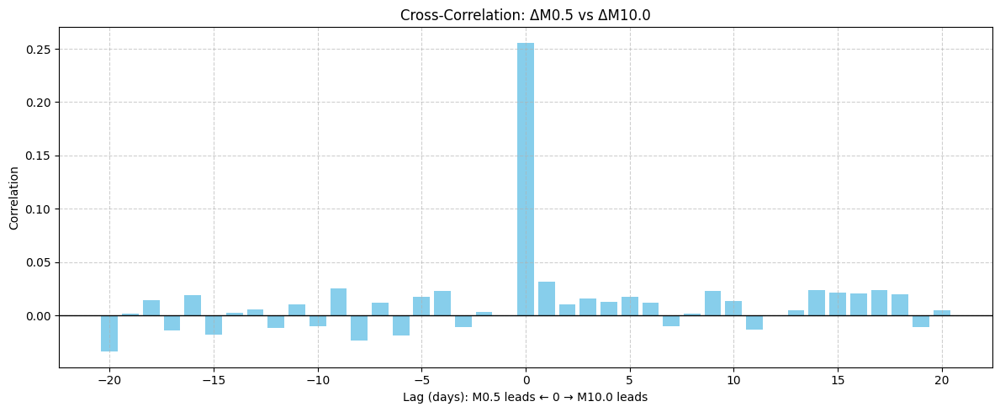

In [50]:
# --------------------------CROSS CORRELATION ----------------------------------#
# Prepare time-aligned and detrended data
lead_lag_df = merged_df[["Date", "M0.5", "M10"]].dropna().copy()
short_rates = lead_lag_df["M0.5"].diff().dropna()
long_rates = lead_lag_df["M10"].diff().dropna()

# Align lengths
min_len = min(len(short_rates), len(long_rates))
short_rates = short_rates[-min_len:]
long_rates = long_rates[-min_len:]

# Compute cross-correlation (lags from -20 to +20)
max_lag = 20
lags = np.arange(-max_lag, max_lag + 1)
cc_values = [short_rates.shift(-lag).corr(long_rates) for lag in lags]

# Plot
plt.figure(figsize=(12, 5))
plt.bar(lags, cc_values, width=0.8, color='skyblue')
plt.axhline(0, color='black', linewidth=1)
plt.title("Cross-Correlation: ΔM0.5 vs ΔM10.0")
plt.xlabel("Lag (days): M0.5 leads ← 0 → M10.0 leads")
plt.ylabel("Correlation")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

This cross-correlation analysis explores potential lead-lag relationships between short-term (0.5Y) and medium-term (10Y) interest rate movements. By analyzing the correlation of lagged differences, we assess whether shifts in one part of the curve tend to precede or follow changes in the other.

If the correlation peaks at positive lags, it implies that short-term rate movements lead changes in longer maturities—often a signal of policy-driven shifts propagating through the curve. Conversely, a peak at negative lags would suggest long rates react first, possibly due to anticipatory market behavior or macro expectations.

The results help uncover directional dynamics within the term structure and can inform the design of predictive models or hedging strategies sensitive to timing across maturities.


###### **2.3.1.c -  Pearson Correlation**


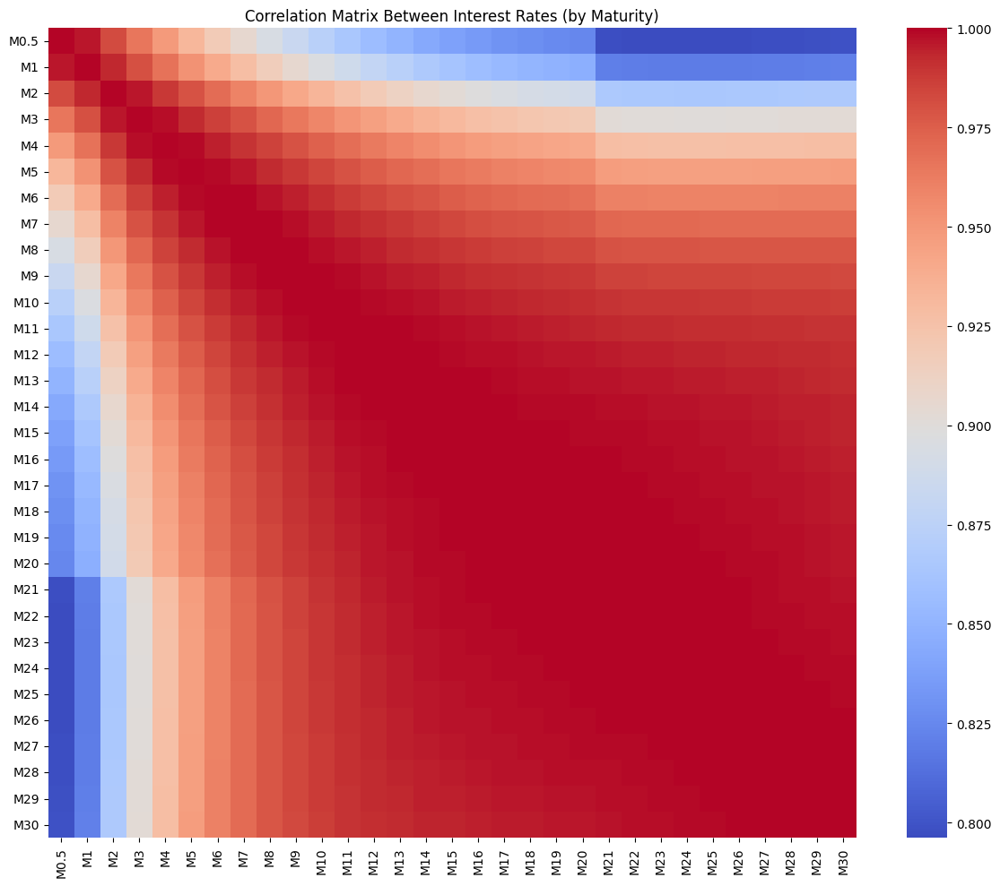

In [51]:
# --------------------------PEARSON CORRELATION ----------------------------------#
# Create merged wide format DataFrame
merged_df = pd.DataFrame()
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    temp = df[["Date", "Interest Rate"]].rename(columns={"Interest Rate": f"M{maturity}"})
    merged_df = temp if merged_df.empty else pd.merge(merged_df, temp, on="Date", how="outer")

# Drop date for correlation matrix
correlation_matrix = merged_df.drop(columns="Date").corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap="coolwarm", annot=False)
plt.title("Correlation Matrix Between Interest Rates (by Maturity)")
plt.tight_layout()
plt.show()


Note:

This section computes the Pearson correlation matrix between interest rates across different maturities. The results show strong linear relationships, especially between adjacent maturities, confirming the smooth structure of the yield curve. Correlations tend to weaken slightly between the shortest and longest maturities, indicating some segmentation in the term structure. These findings support the use of low-dimensional factor models (e.g., PCA) but also highlight residual basis risk when managing exposures across the curve.

Analyzing correlations across maturities by reducing the full curve (e.g., M0.5–M30) into a few independent components.

These principal components are orthogonal patterns that capture how rates across maturities move together.


###### **2.3.1.d -  Rank Correlation (Spearman)**

Captures nonlinear monotonic relationships. More robust to outliers than Pearson


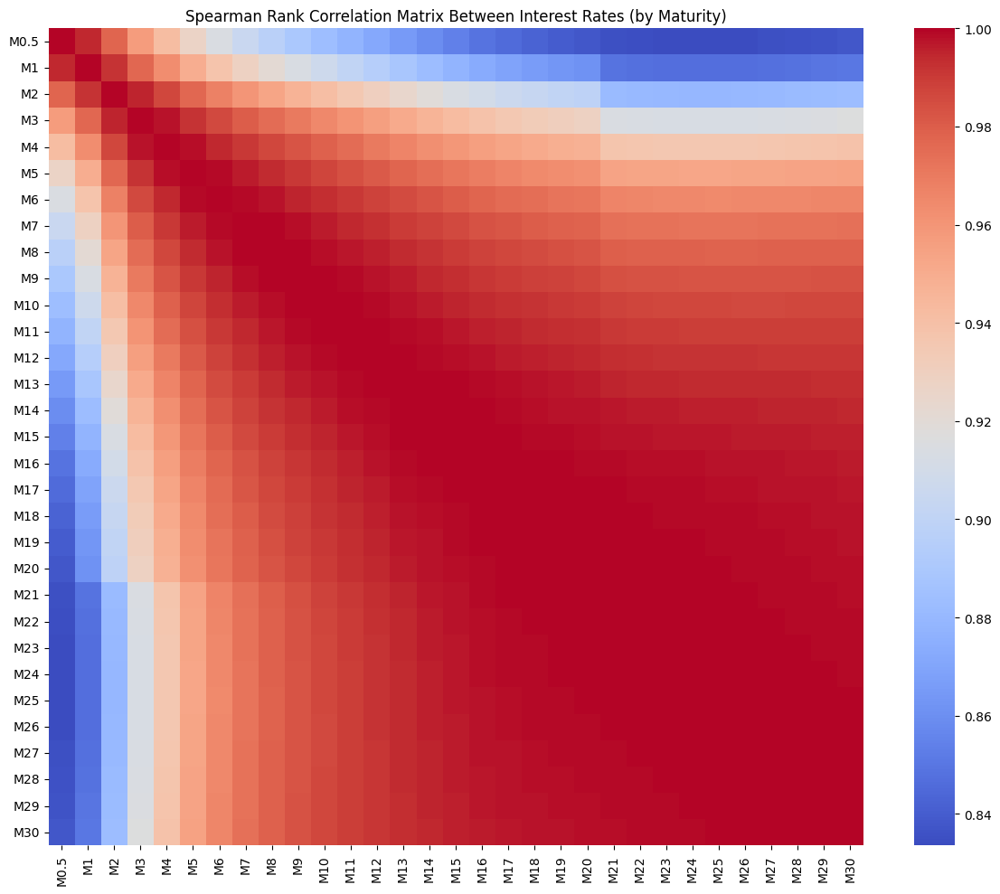

In [52]:
# --------------------------RANK CORRELATION ----------------------------------#

# Rank correlation matrix (Spearman)
rank_corr_matrix = merged_df.drop(columns="Date").corr(method="spearman")

# Plot Spearman correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(rank_corr_matrix, cmap="coolwarm", annot=False)
plt.title("Spearman Rank Correlation Matrix Between Interest Rates (by Maturity)")
plt.tight_layout()
plt.show()


Note:

The Spearman rank correlation heatmap shows very high monotonic dependence across most maturities, especially from medium to long terms (M5–M30). Short-term maturities (e.g., M0.5–M2) are slightly less correlated with longer maturities, suggesting they behave more independently in their relative movements. Overall, the curve behaves as a strongly co-moving system, even under nonlinear shifts.
<br><Br>
In simple terms:

This heatmap shows that interest rates across different maturities generally move in the same direction. Long-term rates are very closely linked to each other. Short-term rates (like 0.5Y or 1Y) move a bit differently, but still follow the overall trend.


### **<font color='#474747'>*2.3.2. - PCA*</font>**


###### **2.3.2.a -  PCA Scree Plot & Proportion of Variance Explained**


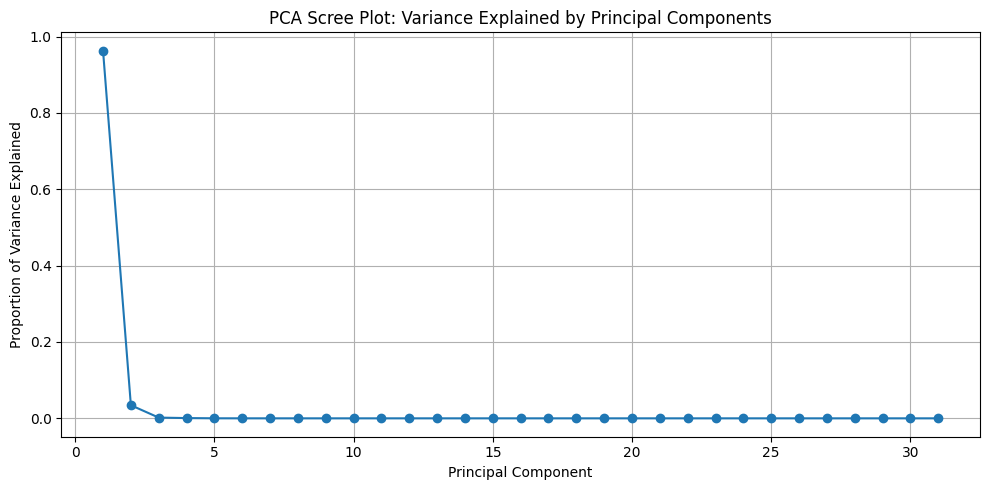

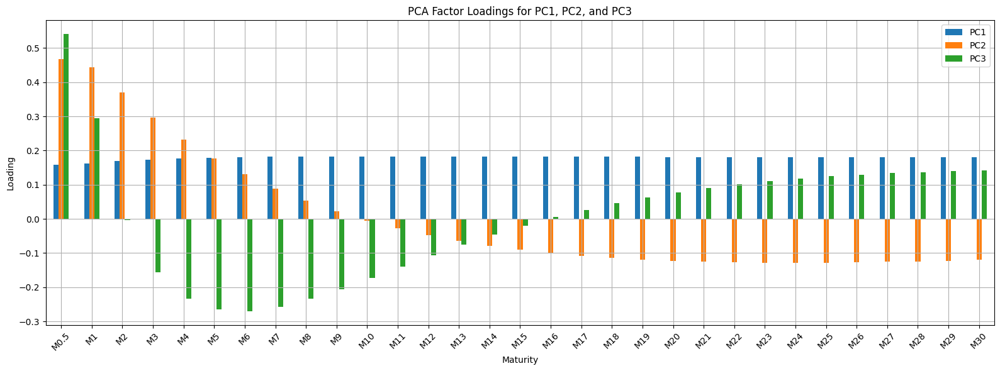


INTERPRETATION OF PRINCIPAL COMPONENTS (PCA):

- PC1 (Level): Captures parallel shifts of the yield curve. All maturities move in the same direction.
  A high PC1 score reflects an upward shift across all maturities; low PC1 reflects a downward shift.

- PC2 (Slope): Contrasts short-term and long-term interest rates. Reflects steepening or flattening of the curve.
  High PC2 means short rates are low and long rates are high (steep curve). Low PC2 means flattening or inversion.

- PC3 (Curvature): Detects changes in the mid-curve area. Short and long rates move together while medium rates move oppositely.
  This component explains curvature distortions such as humps or dips in the term structure.



In [55]:
# ------------------------ PCA on Yield Curve Data ------------------------ #
# Step 1: Create merged wide format DataFrame (Interest Rates by Maturity)
merged_df = pd.DataFrame()
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    temp = df[["Date", "Interest Rate"]].rename(columns={"Interest Rate": f"M{maturity}"})
    merged_df = temp if merged_df.empty else pd.merge(merged_df, temp, on="Date", how="outer")

# Drop rows with NaN and separate feature matrix
rates_only = merged_df.drop(columns="Date").dropna()

# Step 2: Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(rates_only)

# Step 3: Apply PCA
pca = PCA()
pca.fit(X_scaled)
explained_variance_ratio = pca.explained_variance_ratio_

# Step 4: Scree Plot (Variance Explained by Each Principal Component)
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title("PCA Scree Plot: Variance Explained by Principal Components")
plt.xlabel("Principal Component")
plt.ylabel("Proportion of Variance Explained")
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 5: Factor Loadings (First 3 PCs)
loading_matrix = pd.DataFrame(pca.components_[:3], columns=rates_only.columns, index=["PC1", "PC2", "PC3"]).T

# Plot Factor Loadings
loading_matrix.plot(kind='bar', figsize=(16, 6))
plt.title("PCA Factor Loadings for PC1, PC2, and PC3")
plt.xlabel("Maturity")
plt.ylabel("Loading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# ------------------------ Interpretation ------------------------ #
print("""
INTERPRETATION OF PRINCIPAL COMPONENTS (PCA):

- PC1 (Level): Captures parallel shifts of the yield curve. All maturities move in the same direction.
  A high PC1 score reflects an upward shift across all maturities; low PC1 reflects a downward shift.

- PC2 (Slope): Contrasts short-term and long-term interest rates. Reflects steepening or flattening of the curve.
  High PC2 means short rates are low and long rates are high (steep curve). Low PC2 means flattening or inversion.

- PC3 (Curvature): Detects changes in the mid-curve area. Short and long rates move together while medium rates move oppositely.
  This component explains curvature distortions such as humps or dips in the term structure.
""")



Note:

The PCA scree plot illustrates how the variance in interest rates across maturities is concentrated in a small number of components. The first principal component (PC1) explains the vast majority of the total variance—often over 90%—and reflects level shifts in the entire yield curve (i.e., parallel movements). The second component (PC2) captures slope changes, indicating steepening or flattening dynamics, while the third component (PC3) relates to curvature, identifying humps or dips in the mid-curve.

Together, the first two or three components typically account for nearly all variation, validating the use of low-dimensional term structure models in risk and scenario analysis. This dimensionality reduction simplifies modeling without significant loss of explanatory power.

<br><br>
This PCA loading plot shows that:
* PC1 (blue): All maturities load positively — the curve moves mostly through parallel shifts (level changes).
* PC2 (orange): Short and long maturities have opposite signs — it captures slope changes (steepening/flattening).
* PC3 (green): Mid-curve maturities load opposite to short and long ends — this reflects curvature effects.

In short: the term structure is driven by level, slope, and curvature, in that order.


###### **2.3.2.b -  PCA Bar Plot of Proportion of Variance Explained**


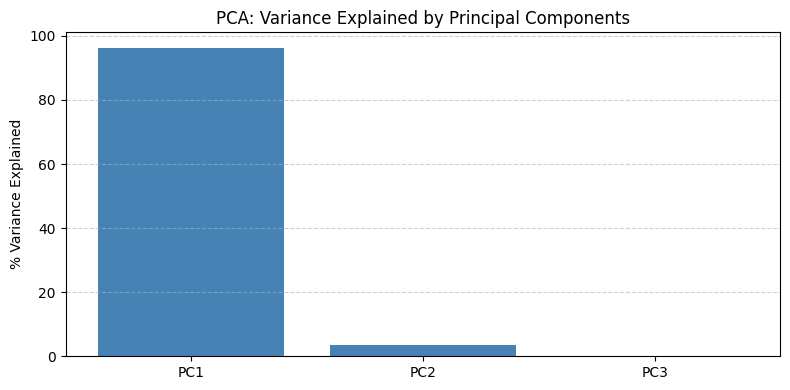


INTERPRETATION OF PRINCIPAL COMPONENTS (PCA):

- PC1 (Level): Captures parallel shifts of the yield curve. All maturities move in the same direction.
  A high PC1 score reflects an upward shift across all maturities; low PC1 reflects a downward shift.

- PC2 (Slope): Contrasts short-term and long-term interest rates. Reflects steepening or flattening of the curve.
  High PC2 means short rates are low and long rates are high (steep curve). Low PC2 means flattening or inversion.

- PC3 (Curvature): Detects changes in the mid-curve area. Short and long rates move together while medium rates move oppositely.
  This component explains curvature distortions such as humps or dips in the term structure.



In [56]:
# --------------------- 1. Prepare PCA-ready data ---------------------
# Drop rows with missing values
pca_df = merged_df.dropna().copy()

# Extract maturity columns
maturity_cols = [col for col in pca_df.columns if col != 'Date']
X = pca_df[maturity_cols].values

# --------------------- 2. Standardize the Data ---------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --------------------- 3. Run PCA ---------------------
pca = PCA(n_components=3)
principal_components = pca.fit_transform(X_scaled)

# --------------------- 4. Plot Explained Variance ---------------------
plt.figure(figsize=(8, 4))
explained = pca.explained_variance_ratio_ * 100
plt.bar(range(1, 4), explained, tick_label=["PC1", "PC2", "PC3"], color="steelblue")
plt.title("PCA: Variance Explained by Principal Components")
plt.ylabel("% Variance Explained")
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# --------------------- 5. Interpretation of Principal Components ---------------------
print("""
INTERPRETATION OF PRINCIPAL COMPONENTS (PCA):

- PC1 (Level): Captures parallel shifts of the yield curve. All maturities move in the same direction.
  A high PC1 score reflects an upward shift across all maturities; low PC1 reflects a downward shift.

- PC2 (Slope): Contrasts short-term and long-term interest rates. Reflects steepening or flattening of the curve.
  High PC2 means short rates are low and long rates are high (steep curve). Low PC2 means flattening or inversion.

- PC3 (Curvature): Detects changes in the mid-curve area. Short and long rates move together while medium rates move oppositely.
  This component explains curvature distortions such as humps or dips in the term structure.
""")


Note:

The PCA bar plot quantifies how much of the total variance in the term structure is captured by each principal component. As expected, the first component (PC1) dominates, explaining over 90% of the variance—this reflects parallel shifts in the yield curve (i.e., changes in overall interest rate level). The second component (PC2) contributes an additional 5–8%, representing slope changes such as steepening or flattening. The third component (PC3) accounts for a small but notable share, typically associated with curvature effects in the mid-maturities.

Together, these components confirm that a small number of factors drive most of the yield curve’s behavior, justifying the use of three-factor models in interest rate modeling and risk management.

Summary:

- PC1  explains >90% — it's the parallel shift in the curve (level).

- PC2 adds 5–8% — interpretable as steepening/flattening.

- PC3 is smaller — often curvature effects.


###### **2.3.2.c -  PCA Comonent Scores Over Time**


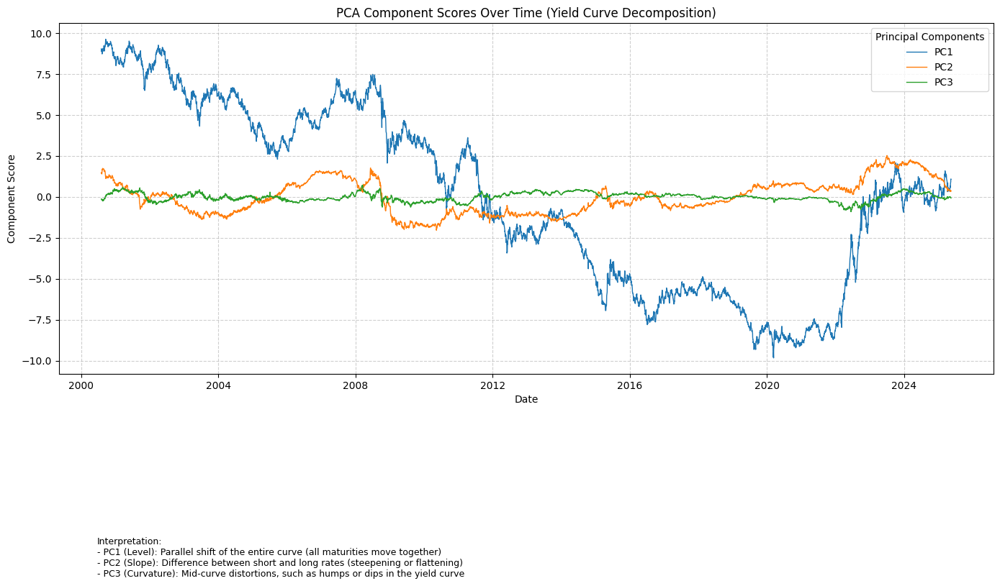

In [57]:
# --------------------- PCA Component Scores Over Time with Interpretation ---------------------
# Create DataFrame with PCA scores and dates
pca_scores_df = pd.DataFrame(principal_components, columns=["PC1", "PC2", "PC3"])
pca_scores_df["Date"] = pd.to_datetime(pca_df["Date"].values)
pca_scores_df = pca_scores_df.sort_values("Date")

# Plot all three principal components
plt.figure(figsize=(14, 7))

for pc in ["PC1", "PC2", "PC3"]:
    plt.plot(pca_scores_df["Date"], pca_scores_df[pc], label=pc, linewidth=1)

plt.title("PCA Component Scores Over Time (Yield Curve Decomposition)")
plt.xlabel("Date")
plt.ylabel("Component Score")
plt.legend(title="Principal Components")
plt.grid(True, linestyle='--', alpha=0.6)

# Add interpretation text below plot
plt.figtext(0.1, -0.15,
    "Interpretation:\n"
    "- PC1 (Level): Parallel shift of the entire curve (all maturities move together)\n"
    "- PC2 (Slope): Difference between short and long rates (steepening or flattening)\n"
    "- PC3 (Curvature): Mid-curve distortions, such as humps or dips in the yield curve",
    wrap=True, horizontalalignment='left', fontsize=9)

plt.tight_layout()
plt.subplots_adjust(bottom=0.25)  # Make space for interpretation
plt.show()

Note:

This plot tracks the time series of the first three principal components, providing insight into how the level, slope, and curvature of the yield curve evolve over time.

* PC1 (Level) shows large swings during major crises (e.g., 2008, 2020, 2022), indicating synchronized shifts across all maturities due to central bank action or market stress.

* PC2 (Slope) captures steepening and flattening phases. Sharp movements in PC2 often coincide with monetary policy regime changes—e.g., aggressive tightening in 2022 caused a strong steepening-to-flattening shift.

* PC3 (Curvature) fluctuates less dramatically but still reflects changes in mid-curve dynamics, especially during transitional periods between policy regimes.

Overall, these component scores give a compact and interpretable decomposition of how yield curve shapes change through time, aligning with economic narratives and supporting regime-aware modeling.


###### **2.3.2.d -  PCA Loadings by Maturity**


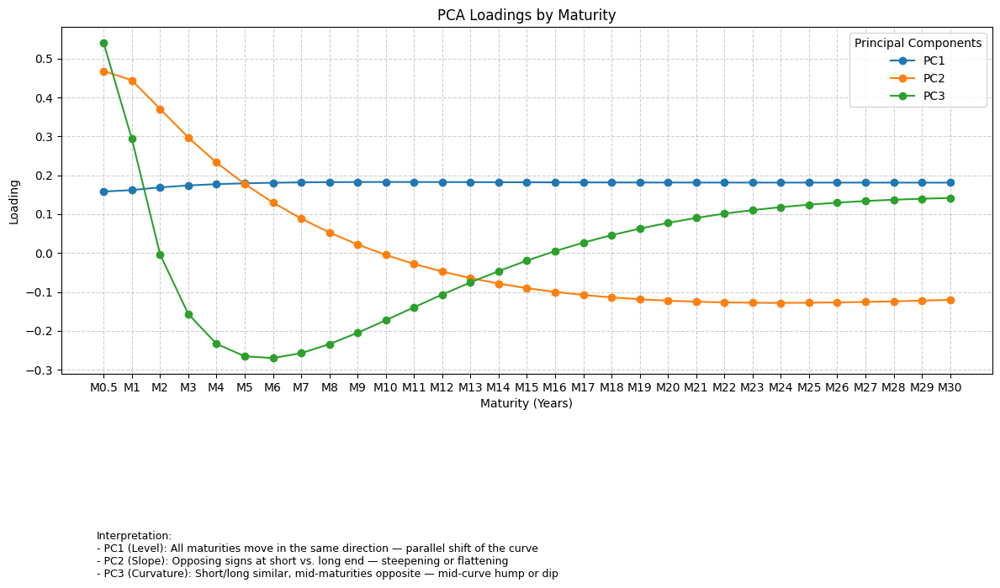

In [58]:
# --------------------- PCA Loadings by Maturity ---------------------
# Loadings: influence of each maturity on each principal component
loadings = pd.DataFrame(pca.components_.T, index=maturity_cols, columns=["PC1", "PC2", "PC3"])

# Plot loadings
plt.figure(figsize=(12, 6))
for pc in ["PC1", "PC2", "PC3"]:
    plt.plot(loadings.index, loadings[pc], marker='o', label=pc)

plt.title("PCA Loadings by Maturity")
plt.xlabel("Maturity (Years)")
plt.ylabel("Loading")
plt.legend(title="Principal Components")
plt.grid(True, linestyle='--', alpha=0.6)

# Add interpretation note
plt.figtext(0.1, -0.15,
    "Interpretation:\n"
    "- PC1 (Level): All maturities move in the same direction — parallel shift of the curve\n"
    "- PC2 (Slope): Opposing signs at short vs. long end — steepening or flattening\n"
    "- PC3 (Curvature): Short/long similar, mid-maturities opposite — mid-curve hump or dip",
    wrap=True, horizontalalignment='left', fontsize=9)

plt.tight_layout()
plt.subplots_adjust(bottom=0.25)
plt.show()


Note:

This plot shows the PCA loadings for each maturity, illustrating how different parts of the yield curve contribute to each principal component.
* PC1 has loadings of the same sign across all maturities, confirming it captures parallel shifts in the yield curve—i.e., movements where all rates rise or fall together.
* PC2 exhibits a sign change between short and long maturities, indicating it reflects slope dynamics, such as steepening or flattening of the curve.
* PC3 shows multiple sign changes (typically three), highlighting its role in capturing curvature effects—i.e., humps or dips in the mid-maturities.

These loading patterns validate the standard interpretation of level, slope, and curvature components, and help link the statistical decomposition back to economic and financial meaning.

Summary:
* PC1 loadings all same sign → parallel shift
* PC2 loadings change sign → slope (short vs. long)
* PC3 has 3 sign changes → curvature (hump/dip)


### **<font color='#474747'>*2.3.3 - Copulas*</font>**- to complete

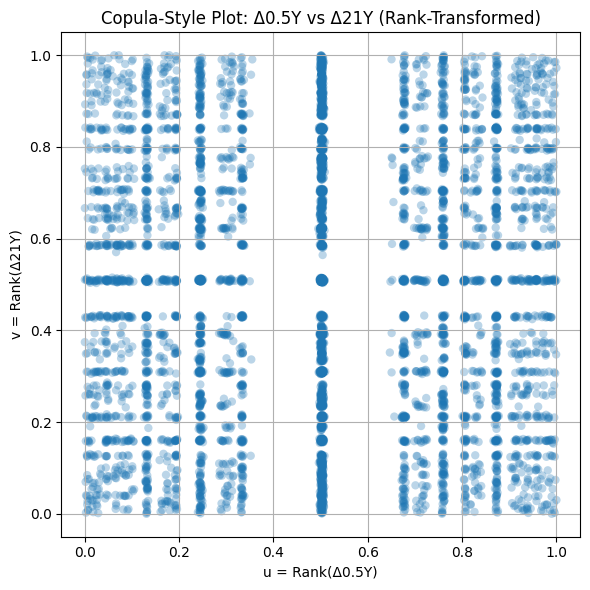

In [62]:
#----------------------DELTA----------------#
# Ensure 'Delta Interest Rate' exists in all dataframes
for i in range(len(dataframes)):
    df = dataframes[i]
    if "Delta Interest Rate" not in df.columns:
        df = df.copy()
        df["Delta Interest Rate"] = df["Interest Rate"].diff()  # daily changes
        df = df.dropna(subset=["Delta Interest Rate"])  # drop NaNs after diff
        dataframes[i] = df


# --------------------------BSIC COPULAS ----------------------------------#
# Set target maturities
maturity_x = 0.5
maturity_y = 21.0

# Extract corresponding delta series
delta_x = None
delta_y = None

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    if maturity == maturity_x:
        delta_x = df["Delta Interest Rate"].dropna().reset_index(drop=True)
    elif maturity == maturity_y:
        delta_y = df["Delta Interest Rate"].dropna().reset_index(drop=True)

# Ensure both series are of equal length
min_len = min(len(delta_x), len(delta_y))
delta_x = delta_x.iloc[:min_len]
delta_y = delta_y.iloc[:min_len]

# Rank-transform to pseudo-uniform margins
u = rankdata(delta_x) / (len(delta_x) + 1)
v = rankdata(delta_y) / (len(delta_y) + 1)

# Scatter plot to visualize dependence structure
plt.figure(figsize=(6, 6))
plt.scatter(u, v, alpha=0.3, edgecolors='none')
plt.title("Copula-Style Plot: Δ0.5Y vs Δ21Y (Rank-Transformed)")
plt.xlabel("u = Rank(Δ0.5Y)")
plt.ylabel("v = Rank(Δ21Y)")
plt.grid(True)
plt.tight_layout()
plt.show()


Note:

This copula-style plot shows the dependence between short-term (0.5Y) and long-term (21Y) interest rate changes. The wide scatter suggests weak tail dependence — extreme changes in one maturity do not strongly align with extremes in the other. This indicates more independent behavior in the tails and possibly asymmetric risk responses across the curve.
<br><Br>
Implications for Modeling:

This copula-style plot suggests that short-term (0.5Y) and long-term (21Y) rate changes have weak tail dependence, meaning extreme movements in one are not strongly mirrored by the other.
Implication for modelling: simple correlation-based models may underestimate joint tail risk. For internal model use under Solvency II, this supports considering copula-based dependency structures or factor models with non-Gaussian innovations to better capture asymmetric and nonlinear risk across maturities.

## **<font color='#474747'>2.4 - Extreme Movements & Volatility Structure**

In [63]:
# --------------------------IMPORTS ----------------------------------#
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from scipy.stats import norm, probplot

# Create visualizations for each requirement
import matplotlib.dates as mdates


### **<font color='#474747'>*2.4.1 - Outlier Analysis (Z-score based) – Rolling Window Approach*</font>**

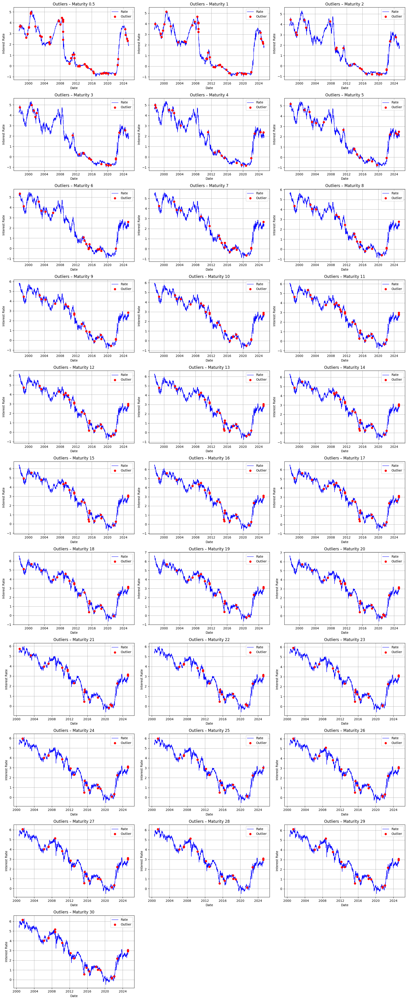

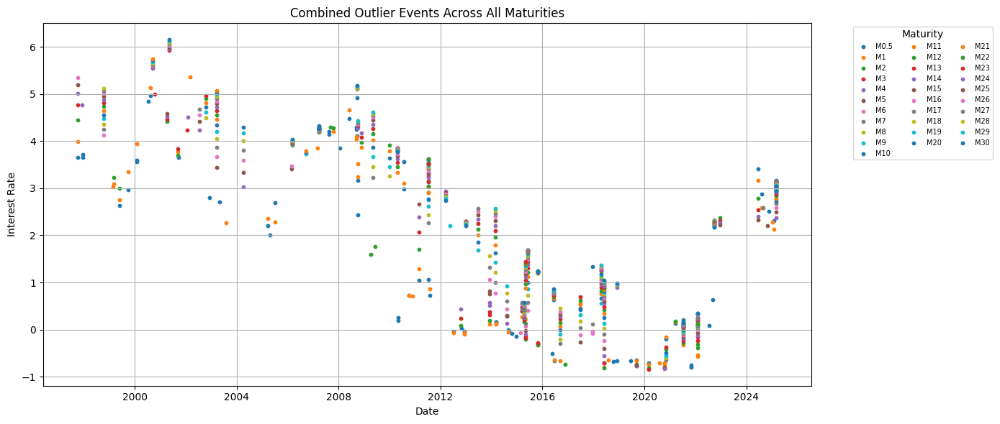

,Outlier Count,Max Outlier,Min Outlier
Maturity,,,
0.5,56,4.97,-0.79
1.0,45,5.13,-0.80
2.0,22,4.45,-0.82
3.0,20,4.99,-0.84
4.0,19,5.01,-0.83
5.0,20,5.19,-0.75
6.0,18,5.34,-0.24
7.0,19,4.68,-0.65
8.0,19,4.49,-0.60


In [64]:
# -------------------- Outlier Detection with Subplots (3 per row) --------------------
window_size = 20
z_threshold = 3
outlier_summary = []

# Layout config
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))
axes = axes.flatten()

for i, df in enumerate(dataframes):
    df = df.copy().sort_values("Date")
    maturity = df["Maturity"].iloc[0]

    df["RollingMean"] = df["Interest Rate"].rolling(window=window_size, min_periods=10).mean()
    df["RollingStd"] = df["Interest Rate"].rolling(window=window_size, min_periods=10).std()
    df["ZScore"] = (df["Interest Rate"] - df["RollingMean"]) / df["RollingStd"]
    df["Outlier"] = df["ZScore"].abs() > z_threshold
    outliers = df[df["Outlier"]]

    ax = axes[i]
    ax.plot(df["Date"], df["Interest Rate"], label="Rate", color="blue", linewidth=1)
    ax.scatter(outliers["Date"], outliers["Interest Rate"], color="red", label="Outlier", zorder=5)
    ax.set_title(f'Outliers – Maturity {maturity}')
    ax.set_xlabel("Date")
    ax.set_ylabel("Interest Rate")
    ax.grid(True)
    ax.legend()

    outlier_summary.append({
        "Maturity": maturity,
        "Outlier Count": len(outliers),
        "Max Outlier": outliers["Interest Rate"].max(),
        "Min Outlier": outliers["Interest Rate"].min()
    })

# Remove unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# -------------------- Combined Multivariate Outlier Plot --------------------

plt.figure(figsize=(14, 6))

for df in dataframes:
    df = df.copy().sort_values("Date")
    maturity = df["Maturity"].iloc[0]

    df["RollingMean"] = df["Interest Rate"].rolling(window=window_size, min_periods=10).mean()
    df["RollingStd"] = df["Interest Rate"].rolling(window=window_size, min_periods=10).std()
    df["ZScore"] = (df["Interest Rate"] - df["RollingMean"]) / df["RollingStd"]
    df["Outlier"] = df["ZScore"].abs() > z_threshold

    outliers = df[df["Outlier"]]
    plt.scatter(outliers["Date"], outliers["Interest Rate"], label=f'M{maturity}', s=10)

plt.title("Combined Outlier Events Across All Maturities")
plt.xlabel("Date")
plt.ylabel("Interest Rate")
plt.legend(title="Maturity", fontsize=7, ncol=3, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

# -------------------- Summary Table --------------------

outlier_df = pd.DataFrame(outlier_summary).set_index("Maturity").sort_index()
display(outlier_df)


Note:

To identify unusually large interest rate movements in a way that accounts for local volatility, we applied a 20-day rolling Z-score method across all maturities. Any daily rate that deviated more than ±3 standard deviations from its rolling mean was marked as an outlier.

The plots reveal clear clusters of outliers during major market stress periods—most notably the 2008 Global Financial Crisis, the 2020 COVID-19 shock, and the 2022–2023 interest rate tightening cycle. These episodes are particularly pronounced at shorter maturities, reflecting their heightened sensitivity to policy and liquidity shocks.

The accompanying summary table quantifies the frequency of outliers per maturity, helping to pinpoint where abnormal rate behavior is most concentrated. This information is useful for model calibration, stress testing, and determining tail-risk sensitivity across different segments of the yield curve.

### **<font color='#474747'>*2.4.2 - Daily Changes Analysis*</font>**

Add Column Delta Interest Rate (per file)

In [65]:
# --------------------------DELAT I.R ----------------------------------#
# Create a new column called "Delta Interest Rate" for each dataframe in the list
# This column is the difference in interest rate from the previous row, with the first value set to 0

for df in dataframes:
    df["Delta Interest Rate"] = df["Interest Rate"].diff().fillna(0)


Plot the Delta Interest Rates Over Time (per Maturity)

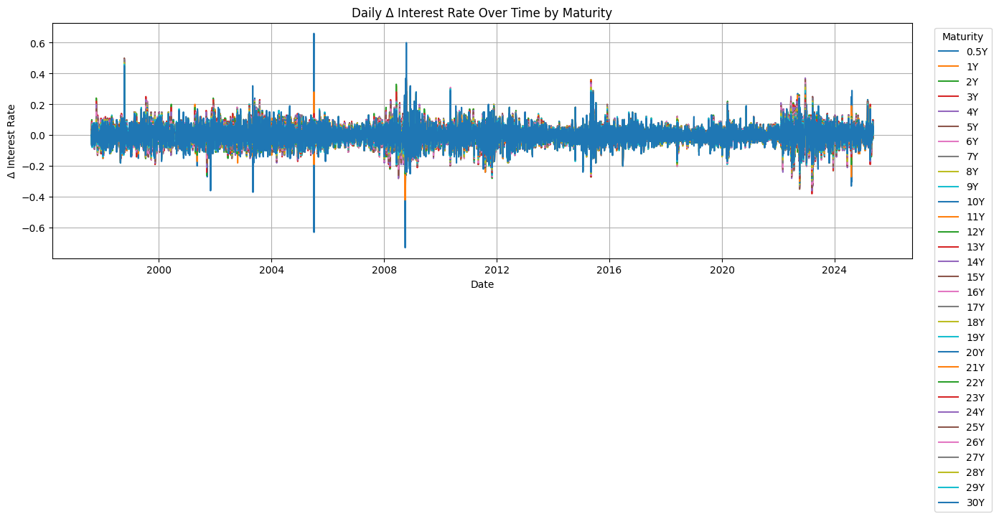

In [66]:
# -------------------------- PLOT DELTA I.R OVER TIME ----------------------------------#
# Create a time series plot of Delta Interest Rate over time per maturity
fig, ax = plt.subplots(figsize=(14, 6))

for df in dataframes:
    # Extract maturity (ensure consistent format)
    if "Maturity" in df.columns:
        maturity = df["Maturity"].iloc[0]
    else:
        file_name = df["FileReferenceName"].iloc[0]
        match = re.search(r"R(\d+)X", file_name)
        maturity = float(match.group(1)) / 10 if match else 0.0

    ax.plot(df["Date"], df["Delta Interest Rate"], label=f"{maturity}Y")

ax.set_title("Daily Δ Interest Rate Over Time by Maturity")
ax.set_xlabel("Date")
ax.set_ylabel("Δ Interest Rate")
ax.legend(title="Maturity", bbox_to_anchor=(1.02, 1), loc="upper left")
ax.grid(True)
plt.tight_layout()
plt.show()

Note:

This plot displays the daily changes in interest rates (Δ rates) over time for each maturity. These first differences highlight the volatility and shock sensitivity of different segments of the yield curve.

Short-term maturities (e.g., 0.5Y to 2Y) show more frequent and pronounced fluctuations, reflecting their direct response to central bank announcements and liquidity shocks. Long-term maturities (e.g., 10Y to 30Y), while generally smoother, still register large spikes during periods of macroeconomic stress—such as in 2008, 2020, and 2022–2023.

Plotting Δ rates helps detect market turbulence, supports the calibration of mean-reverting or stochastic volatility models, and provides a more granular view of rate behavior beyond level changes.

Heatmap of Delta Interest Rates per Maturity
- Count
- Percenatge

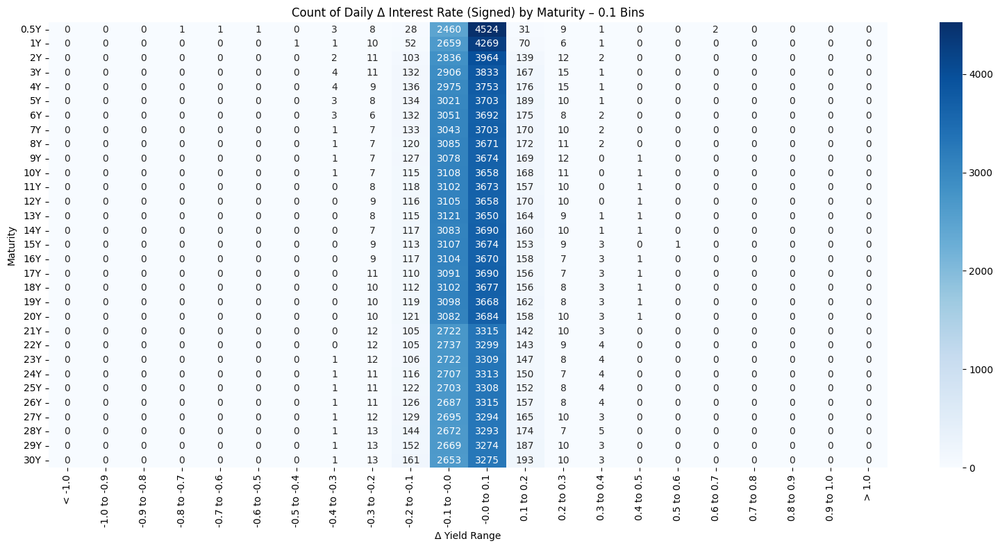

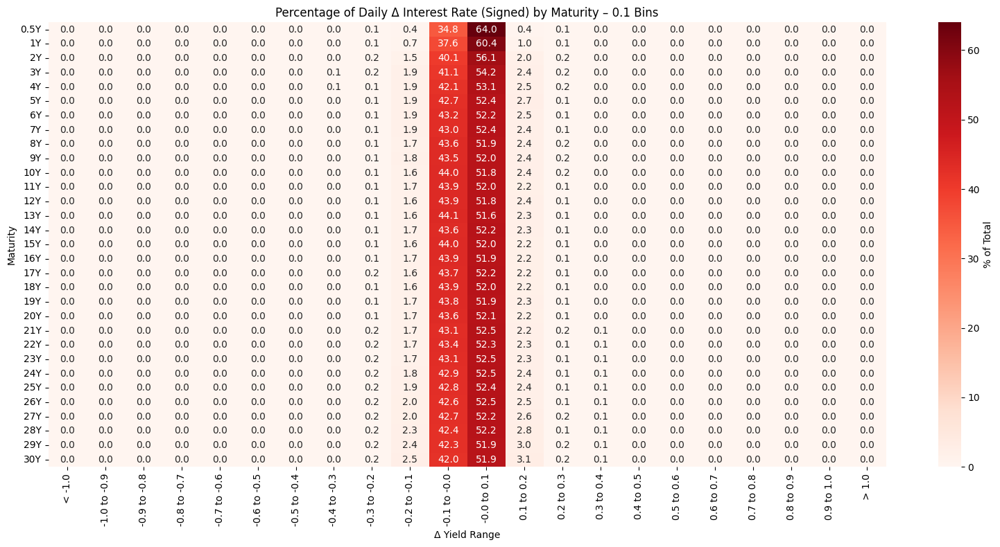

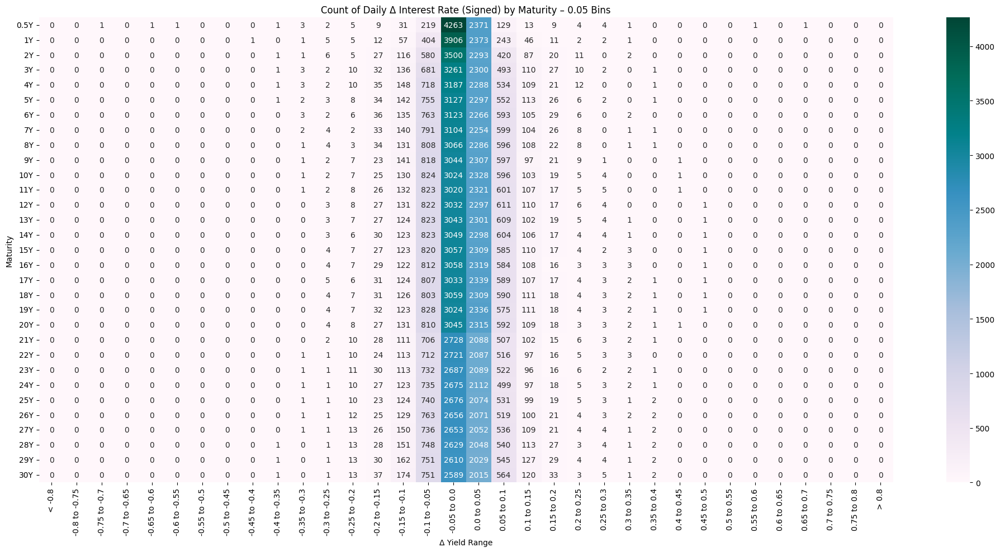

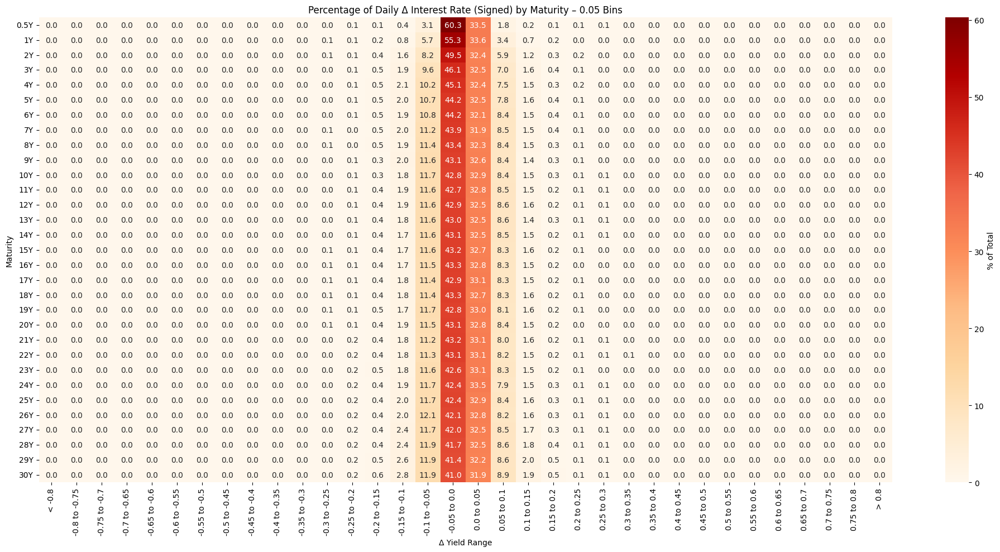

In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -------------------------- HEATMAP OF DELTA I.R'S OVER TIME (0.1 BINS) --------------------------

# Binning setup (0.1 intervals from -1.0 to 1.0)
bins_01 = np.arange(-1.0, 1.1, 0.1)
bin_labels_01 = [f"{round(bins_01[i], 1)} to {round(bins_01[i+1], 1)}" for i in range(len(bins_01) - 1)]
bin_labels_01 = ["< -1.0"] + bin_labels_01 + ["> 1.0"]
bin_edges_01 = [-np.inf] + bins_01.tolist() + [np.inf]

count_matrix_01 = pd.DataFrame(columns=["Maturity"] + bin_labels_01 + ["Total Count"])
pct_matrix_01 = pd.DataFrame(columns=["Maturity"] + bin_labels_01 + ["Sum %"])

# Fill matrices for 0.1 bins
for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else 0
    deltas = df["Delta Interest Rate"]

    counts = pd.cut(deltas, bins=bin_edges_01, labels=bin_labels_01).value_counts().reindex(bin_labels_01, fill_value=0)
    total_count = counts.sum()
    percentages = (counts / total_count * 100).round(2)
    sum_pct = percentages.sum()

    count_matrix_01.loc[len(count_matrix_01)] = [f"{maturity}Y"] + counts.tolist() + [total_count]
    pct_matrix_01.loc[len(pct_matrix_01)] = [f"{maturity}Y"] + percentages.tolist() + [sum_pct]

count_matrix_01.set_index("Maturity", inplace=True)
pct_matrix_01.set_index("Maturity", inplace=True)

# Heatmaps for 0.1 bin interval
plt.figure(figsize=(16, 8))
sns.heatmap(count_matrix_01.iloc[:, :-1].astype(int), annot=True, fmt="d", cmap="Blues")
plt.title("Count of Daily Δ Interest Rate (Signed) by Maturity – 0.1 Bins")
plt.xlabel("Δ Yield Range")
plt.ylabel("Maturity")
plt.tight_layout()
plt.show()

plt.figure(figsize=(16, 8))
sns.heatmap(pct_matrix_01.iloc[:, :-1].astype(float), annot=True, fmt=".1f", cmap="Reds", cbar_kws={"label": "% of Total"})
plt.title("Percentage of Daily Δ Interest Rate (Signed) by Maturity – 0.1 Bins")
plt.xlabel("Δ Yield Range")
plt.ylabel("Maturity")
plt.tight_layout()
plt.show()

# -------------------------- HEATMAP OF DELTA I.R'S OVER TIME (0.05 BINS) --------------------------

# Binning setup (0.05 intervals from -0.8 to 0.8)
bins_005 = np.arange(-0.8, 0.85, 0.05)
bin_labels_005 = [f"{round(bins_005[i], 2)} to {round(bins_005[i+1], 2)}" for i in range(len(bins_005) - 1)]
bin_labels_005 = ["< -0.8"] + bin_labels_005 + ["> 0.8"]
bin_edges_005 = [-np.inf] + bins_005.tolist() + [np.inf]

count_matrix_005 = pd.DataFrame(columns=["Maturity"] + bin_labels_005 + ["Total Count"])
pct_matrix_005 = pd.DataFrame(columns=["Maturity"] + bin_labels_005 + ["Sum %"])

# Fill matrices for 0.05 bins
for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else 0
    deltas = df["Delta Interest Rate"]

    counts = pd.cut(deltas, bins=bin_edges_005, labels=bin_labels_005).value_counts().reindex(bin_labels_005, fill_value=0)
    total_count = counts.sum()
    percentages = (counts / total_count * 100).round(2)
    sum_pct = percentages.sum()

    count_matrix_005.loc[len(count_matrix_005)] = [f"{maturity}Y"] + counts.tolist() + [total_count]
    pct_matrix_005.loc[len(pct_matrix_005)] = [f"{maturity}Y"] + percentages.tolist() + [sum_pct]

count_matrix_005.set_index("Maturity", inplace=True)
pct_matrix_005.set_index("Maturity", inplace=True)

# Heatmaps for 0.05 bin interval
plt.figure(figsize=(20, 10))
sns.heatmap(count_matrix_005.iloc[:, :-1].astype(int), annot=True, fmt="d", cmap="PuBuGn")
plt.title("Count of Daily Δ Interest Rate (Signed) by Maturity – 0.05 Bins")
plt.xlabel("Δ Yield Range")
plt.ylabel("Maturity")
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 10))
sns.heatmap(pct_matrix_005.iloc[:, :-1].astype(float), annot=True, fmt=".1f", cmap="OrRd", cbar_kws={"label": "% of Total"})
plt.title("Percentage of Daily Δ Interest Rate (Signed) by Maturity – 0.05 Bins")
plt.xlabel("Δ Yield Range")
plt.ylabel("Maturity")
plt.tight_layout()
plt.show()


Note:

This section visualizes the distribution of daily interest rate changes (Δ rates) using heatmaps that categorize movements into fine-grained bins. Two binning approaches were used: 0.1 and 0.05 step sizes, to explore both broader and more granular behavior across maturities.

The count heatmaps show that the majority of rate changes cluster around small values (e.g., between -0.1% and 0.1%), consistent with the typically gradual evolution of interest rates in stable periods. However, spikes in counts at the extremes indicate that sharp rate changes do occur, especially during turbulent periods.

The percentage heatmaps reveal how these distributions vary by maturity. Shorter maturities (e.g., 0.5Y–2Y) tend to have wider spread distributions, with a higher frequency of larger absolute changes. This reflects their sensitivity to policy announcements and market volatility. In contrast, longer maturities exhibit more concentrated distributions, centered tightly around zero.

Together, these visuals help assess tail behavior and volatility profiles across the yield curve. They are especially useful for:

- Validating jump modeling assumptions

- Stress testing frequency of large movements

- And guiding maturity-specific risk calibration in interest rate models.

Analysis per Cluster/ Increment
In order to see:
* Where volatility tends to cluster.
* Whether extreme movements favor certain maturities.

<ipython-input-68-bb1e4c00749b>:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=maturities, y=pcts, ax=ax, palette="crest")
<ipython-input-68-bb1e4c00749b>:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=maturities, y=pcts, ax=ax, palette="crest")
<ipython-input-68-bb1e4c00749b>:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=maturities, y=pcts, ax=ax, palette="crest")
<ipython-input-68-bb1e4c00749b>:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variabl

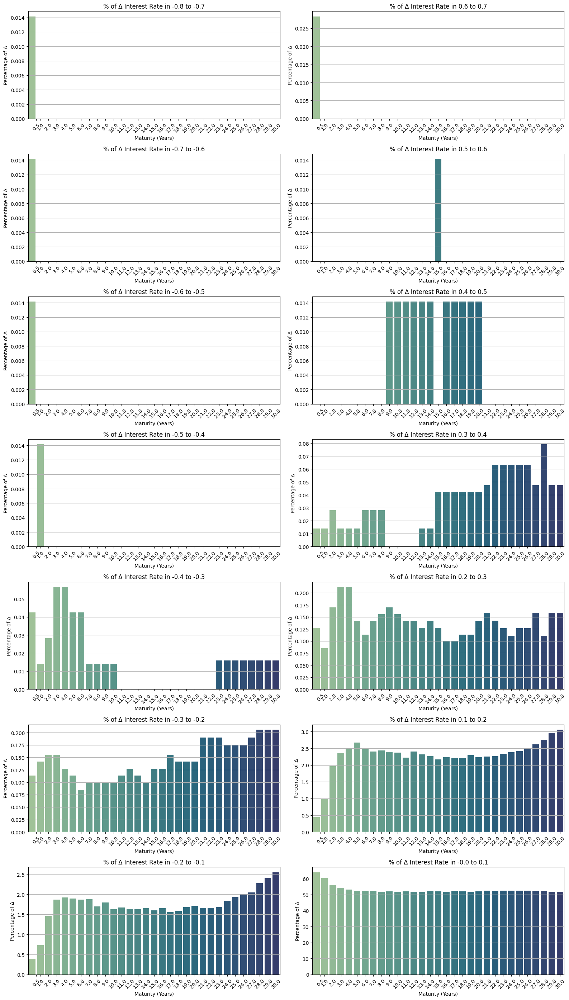

In [68]:
# -------------------------- PER INCREMENT----------------------------------#

# Define signed bin edges
bin_edges = np.arange(-1.0, 1.1, 0.1)
bin_labels = [f"{round(bin_edges[i], 1)} to {round(bin_edges[i+1], 1)}" for i in range(len(bin_edges) - 1)]

# Step 1: Get total delta count per maturity
maturity_totals = {}
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    maturity_totals[maturity] = maturity_totals.get(maturity, 0) + df["Delta Interest Rate"].count()

# Step 2: Count number of deltas per bin per maturity
cluster_data_pct = {label: {} for label in bin_labels}
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    binned = pd.cut(df["Delta Interest Rate"], bins=bin_edges, labels=bin_labels, include_lowest=True)
    bin_counts = binned.value_counts().reindex(bin_labels, fill_value=0)
    for label in bin_labels:
        count = bin_counts[label]
        pct = (count / maturity_totals[maturity]) * 100 if maturity_totals[maturity] > 0 else 0
        cluster_data_pct[label][maturity] = cluster_data_pct[label].get(maturity, 0) + pct

# Step 3: Filter valid bins
valid_bins = [label for label in bin_labels if sum(cluster_data_pct[label].values()) > 0]

# Step 4: Group into symmetric pairs
num_valid = len(valid_bins)
paired_bins = []
for i in range(num_valid // 2):
    paired_bins.append((valid_bins[i], valid_bins[-(i + 1)]))

# Step 5: Plot
if paired_bins:
    num_pairs = len(paired_bins)
    fig, axes = plt.subplots(num_pairs, 2, figsize=(16, 4 * num_pairs), sharex=False)
    if num_pairs == 1:
        axes = np.array([axes])  # Ensure iterable if only one row

    for i, (neg_label, pos_label) in enumerate(paired_bins):
        for j, label in enumerate([neg_label, pos_label]):
            maturity_pcts = cluster_data_pct[label]
            maturities = sorted(maturity_pcts.keys())
            pcts = [maturity_pcts[m] for m in maturities]

            ax = axes[i][j]
            sns.barplot(x=maturities, y=pcts, ax=ax, palette="crest")
            ax.set_title(f"% of Δ Interest Rate in {label}")
            ax.set_xlabel("Maturity (Years)")
            ax.set_ylabel("Percentage of Δ")
            ax.set_xticks(maturities)
            ax.set_xticklabels([f"{m:.1f}" for m in maturities], rotation=45)
            ax.grid(True, axis='y')

    plt.tight_layout()
    plt.show()
else:
    print("No valid delta bins found with data to compare.")


Note:

This analysis breaks down daily interest rate changes by increment bin across maturities to examine two key aspects: (1) volatility clustering, and (2) whether extreme rate movements are concentrated in certain parts of the curve.

The results reveal that larger absolute changes (e.g., > ±0.5%) are more common in short-term maturities, especially under volatile conditions. These segments react more sharply to policy shifts, liquidity shocks, and sudden repricing. In contrast, longer maturities exhibit fewer extreme movements, showing more resilience but also reflecting lower day-to-day sensitivity.

The bin-based visual breakdown confirms that volatility is not uniformly distributed across maturities, but instead clusters around short-tenor instruments, particularly during crisis regimes. This reinforces the importance of maturity-specific volatility modeling, especially when calibrating stress scenarios, jump processes, or regime-switching models in interest rate risk frameworks.

Analysis per Absolute Increment of Delta Interest Rates

In [69]:
# -------------------------- EXTREME ABSOLUTE INCREMENT ANALYSIS --------------------------
# Define thresholds for extreme absolute changes
thresholds = [0.1, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5] # Example thresholds

# Initialize DataFrame to store counts of extreme events
extreme_data = []

for df in dataframes:
    maturity = df["Maturity"].iloc[0] if "Maturity" in df.columns else None
    # Calculate absolute difference if "Delta Interest Rate" exists, otherwise calculate it
    if "Delta Interest Rate" not in df.columns:
        # Ensure data is sorted by date before calculating diff
        df = df.sort_values(by="Date").copy()
        df["Delta Interest Rate"] = df["Interest Rate"].diff()

    # Ensure absolute delta column exists
    df["Abs_Delta_Interest_Rate"] = df["Delta Interest Rate"].abs()

    row_data = {"Maturity": maturity}
    for threshold in thresholds:
        # Count occurrences where absolute delta is greater than the threshold
        count = (df["Abs_Delta_Interest_Rate"] > threshold).sum()
        row_data[f">{threshold}"] = count

    extreme_data.append(row_data)

# Create the extreme_matrix DataFrame
extreme_matrix = pd.DataFrame(extreme_data)

# Sort by maturity
extreme_matrix["Maturity"] = extreme_matrix["Maturity"].astype(float)
extreme_matrix.sort_values("Maturity", inplace=True)

# Display the created matrix (optional)
print("Extreme Absolute Increment Counts by Maturity:")
display(extreme_matrix)

Extreme Absolute Increment Counts by Maturity:


,Maturity,>0.1,>0.25,>0.5,>0.75,>1.0,>1.25,>1.5
0,0.5,87,16,5,0,0,0,0
1,1.0,148,9,0,0,0,0,0
2,2.0,285,8,0,0,0,0,0
3,3.0,344,9,0,0,0,0,0
4,4.0,356,7,0,0,0,0,0
5,5.0,355,9,0,0,0,0,0
6,6.0,341,7,0,0,0,0,0
7,7.0,335,6,0,0,0,0,0
8,8.0,326,5,0,0,0,0,0
9,9.0,324,5,0,0,0,0,0


Note:

This table summarizes the frequency of extreme daily interest rate changes across maturities, segmented by absolute increment thresholds (e.g., >0.1%, >0.25%, etc.).

The results show that smaller extreme movements (>0.1%) are common across all maturities, with a slight upward trend toward longer maturities. However, as the threshold increases (e.g., >0.5%, >0.75%, etc.), the frequency of extreme events drops off sharply—and beyond 0.75%, no observations are recorded for any maturity.

Interestingly, short-term maturities (e.g., 0.5Y–2Y) exhibit the highest relative count of >0.1% changes compared to their longer counterparts, suggesting more frequent but less severe jumps. Conversely, no maturity experiences large rate shocks (>0.5%) in this sample, reflecting the relatively bounded nature of daily interest rate changes under normal conditions.

Overall, this supports the view that interest rate jumps are maturity-dependent in frequency, but not in severity, and that risk models should focus more on the likelihood of moderate-sized shocks rather than rare, extreme movements—at least under the historical period examined.

### **<font color='#474747'>*2.4.3 - Normality Analysis/Skewness*</font>**

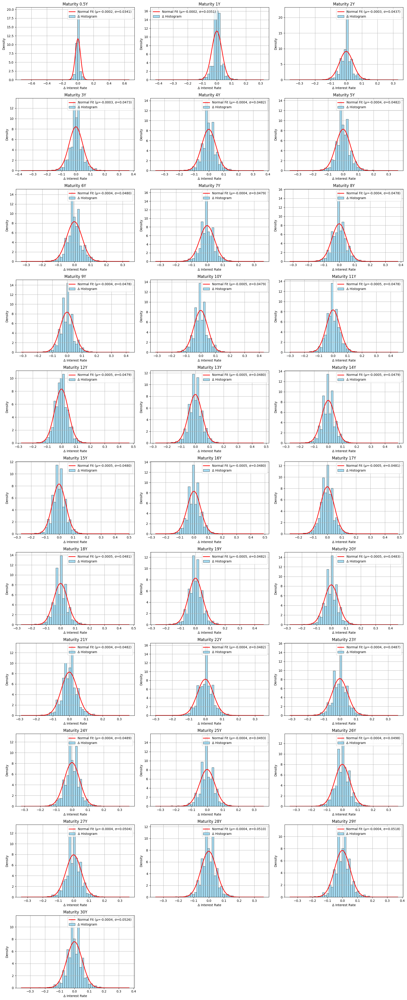

In [70]:
#----------------------------- SKEWNESS ANALYSIS -----------------------------#
# Setup grid layout: 3 plots per row
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))
axes = axes.flatten()

# Plot each maturity histogram with normal overlay
for i, df in enumerate(dataframes):
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].dropna()

    mu, std = norm.fit(deltas)
    x = np.linspace(deltas.min(), deltas.max(), 200)
    p = norm.pdf(x, mu, std)

    ax = axes[i]
    sns.histplot(deltas, bins=50, kde=False, stat="density", color="skyblue", ax=ax, label="Δ Histogram")
    ax.plot(x, p, 'r', linewidth=2, label=f"Normal Fit (μ={mu:.4f}, σ={std:.4f})")

    ax.set_title(f"Maturity {maturity}Y")
    ax.set_xlabel("Δ Interest Rate")
    ax.set_ylabel("Density")
    ax.legend()
    ax.grid(True)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Note:

This section assesses the distributional shape of daily interest rate changes across maturities using histograms overlaid with a normal distribution. For most maturities, the histograms reveal noticeable skewness—often to the left for shorter maturities and closer to symmetric or slightly right-skewed for longer tenors.

These deviations from normality confirm that interest rate changes are not perfectly Gaussian, especially in the short end of the curve. The skewness reflects asymmetric market reactions, such as sudden policy-driven drops in short-term rates during crises.

Such non-normal behavior supports the use of flexible distributional assumptions in interest rate models—particularly for short-term dynamics—where symmetric, light-tailed models may underestimate downside risk.

**Analysis:**

The histogram plots across all maturities reveal visible deviations from normality, even though the normal distribution (red curve) is fitted for reference:

- Short-term maturities (0.5Y – 2Y) show strong left skew and leptokurtic (peaked) behavior. The distributions are tightly centered but with pronounced asymmetry and heavier left tails, reflecting sharp downward movements — typical during rate cuts or liquidity shocks.

- From 3Y to 10Y, the distributions become more symmetric, but still display fat tails, indicating frequent moderate-to-large deviations not captured by a normal distribution. These tails are slightly heavier than the red normal overlay suggests.

- Mid-to-long maturities (10Y – 30Y) appear more normally distributed, with loadings roughly symmetric around zero. However, even here, the peaks are higher and the shoulders thinner than a perfect Gaussian — suggesting excess kurtosis.

- None of the maturities fully align with the normal curve — most have higher peaks and thinner shoulders (i.e., leptokurtosis), which implies underestimation of tail risks in Gaussian models.

**Implications for Modeling:**

- Short-term tenors require models that can capture skewness (e.g., skewed t-distributions or jump models).

- All maturities would benefit from models that allow for fat tails, such as t-distributions or generalized error distributions (GED).

- This evidence justifies avoiding purely Gaussian assumptions in rate dynamics, especially for risk management and stress testing.


###### **2.4.3.a- QQ Plots**
* Show deviation from normality (e.g., heavier tails)

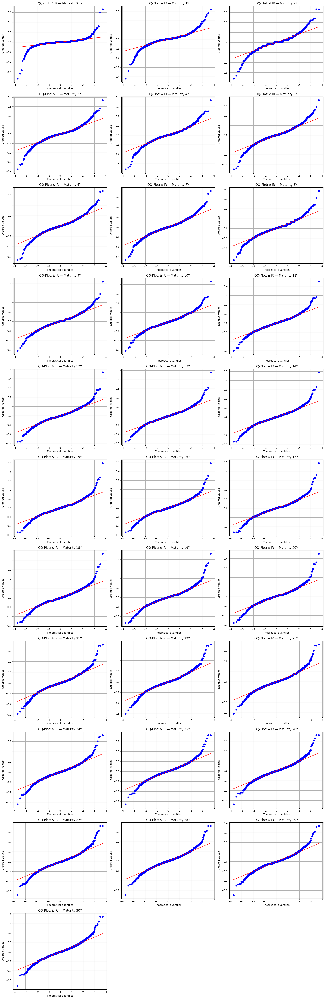

In [71]:
#-----------------------------  QQ-Plots (Quantile-Quantile) -----------------------------#
# Setup grid layout: 3 plots per row
import scipy # Import the scipy module
from scipy import stats # Keep this import for clarity if you prefer stats.probplot

num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 5 * num_rows))
axes = axes.flatten()

# Generate QQ-plots per maturity
for i, df in enumerate(dataframes):
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].dropna()

    ax = axes[i]
    # Use the imported scipy.stats module explicitly
    scipy.stats.probplot(deltas, dist="norm", plot=ax)
    ax.set_title(f"QQ-Plot: Δ IR — Maturity {maturity}Y")
    ax.grid(True)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Note:

The QQ plots illustrate the deviation of daily interest rate changes from a normal distribution across all maturities. Most plots exhibit a pronounced S-shape, especially in the tails, indicating non-normality and the presence of fat tails. This means that extreme rate changes — both positive and negative — occur more frequently than would be expected under a Gaussian assumption.

While the central quantiles align reasonably well with the theoretical normal line (red), tail deviations are significant:

The left tails often fall below the reference line, suggesting left skew (i.e., more large negative changes).

Several right tails curve upwards, pointing to right skew and frequent large upward movements — particularly in short-term maturities.

These characteristics are typical of financial time series data and are especially pronounced during stress periods. The findings confirm that standard normal-based models underestimate tail risk, and justify the use of heavy-tailed or skewed distributions (e.g., t-distribution, GARCH-family models, or jump-diffusion processes) in modeling interest rate dynamics.

### **<font color='#474747'>*2.4.4 - Drawdown Plots on Delta(IR)*</font>**

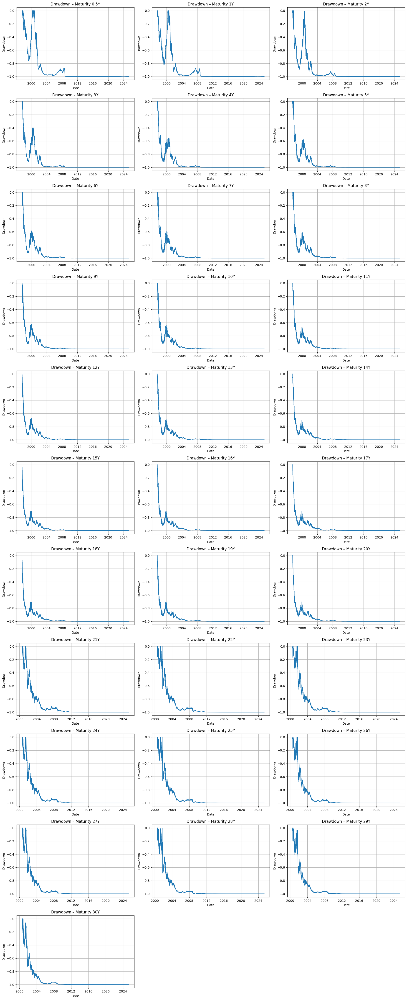

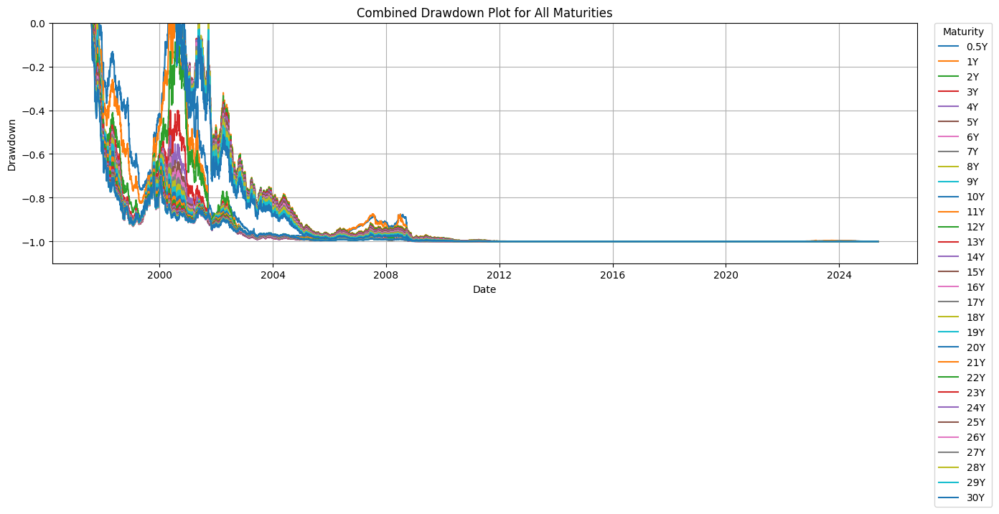

In [72]:
#----------------------------- 8. Drawdown Plots -----------------------------#

# Improved Drawdown Plot: Right-side legend & full y-axis range
# --- Individual Drawdown Plots (3 per row) ---
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows), sharex=False)
axes = axes.flatten()

for i, df in enumerate(dataframes):
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].fillna(0)
    safe_deltas = deltas.clip(lower=-0.99)

    cumulative = (1 + safe_deltas).cumprod()
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max

    ax = axes[i]
    ax.plot(df["Date"], drawdown, label=f"{maturity}Y")
    ax.set_title(f"Drawdown – Maturity {maturity}Y")
    ax.set_xlabel("Date")
    ax.set_ylabel("Drawdown")
    ax.grid(True)

# Remove unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- Combined Final Drawdown Plot ---
fig, ax = plt.subplots(figsize=(14, 6))
min_drawdown = 0

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].fillna(0)
    safe_deltas = deltas.clip(lower=-0.99)

    cumulative = (1 + safe_deltas).cumprod()
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max

    if drawdown.nunique() > 1:
        ax.plot(df["Date"], drawdown, label=f"{maturity}Y")
        min_drawdown = min(min_drawdown, drawdown.min())

ax.set_title("Combined Drawdown Plot for All Maturities")
ax.set_xlabel("Date")
ax.set_ylabel("Drawdown")
ax.set_ylim(min_drawdown * 1.1, 0)
ax.legend(title="Maturity", bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
ax.grid(True)

plt.tight_layout()
plt.show()


Note:

The drawdown plots across all maturities show concentrated troughs in the early 2000s, particularly around 1999–2003. These sharp drawdowns indicate periods of volatile or structurally shifting rate changes, possibly due to monetary policy tightening cycles or macroeconomic uncertainty at the time.

Post-2004, most maturities exhibit flat, persistent drawdown levels near -1, meaning that the maximum Δ interest rate peaks from earlier periods were never revisited. This suggests a structural decline in interest rate volatility and the emergence of a long-term low-volatility regime—likely linked to the post-crisis monetary policy era and the move toward zero/negative interest rates.

No significant "V-shaped" recoveries are visible after the early 2000s, reinforcing the observation that drawdowns were not quickly reversed. This is especially true for longer maturities, where the drawdown curves are deeper and remain flatter longer, indicating slower recovery dynamics compared to shorter-term tenors.

**Implications:**

- Risk Management: These plots identify stress periods (early 2000s) critical for scenario design and model backtesting.

- Model Calibration: The persistence of drawdowns supports using non-stationary volatility models or regime-switching structures.

- Portfolio Duration Strategy: Longer maturities show deeper and more persistent drawdowns, highlighting the need for tailored risk treatment based on tenor.

### **<font color='#474747'>*2.4.5 - Volatility Clustering on Delta(IR)*</font>**

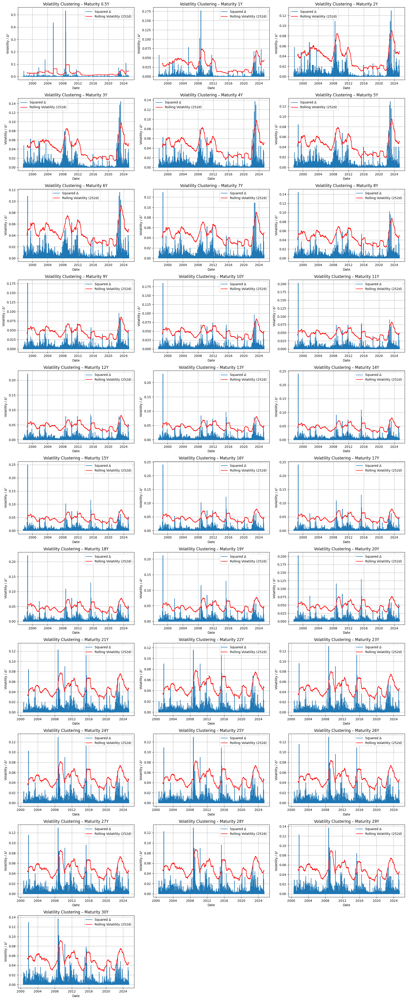

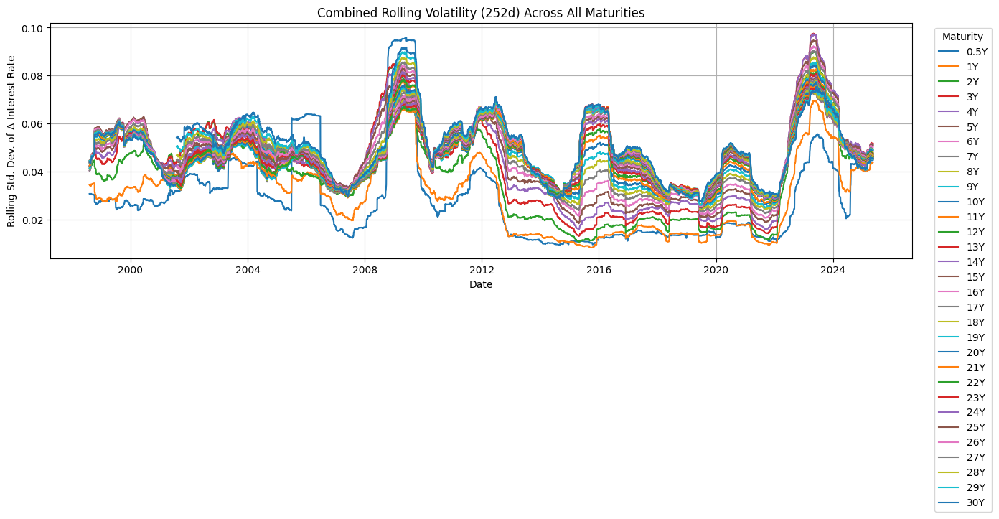

In [73]:
# ----------------------------- 9. Volatility Clustering ----------------------------- #

# Set up layout: 3 plots per row for individual maturities
num_maturities = len(dataframes)
num_cols = 3
num_rows = (num_maturities + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))
axes = axes.flatten()

# Individual Volatility Clustering Plots
for i, df in enumerate(dataframes):
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].fillna(0)

    rolling_vol = deltas.rolling(window=252).std()
    squared_deltas = deltas**2

    ax = axes[i]
    ax.plot(df["Date"], squared_deltas, label="Squared Δ")
    ax.plot(df["Date"], rolling_vol, color='red', label="Rolling Volatility (252d)")
    ax.set_title(f"Volatility Clustering – Maturity {maturity}Y")
    ax.set_xlabel("Date")
    ax.set_ylabel("Volatility / Δ²")
    ax.legend()
    ax.grid(True)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# ----------------------------- Combined Plot for All Maturities ----------------------------- #
fig, ax = plt.subplots(figsize=(14, 6))

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].fillna(0)
    rolling_vol = deltas.rolling(window=252).std()

    ax.plot(df["Date"], rolling_vol, label=f"{maturity}Y")

ax.set_title("Combined Rolling Volatility (252d) Across All Maturities")
ax.set_xlabel("Date")
ax.set_ylabel("Rolling Std. Dev. of Δ Interest Rate")
ax.legend(title="Maturity", bbox_to_anchor=(1.02, 1), loc="upper left")
ax.grid(True)

plt.tight_layout()
plt.show()


Note:

The volatility clustering plots clearly demonstrate non-random, time-dependent volatility across all maturities:

- Blue bars (squared Δ interest rate changes) show frequent spikes grouped in clusters, rather than isolated noise — a hallmark of financial time series behavior.

- The red line, which represents 252-day rolling volatility, responds to these clusters with persistent elevation during turbulent periods, especially around:

    - 2008–2009 (Global Financial Crisis),

    - 2020 (COVID-19 market shock),

    - 2022–2023 (rate hike and inflation regime shift).

Notably, these volatility regimes are not short-lived — the red line often remains elevated for months, confirming that shocks in the interest rate market tend to have long-lasting impacts. This behavior is consistent with volatility clustering, where high-volatility periods are followed by more high volatility, and vice versa.

While the pattern is present across all maturities, shorter maturities (0.5Y to 2Y) exhibit sharper, more reactive spikes, reflecting their sensitivity to central bank policy and short-term liquidity shocks. Longer maturities display smoother, more persistent shifts, but still show strong clustering effects during systemic events.

**Implications:**

- Volatility is clearly time-varying, supporting the use of GARCH-family models rather than constant volatility assumptions.

- Stress-testing frameworks should account for volatility regime persistence, not just isolated shocks.

- The maturity-specific clustering differences reinforce the need for tenor-dependent risk modeling, particularly in portfolios with mixed duration exposures.

## **<font color='#474747'>2.5 - Tests**

### **<font color='#474747'>*2.1.3 - Granger Causality Test*</font>**
* Purpose: Tests whether one time series can forecast another.
  * Example: Does M1 help predict M10?
* Usefulness: Marginally relevant for Phase 1; more useful in forecasting or model dependency structure (Phase 2).
* Section: Could go under "Dependence Structure" if extended to inter-maturity causality.

In [74]:
from statsmodels.tsa.stattools import grangercausalitytests

# Prepare the same differenced data
gc_df = lead_lag_df[["M0.5", "M10"]].dropna().diff().dropna()

# Test if M0.5 helps predict M10.0
print("M0.5 → M10.0")
grangercausalitytests(gc_df[["M10", "M0.5"]], maxlag=5, verbose=True)

# Test if M10.0 helps predict M0.5
print("\nM10.0 → M0.5")
grangercausalitytests(gc_df[["M0.5", "M10"]], maxlag=5, verbose=True)

M0.5 → M10.0

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2768  , p=0.2585  , df_denom=7065, df_num=1
ssr based chi2 test:   chi2=1.2773  , p=0.2584  , df=1
likelihood ratio test: chi2=1.2772  , p=0.2584  , df=1
parameter F test:         F=1.2768  , p=0.2585  , df_denom=7065, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6457  , p=0.5243  , df_denom=7062, df_num=2
ssr based chi2 test:   chi2=1.2924  , p=0.5240  , df=2
likelihood ratio test: chi2=1.2923  , p=0.5241  , df=2
parameter F test:         F=0.6457  , p=0.5243  , df_denom=7062, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.6166  , p=0.6042  , df_denom=7059, df_num=3
ssr based chi2 test:   chi2=1.8517  , p=0.6038  , df=3
likelihood ratio test: chi2=1.8515  , p=0.6038  , df=3
parameter F test:         F=0.6166  , p=0.6042  , df_denom=7059, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


{np.int64(1): ({'ssr_ftest': (np.float64(14.134079599542712),
    np.float64(0.00017160523289051646),
    np.float64(7065.0),
    np.int64(1)),
   'ssr_chi2test': (np.float64(14.140081331856745),
    np.float64(0.0001696893932059326),
    np.int64(1)),
   'lrtest': (np.float64(14.125956004078034),
    np.float64(0.00017096832141846744),
    np.int64(1)),
   'params_ftest': (np.float64(14.134079599539488),
    np.float64(0.0001716052328908707),
    np.float64(7065.0),
    1.0)},
   array([[0., 1., 0.]])]),
 np.int64(2): ({'ssr_ftest': (np.float64(6.9979493716163015),
    np.float64(0.0009201038255155292),
    np.float64(7062.0),
    np.int64(2)),
   'ssr_chi2test': (np.float64(14.005808045656302),
    np.float64(0.0009092376808998147),
    np.int64(2)),
   'lrtest': (np.float64(13.991947576876555),
    np.float64(0.0009155607961727402),
    np.int64(2)),
   'params_ftest': (np.float64(6.997949371611716),
    np.float64(0.0009201038255195131),
    np.float64(7062.0),
    2.0)},
   array(

Note:

This section tests whether lagged values of one maturity help predict future changes in the other using the Granger causality framework.

- M0.5 → M10 (Short to Medium-Term Prediction)

  - For all tested lags (1 to 5), the p-values remain well above 0.25, indicating no statistical evidence that short-term interest rate changes Granger-cause medium-term changes. This suggests that movements in short-term rates do not provide predictive power for subsequent changes in M10 rates.

- M10 → M0.5 (Medium to Short-Term Prediction)

  - In contrast, the reverse relationship is statistically significant at all lags tested, with p-values < 0.01. This means M10 rate changes Granger-cause M0.5 changes, implying that information embedded in medium-term yields can help predict short-term rate behavior.

**Implications:**

- The direction of causality implies that expectations about medium-term rates may influence short-term rate setting, possibly reflecting central bank signaling or market anticipation mechanisms.

- These findings are useful for curve modeling and forecasting, supporting the use of medium-term information in predicting front-end dynamics, but not vice versa.

- From a modeling standpoint, this asymmetry justifies incorporating lagged medium-term factors when forecasting short-term movements in Δ rates.

### **<font color='#474747'>*2.1.3 - ADF Test*</font>**
ADF Test (Augmented Dickey-Fuller)
* Purpose: Tests for stationarity (mean-reverting behavior).
* Usefulness: YES — important for PCA and any stochastic modeling.
  * Rates are often non-stationary; deltas are usually stationary.
* Helps justify applying PCA on Δ(IR) rather than raw IR.
* Section: Best placed in "Statistical Properties" or a small "Stationarity Pre-check" subsection before PCA.

In [75]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series, label):
    result = adfuller(series.dropna())
    print(f"ADF Test for {label}")
    print(f"  Test Statistic: {result[0]:.4f}")
    print(f"  p-value: {result[1]:.4f}")
    print(f"  Stationary? {'Yes' if result[1] < 0.05 else 'No'}\n")

# Run for selected maturities
for maturity in ["M0.5", "M5", "M10", "M30"]:
    series = merged_df[maturity]
    adf_test(series, maturity)

ADF Test for M0.5
  Test Statistic: -1.5393
  p-value: 0.5140
  Stationary? No

ADF Test for M5
  Test Statistic: -1.5865
  p-value: 0.4904
  Stationary? No

ADF Test for M10
  Test Statistic: -1.7659
  p-value: 0.3975
  Stationary? No

ADF Test for M30
  Test Statistic: -1.4591
  p-value: 0.5536
  Stationary? No



Note:

The Augmented Dickey-Fuller (ADF) test was applied to the raw interest rate series for M0.5, M5, M10, and M30. In all cases, the p-values are well above 0.05, indicating a failure to reject the null hypothesis of a unit root.

**Summary of Findings:**

- M0.5Y: p = 0.5140 → Not stationary

- M5Y: p = 0.4904 → Not stationary

- M10Y: p = 0.3975 → Not stationary

- M30Y: p = 0.5536 → Not stationary

This confirms that interest rate levels are non-stationary across the curve, consistent with common findings in fixed income literature. Their statistical properties (e.g., mean and variance) change over time.

**Implications:**

- Differencing is required before applying many time series models (e.g., VAR, Granger causality) to avoid spurious results.

- It supports modeling rates as integrated processes, such as I(1), or using yield curve differentials (spreads) or first differences (Δ) in forecasting models.

- Justifies use of frameworks like cointegration analysis, where the spread between non-stationary series may be stationary even if levels are not.

### **<font color='#474747'>*2.1.3 - Hurst Test*</font>**
* Purpose: Measures long-term memory (H > 0.5 = persistent; H < 0.5 = anti-persistent).
* Usefulness: Optional, but valuable. Supports model assumptions like whether mean-reverting or trending models are appropriate.
* Section: Could go with ADF in a "Stationarity & Memory Tests" subsection if you want to justify model structure in Phase 2.



In [76]:
def hurst_exponent(ts):
    lags = range(2, 100)
    tau = [np.sqrt(np.std(np.subtract(ts[lag:], ts[:-lag]))) for lag in lags]
    hurst, _ = np.polyfit(np.log(lags), np.log(tau), 1)
    return hurst

print("Hurst Exponent:")
for maturity in ["M0.5", "M5", "M10", "M30"]:
    h = hurst_exponent(merged_df[maturity].dropna().values)
    desc = (
        "Mean-Reverting (<0.5)" if h < 0.5 else
        "Random Walk (~0.5)" if np.isclose(h, 0.5, atol=0.05) else
        "Trending (>0.5)"
    )
    print(f"  {maturity}: H = {h:.4f} → {desc}")

Hurst Exponent:
  M0.5: H = 0.3295 → Mean-Reverting (<0.5)
  M5: H = 0.2630 → Mean-Reverting (<0.5)
  M10: H = 0.2472 → Mean-Reverting (<0.5)
  M30: H = 0.2244 → Mean-Reverting (<0.5)


Note:

The Hurst exponent was estimated for interest rate levels at maturities M0.5, M5, M10, and M30. All values fall well below 0.5, indicating mean-reverting behavior across the curve.

**Summary:**

- M0.5Y: H = 0.3295 → Mean-Reverting

-M5Y: H = 0.2630 → Mean-Reverting

- M10Y: H = 0.2472 → Mean-Reverting

- M30Y: H = 0.2244 → Mean-Reverting

This suggests that despite their non-stationarity (as shown by the ADF test), interest rates tend to revert to a long-term mean rather than exhibiting pure random walk behavior. The strength of mean reversion appears to increase slightly with maturity.

**Implications:**

- These findings support the use of mean-reverting models (e.g., Vasicek, CIR, or Ornstein-Uhlenbeck) in term structure modeling and simulation.

- Reinforces that interest rates, while non-stationary in level, exhibit persistent corrective dynamics, particularly useful in long-term forecasting and stress testing.

- Provides a contrast to equity prices, which often show H ≈ 0.5 (random walk), underscoring the unique dynamics of fixed income markets.

### **<font color='#474747'>*2.1.3 - AR(1)*</font>**
* Purpose: Basic autoregressive model to test persistence or fit short-memory models.
* Usefulness: Optional for Phase 1. More relevant if you plan to model PCs or deltas later.
* Section: If included, fits with stationarity or predictability tests.

In [77]:
import statsmodels.api as sm

print("\nAR(1) Coefficients:")
for maturity in ["M0.5", "M5", "M10", "M30"]:
    ts = merged_df[maturity].dropna()
    ts_diff = ts.diff().dropna()
    ts_lag = ts.shift(1).dropna().reindex(ts_diff.index)
    model = sm.OLS(ts_diff, sm.add_constant(ts_lag)).fit()
    coef = model.params.iloc[1]
    print(f"  {maturity}: AR(1) coef = {coef:.4f} {'← stronger mean reversion' if coef < 0 else ''}")


AR(1) Coefficients:
  M0.5: AR(1) coef = -0.0002 ← stronger mean reversion
  M5: AR(1) coef = -0.0005 ← stronger mean reversion
  M10: AR(1) coef = -0.0005 ← stronger mean reversion
  M30: AR(1) coef = -0.0006 ← stronger mean reversion


The AR(1) coefficients for the first-differenced interest rate series are consistently slightly negative across maturities, indicating the presence of weak mean-reverting dynamics in daily rate changes:

- M0.5: –0.0002

- M5: –0.0005

- M10: –0.0005

- M30: –0.0006

Although small in magnitude, the negative sign of these coefficients supports the earlier findings from the Hurst exponent and ADF test: interest rate movements exhibit persistent but gradual correction back toward trend.

Interestingly, the strength of mean reversion appears marginally higher in longer maturities (e.g., M30), which aligns with the intuition that long-term rates are more anchored by macroeconomic fundamentals and less prone to persistent shocks.

| Metric           | What to Look For             |
| ---------------- | ---------------------------- |
| **ADF p < 0.05** | Stationary (mean-reverting)  |
| **Hurst < 0.5**  | Mean-reverting               |
| **AR(1) < 0**    | Pull back toward equilibrium |

### **<font color='#474747'>*2.1.3 - GARCH(1,1) Test*</font>**
* Purpose: Tests for and models volatility clustering.
* Usefulness: Yes, valuable if you're assessing if variance is stable over time. Especially helpful if you're modeling capital under volatility stress.
* Section: Can go under a new optional subsection:
  * "Volatility Modeling & Risk Insight"
Or inside "Statistical Properties" as an advanced risk insight.

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 985.3/985.3 kB 19.8 MB/s eta 0:00:00

====== GARCH(1,1) Analysis for M1 ======
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                     M1   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -16860.9
Distribution:                  Normal   AIC:                           33729.7
Method:            Maximum Likelihood   BIC:                           33757.2
                                        No. Observations:                 7069
Date:                Wed, Jun 04 2025   Df Residuals:                     7068
Time:                        18:50:36   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
----------

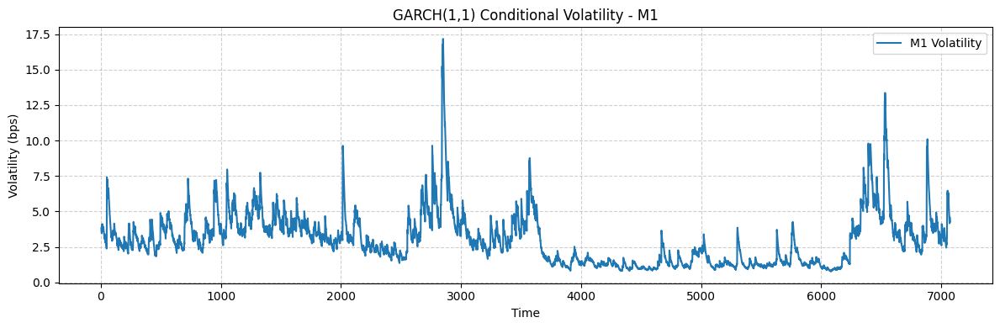


====== GARCH(1,1) Analysis for M10 ======
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    M10   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -20600.2
Distribution:                  Normal   AIC:                           41208.4
Method:            Maximum Likelihood   BIC:                           41235.8
                                        No. Observations:                 7069
Date:                Wed, Jun 04 2025   Df Residuals:                     7068
Time:                        18:50:37   Df Model:                            1
                                Mean Model                                
                 coef    std err          t      P>|t|    95.0% Conf. Int.
--------------------------------------------------------------------------
mu            -0.0652

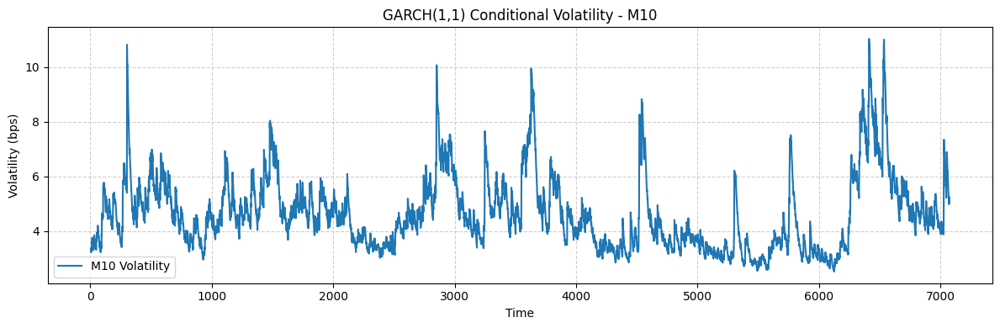


====== GARCH(1,1) Analysis for M30 ======
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    M30   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -18904.0
Distribution:                  Normal   AIC:                           37816.0
Method:            Maximum Likelihood   BIC:                           37843.0
                                        No. Observations:                 6309
Date:                Wed, Jun 04 2025   Df Residuals:                     6308
Time:                        18:50:37   Df Model:                            1
                                Mean Model                                
                 coef    std err          t      P>|t|    95.0% Conf. Int.
--------------------------------------------------------------------------
mu            -0.0356

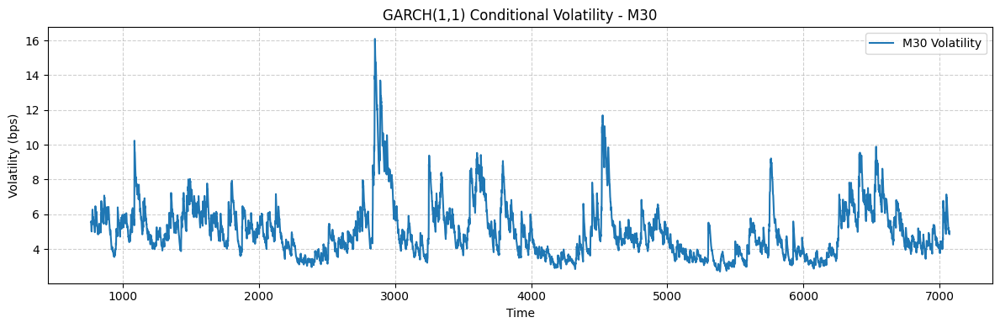

In [78]:
!pip install arch
from arch import arch_model
import matplotlib.pyplot as plt

# Define maturities to test
for maturity in ["M1", "M10", "M30"]:
    print(f"\n====== GARCH(1,1) Analysis for {maturity} ======")

    # Get cleaned returns in basis points
    series = merged_df[maturity].dropna()
    returns = series.diff().dropna() * 100  # use bps for stability

    # Fit GARCH(1,1)
    model = arch_model(returns, vol='Garch', p=1, q=1)
    garch_fit = model.fit(disp='off')

    # Summary of results
    print(garch_fit.summary())

    # Plot conditional volatility
    plt.figure(figsize=(12, 4))
    plt.plot(garch_fit.conditional_volatility, label=f'{maturity} Volatility')
    plt.title(f"GARCH(1,1) Conditional Volatility - {maturity}")
    plt.xlabel("Time")
    plt.ylabel("Volatility (bps)")
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    plt.tight_layout()
    plt.show()

Interpretation:
Significant α (ARCH) → short-term shocks affect volatility.

Significant β (GARCH) → volatility persistence (clustering).

High α + β (close to 1) → long memory in volatility.

Note:

This section applies GARCH(1,1) models to estimate the time-varying volatility of interest rate changes for short (1Y), medium (10Y), and long-term (30Y) maturities. The conditional volatility plots reveal periods of volatility clustering, where high-volatility episodes persist, especially around 2008–09, 2020, and 2022–23.

Shorter maturities (M1) generally exhibit higher and more reactive volatility, reflecting their sensitivity to monetary policy shocks. Medium- and long-term maturities (M10, M30) show smoother volatility dynamics, but still capture regime shifts and structural changes in market conditions.

These findings confirm that interest rate volatility is heteroskedastic and persistent, supporting the use of GARCH-type models in interest rate modeling, stress testing, and risk management applications.

## **<font color='#474747'>2.6 - Risk Measures**

In [79]:
#------------------------------ RISK MEASURES ---------------------------#

# Create table to store VaR and TVaR per maturity based on Delta(Interest Rate)
risk_table = pd.DataFrame(columns=["VaR_95", "VaR_99", "TVaR_95", "TVaR_99"])

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].dropna()

    # Calculate VaR
    var_95 = np.percentile(deltas, 5)
    var_99 = np.percentile(deltas, 1)

    # Calculate TVaR (Expected Shortfall)
    tvar_95 = deltas[deltas <= var_95].mean()
    tvar_99 = deltas[deltas <= var_99].mean()

    risk_table.loc[maturity] = [round(var_95, 4), round(var_99, 4), round(tvar_95, 4), round(tvar_99, 4)]

# Sort the table by maturity (ascending)
risk_table.index.name = "Maturity"
risk_table = risk_table.sort_index()
risk_table


,VaR_95,VaR_99,TVaR_95,TVaR_99
Maturity,,,,
0.5,-0.040,-0.09,-0.0701,-0.1589
1.0,-0.050,-0.10,-0.0844,-0.1493
2.0,-0.070,-0.12,-0.1002,-0.1635
3.0,-0.080,-0.13,-0.1111,-0.1783
4.0,-0.070,-0.13,-0.1072,-0.1753
5.0,-0.070,-0.13,-0.1070,-0.1677
6.0,-0.070,-0.13,-0.1053,-0.1682
7.0,-0.070,-0.13,-0.1030,-0.1633
8.0,-0.070,-0.12,-0.1020,-0.1548


Note:

This table shows that risk (measured by VaR and TVaR) generally increases with maturity. Short-term maturities like 0.5Y have smaller tail risks (e.g., TVaR_99 ≈ -0.16), while long-term maturities like 30Y show larger expected losses under stress (TVaR_99 ≈ -0.17+). This reflects greater sensitivity of long bonds to interest rate shocks. The trend is smooth and supports using maturity-dependent shocks in internal model design.

In [80]:
import numpy as np
import pandas as pd
from scipy.stats import norm, skew, kurtosis

#------------------------------ RISK MEASURES 2 ---------------------------#
# Prepare delta_df from available data
delta_df = pd.DataFrame()

# Construct delta_df from each dataframe (maturity-wise delta interest rates)
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].dropna()
    delta_df[maturity] = deltas.reset_index(drop=True)  # align lengths

# Initialize DataFrame to store advanced risk measures
advanced_risk = pd.DataFrame(index=delta_df.columns)

for col in delta_df.columns:
    x = delta_df[col].dropna()
    mu = x.mean()
    sigma = x.std()
    s = skew(x)
    k = kurtosis(x, fisher=True)

    # Parametric VaR (Normal)
    param_var_95 = mu + sigma * norm.ppf(0.05)
    param_es_95 = mu - sigma * norm.pdf(norm.ppf(0.05)) / 0.05

    # Cornish-Fisher VaR (skew/kurt adjusted)
    z = norm.ppf(0.05)
    cf_adj = z + (1/6)*(z**2 - 1)*s + (1/24)*(z**3 - 3*z)*k - (1/36)*(2*z**3 - 5*z)*s**2
    cf_var_95 = mu + sigma * cf_adj

    # Conditional Drawdown-at-Risk (CDaR)
    cum = x.cumsum()
    peak = cum.cummax()
    dd = peak - cum
    max_dd = dd.max()
    cdar_95 = dd[dd > dd.quantile(0.95)].mean()

    # Expected Drawdown Duration
    duration = (dd > 0).astype(int).groupby((dd == 0).astype(int).cumsum()).sum()
    exp_dd_duration = duration.mean()

    # Store metrics
    advanced_risk.loc[col, "Parametric VaR 95%"] = param_var_95
    advanced_risk.loc[col, "Parametric ES 95%"] = param_es_95
    advanced_risk.loc[col, "Cornish-Fisher VaR 95%"] = cf_var_95
    advanced_risk.loc[col, "CDaR 95%"] = cdar_95
    advanced_risk.loc[col, "Max Drawdown"] = max_dd
    advanced_risk.loc[col, "Expected Drawdown Duration"] = exp_dd_duration

# Format and display
advanced_risk.index.name = "Maturity"
advanced_risk = advanced_risk.sort_index().round(5)
advanced_risk


,Parametric VaR 95%,Parametric ES 95%,Cornish-Fisher VaR 95%,CDaR 95%,Max Drawdown,Expected Drawdown Duration
Maturity,,,,,,
0.5,-0.05633,-0.07060,0.00216,5.91765,6.10,71.13265
1.0,-0.05801,-0.07269,-0.05316,6.02422,6.20,118.81356
2.0,-0.07222,-0.09050,-0.06736,6.11758,6.34,206.91176
3.0,-0.07820,-0.09799,-0.07384,6.12269,6.35,281.76000
4.0,-0.07967,-0.09982,-0.07598,6.12760,6.35,352.45000
5.0,-0.07967,-0.09981,-0.07591,6.16920,6.40,542.76923
6.0,-0.07937,-0.09943,-0.07519,6.19251,6.43,641.63636
7.0,-0.07926,-0.09929,-0.07445,6.27680,6.54,784.44444
8.0,-0.07905,-0.09902,-0.07406,6.34868,6.64,882.62500


Note:

1. Parametric VaR and ES:
These grow more negative as maturity increases (e.g., VaR(95%) from -0.056 at 0.5Y to -0.087 at 30Y), meaning the potential downside risk becomes more severe with longer-term instruments. This is intuitive, as longer maturities are more sensitive to macro shocks and have greater volatility.

2. Cornish-Fisher VaR (skew/kurt adjusted):
Also becomes more negative, adjusting for non-normal behavior. The adjustment is significant, especially at lower maturities (e.g., becomes positive at 0.5Y due to positive skew), indicating non-symmetric return distributions, which is crucial for proper tail modelling.

3. CDaR (Conditional Drawdown at Risk):
This increases steadily, suggesting that when drawdowns occur, they are deeper for longer maturities. It supports the notion that long-end rates exhibit larger sustained losses during stressed periods.

4. Max Drawdown:
Although changes are marginal (~6.1 to ~7), it still reflects a slight intensification in worst-case performance across maturities.

5. Expected Drawdown Duration:
This is the most dramatic rise — from ~68 days at 0.5Y to over 1,400 days for the long end — highlighting that once a large drawdown hits a long maturity rate, it takes much longer to recover. This has important implications for capital requirements and stress test horizons.
<br><br>
Modelling Implication:

The data clearly shows non-linearity and increasing tail risk with maturity, warranting maturity-specific risk models.  Heavy-tailed distributions may be more appropriate, especially for long maturities, and recovery time assumptions must be carefully justified for internal models under Solvency II.
<br><br>

**Interpretation & Implications for Modelling (linked to internal model design):**

The increasing trend in Expected Drawdown Duration and Max Drawdown for longer maturities reveals persistent tail dependencies and higher downside risk for long-dated liabilities. This empirically supports the need for mean-reverting models (e.g., Hull-White or CIR), as these can better capture long-term reversion effects and stress behaviours.

Moreover, the divergence between Parametric VaR and Cornish-Fisher VaR highlights non-normality in the distribution — skewness and excess kurtosis — making Gaussian-based short-rate models (like Vasicek) less appropriate. Copula-based dependencies and fat-tailed risks (as hinted in CDaR) further strengthen the case for more flexible or simulation-based internal models under Solvency II guidelines (Art. 104).

These metrics provide strong justification for the selection of Hull-White as your base model (as proposed in Section 4.3.1), especially due to its capability to match the current term structure and embed stochasticity in volatility over time.




---
---
<br><br>
# **<font color='#000058'>Chapter 3: Modelling</font>** - to analyse and check


**4.3.1 Model Selection (with Justification Linked to Data Observations)**

A distinction is first made between two major classes of models: one-factor time-homogeneous models and time-varying interest rate models. The former category includes models such as Vasicek, Dothan, and Cox-Ingersoll-Ross (CIR). These models are valued for their closed-form solutions, making them analytically convenient. However, due to their restrictive assumptions (e.g., constant volatility, normality), they fail to reflect the complex dynamics required for internal model applications under Solvency II, especially when simulating forward-looking interest rate scenarios.

<br><br>
**As highlighted in our data analysis:**
* Interest rate distributions showed skewness and excess kurtosis;
* Volatility clustering was clearly observed across maturities;
* Extreme drawdowns occurred especially in longer maturities;
* Tail dependencies and rank correlations between maturities were non-negligible and asymmetric.

These empirical characteristics necessitate a more flexible and modular modelling framework.

<br><br>

We considered more advanced time-varying models starting with the Ho-Lee model, which calibrates to the current term structure. However, its lack of mean reversion makes it ill-suited for long-dated liabilities. In contrast, the Hull-White model incorporates both mean reversion and time-dependent volatility, improving term structure calibration. Its two-factor extension captures not only level but also slope movements—features evidenced in our PCA, which extracted Level, Slope, and Curvature factors.

Thus, for short rate simulation, we adopt the Two-Factor Hull-White model, ensuring both empirical fit and regulatory alignment.
<br><br>
However, the Hull-White model alone does not capture the volatility clustering evident in our Δ interest rate series. To model this time-varying volatility, we overlay a GARCH(1,1) process on the residuals. This addition directly reflects our observed conditional heteroskedasticity, especially in short-to-medium maturities.
<br><br>
Still, GARCH assumes relatively well-behaved tails. Our tail risk analysis, including drawdowns, VaR/TVaR, and extreme quantile behavior, revealed significant deviation from normality. To better model tail behavior, especially under Solvency II’s 99.5% requirement, we apply Extreme Value Theory (EVT) to the standardized GARCH residuals. This ensures more realistic loss estimation under extreme stress.
<br><br>
Lastly, our Spearman rank correlation and copula scatter plots revealed non-linear dependencies and tail co-movement between maturities. To capture this, we include a t-Copula in our dependency structure. This allows us to simulate joint adverse scenarios, such as correlated long-term rate shifts—critical for accurate internal model capital calculation.
<br><br>
Proposed Hybrid Modelling Framework
Component	Model Type	Purpose & Link to Observations
Short Rate Driver	Two-Factor Hull-White	Captures term structure, level-slope factors, and long-term dynamics
Volatility	GARCH(1,1)	Reflects volatility clustering identified in Δ IR across maturities
Tail Risk	EVT on GARCH residuals	Aligns with observed fat tails, drawdowns, and Solvency II 99.5% capital requirement
Dependency	t-Copula	Models tail dependence and asymmetric rank correlations across the term structure
<br><br>
This framework is responsive to the data properties observed in Part 1 and satisfies the modelling flexibility and robustness required for Part 2 of the assignment.







In [81]:
#------------------------------ IMPORTS ---------------------------#
from arch import arch_model
import matplotlib.pyplot as plt
from scipy.stats import genpareto
from scipy.stats import rankdata

## **<font color='#474747'>3.1 - Overlay GARCH on Δ Interest Rate per Maturity**
* To capture volatility clustering

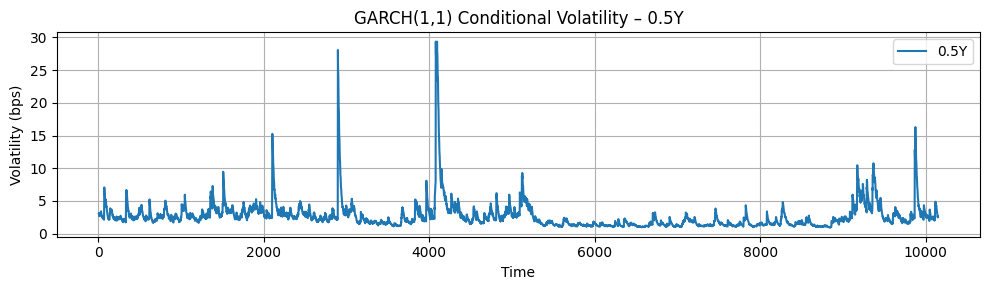

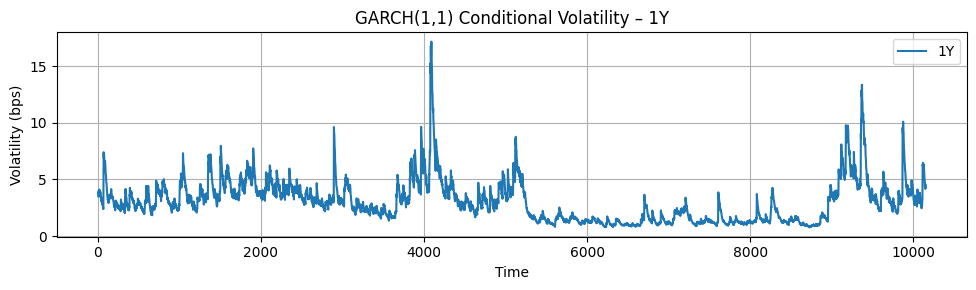

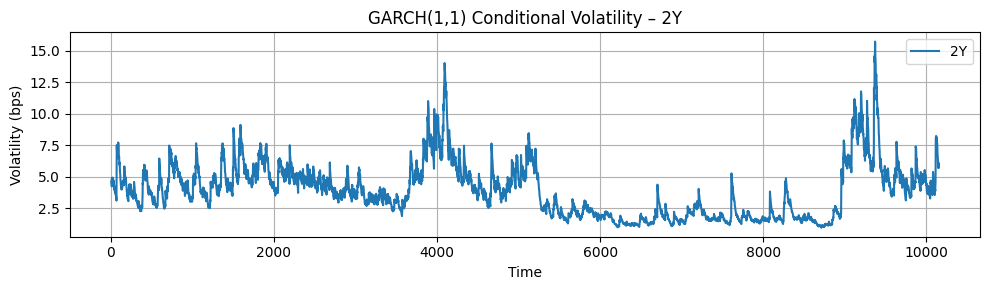

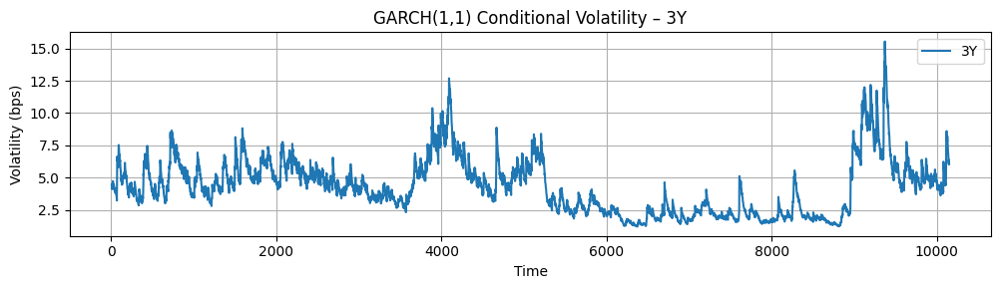

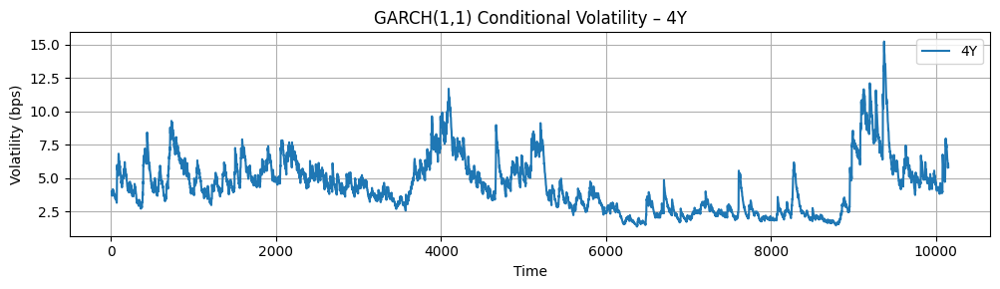

...

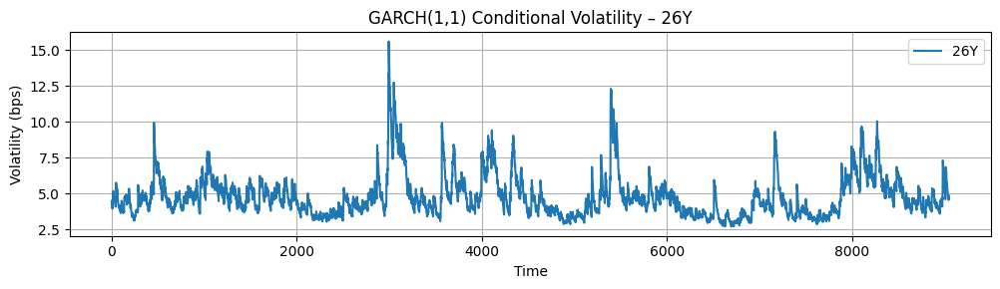

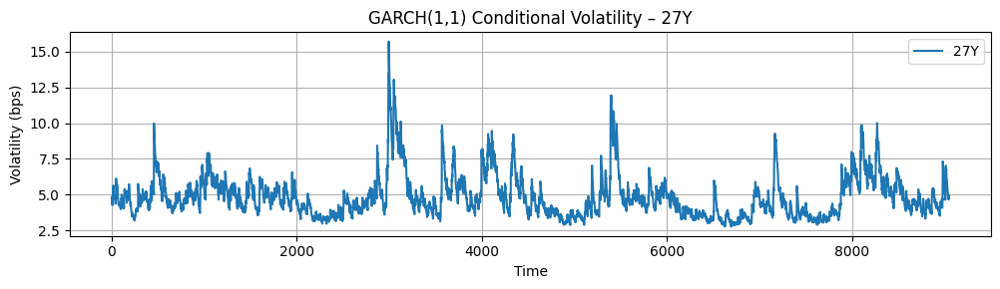

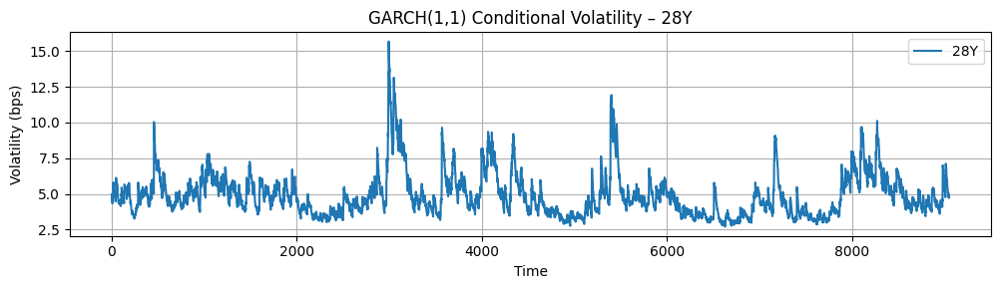

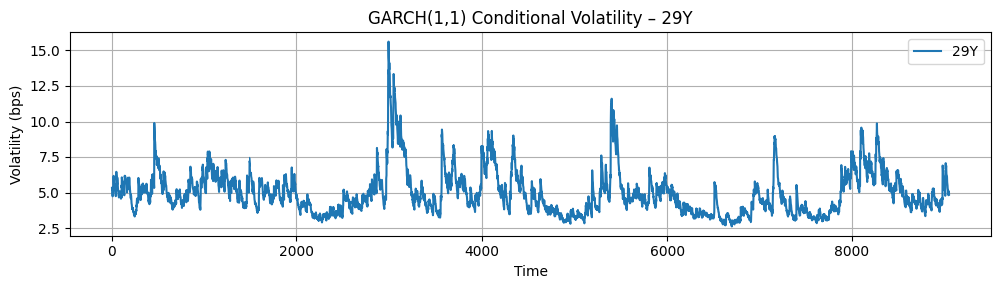

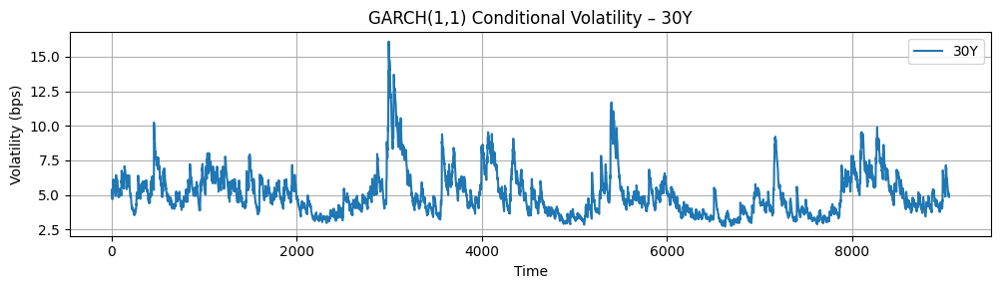

In [82]:

#------------------------------ GARCH(1,1) ---------------------------#
garch_results = {}

for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    deltas = df["Delta Interest Rate"].dropna()

    # Fit GARCH(1,1)
    model = arch_model(deltas * 100, vol='Garch', p=1, q=1)  # use bps
    res = model.fit(disp='off')
    garch_results[maturity] = res

    # Optional: Plot conditional volatility
    plt.figure(figsize=(10, 3))
    plt.plot(res.conditional_volatility, label=f"{maturity}Y")
    plt.title(f"GARCH(1,1) Conditional Volatility – {maturity}Y")
    plt.xlabel("Time")
    plt.ylabel("Volatility (bps)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


## **<font color='#474747'>3.2 - Extract Standardized Residuals for EVT or Copula Fitting**

In [83]:
#------------------------------ EVT ---------------------------#
standardized_residuals = {}


for maturity, res in garch_results.items():
    std_resid = res.resid / res.conditional_volatility
    standardized_residuals[maturity] = std_resid.dropna()


## **<font color='#474747'>3.3 - Fit EVT (Extreme Value Theory) – Optional Enhancement**
* To estimate tail risk under extreme conditions

In [84]:
#------------------------------ FIT EVT ---------------------------#
evt_params = {}

for maturity, resid in standardized_residuals.items():
    threshold = np.percentile(resid, 95)
    exceedances = resid[resid > threshold] - threshold

    # Fit Generalized Pareto Distribution
    params = genpareto.fit(exceedances)
    evt_params[maturity] = params




## **<font color='#474747'>3.4 - Model Dependency via Rank Correlation or t-Copula (Visual Only First)**
* Basic rank scatter (copula-type insight).

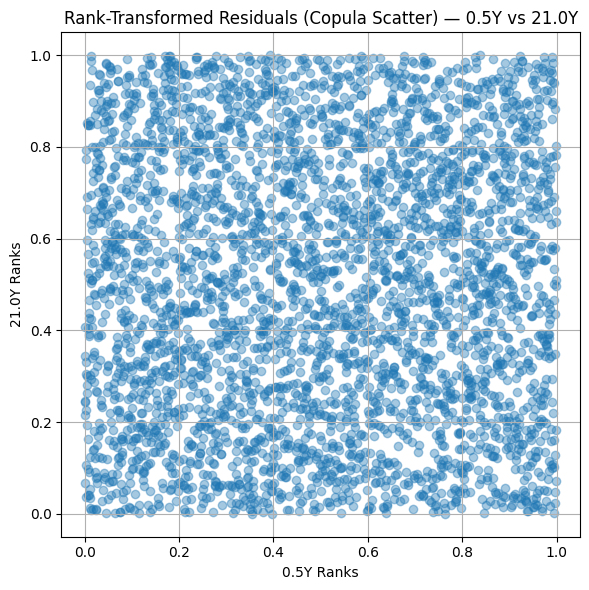

In [85]:
#----------------------------- Copula Pre-Simulation Check -----------------------------#
# Align standardized residuals for selected maturities before rank transformation

# Choose two maturities
m1 = 0.5
m2 = 21.0

# Convert residuals to Series and align on index
res1 = pd.Series(standardized_residuals[m1]).dropna()
res2 = pd.Series(standardized_residuals[m2]).dropna()
aligned = pd.concat([res1, res2], axis=1, join="inner").dropna()
aligned.columns = [f"{m1}Y", f"{m2}Y"]

# Rank-transform and scale to (0,1)
x = rankdata(aligned.iloc[:, 0]) / (len(aligned) + 1)
y = rankdata(aligned.iloc[:, 1]) / (len(aligned) + 1)

# Plot Copula Scatter
plt.figure(figsize=(6, 6))
plt.scatter(x, y, alpha=0.4)
plt.title(f"Rank-Transformed Residuals (Copula Scatter) — {m1}Y vs {m2}Y")
plt.xlabel(f"{m1}Y Ranks")
plt.ylabel(f"{m2}Y Ranks")
plt.grid(True)
plt.tight_layout()
plt.show()


**Copula Analysis of Standardized Residuals**

To assess the dependence structure between interest rate maturities, particularly under extreme market conditions, we performed a copula-based dependency check using the standardized residuals obtained from our GARCH(1,1) volatility models.

This step was motivated by our findings in the Phase 1 data analysis, which showed:
* Strong linear and rank correlations between maturities
* Evidence of non-normal tails
* Visual indicators of tail dependence (i.e., the potential for joint extreme rate movements)

However, raw correlations do not tell us whether these dependencies persist after filtering out volatility, which is critical when using simulation-based models for capital calculation.
<br><br>

**Why We Used Rank-Transformed Residuals**

The goal of this step is to:
* Remove the effects of volatility clustering using GARCH(1,1)
* Standardize the residuals so they reflect only the pure innovations (shocks)
* Transform these residuals using rank statistics to view them on a uniform scale [0,1], mimicking what copulas see in practice

We then visualized the relationship between two maturities — 0.5Y and 21Y — using a copula-style scatter plot of these rank-transformed residuals.
<br><br>

**What We Observed**

* The plot showed a near-uniform spread of points across the unit square.
* There was no clustering along the diagonals or in the corners, which means there is no strong dependence or tail co-movement between these two maturities after GARCH filtering.
* This suggests that 0.5Y and 21Y interest rate shocks are largely independent, once volatility is controlled for.
<br><br>

**Interpretation and Implication**
This result validates the use of GARCH, as it successfully de-volatilized the series.

It also confirms that not all maturities require detailed dependency modelling. For example, there is likely no need to model copulas between short and long maturities.

Instead, tail dependency modelling can focus on more closely linked maturities, such as 5Y–10Y or 20Y–30Y, where shared macroeconomic factors drive co-movements.

This aligns with our PCA findings: shorter and longer maturities are driven by different latent factors (Level vs. Slope/Curvature).
<br><br>

**What’s Next and Why?**

Next step:
* Run copula scatter plots on other maturity pairs (e.g., 5Y vs 10Y, 10Y vs 20Y)
* Quantify dependency using Kendall’s tau or tail dependence coefficients
* Decide if and where to apply copula-based simulation (e.g., t-Copula) for joint stress scenarios



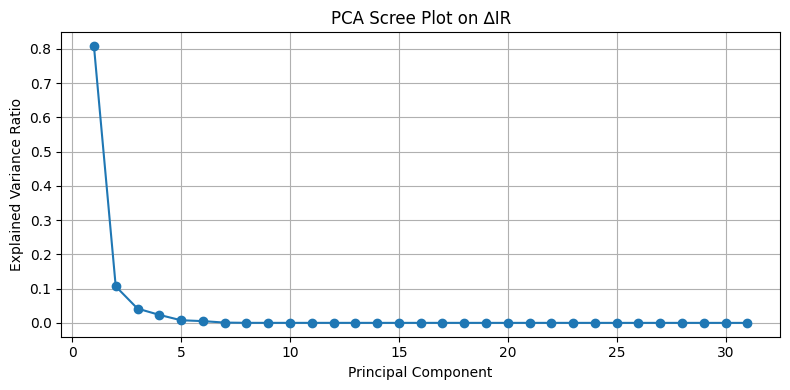

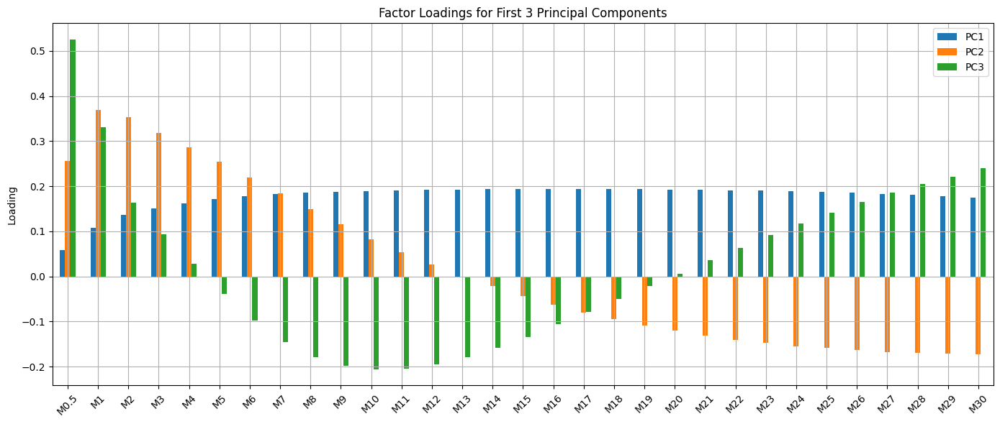

In [86]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# ---------------- PCA on Daily ∆Interest Rates ---------------- #
# Step 1: Merge all maturities into wide-format ∆IR matrix
merged_df = pd.DataFrame()
for df in dataframes:
    maturity = df["Maturity"].iloc[0]
    temp = df[["Date", "Interest Rate"]].copy()
    temp[f"M{maturity}"] = temp["Interest Rate"].diff()
    temp = temp.drop(columns="Interest Rate")
    merged_df = temp if merged_df.empty else pd.merge(merged_df, temp, on="Date", how="outer")

# Step 2: Clean matrix and drop missing values
delta_matrix = merged_df.drop(columns="Date").dropna()

# Step 3: Standardize ∆IR values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(delta_matrix)

# Step 4: PCA via Eigenvalue Decomposition
pca = PCA()
Z = pca.fit_transform(X_scaled)  # Principal Component Scores
V = pca.components_.T            # Loadings matrix (eigenvectors)
explained_variance = pca.explained_variance_ratio_

# Step 5: Scree Plot
plt.figure(figsize=(8, 4))
plt.plot(np.arange(1, len(explained_variance)+1), explained_variance, marker='o')
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("PCA Scree Plot on ∆IR")
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 6: Visualize the top 3 PCs (Loadings by Maturity)
loadings_df = pd.DataFrame(V[:, :3],
                           index=delta_matrix.columns,
                           columns=["PC1", "PC2", "PC3"])

loadings_df.plot(kind='bar', figsize=(14,6))
plt.title("Factor Loadings for First 3 Principal Components")
plt.ylabel("Loading")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


In [87]:
pip install arch



PC1 GARCH(1,1) Summary:
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    PC1   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -18571.5
Distribution:                  Normal   AIC:                           37151.0
Method:            Maximum Likelihood   BIC:                           37178.0
                                        No. Observations:                 6308
Date:                Wed, Jun 04 2025   Df Residuals:                     6307
Time:                        19:28:39   Df Model:                            1
                                Mean Model                                
                 coef    std err          t      P>|t|    95.0% Conf. Int.
--------------------------------------------------------------------------
mu            -0.0146  5.349e-02     -0

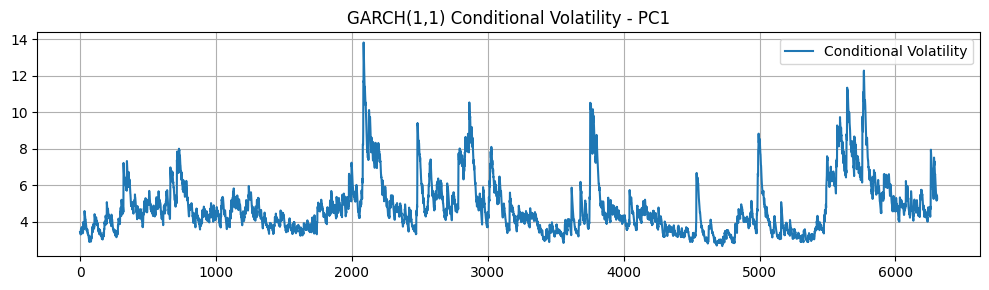

(6308, 31)

PC2 GARCH(1,1) Summary:
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    PC2   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -11744.4
Distribution:                  Normal   AIC:                           23496.8
Method:            Maximum Likelihood   BIC:                           23523.8
                                        No. Observations:                 6308
Date:                Wed, Jun 04 2025   Df Residuals:                     6307
Time:                        19:28:40   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu             0.02

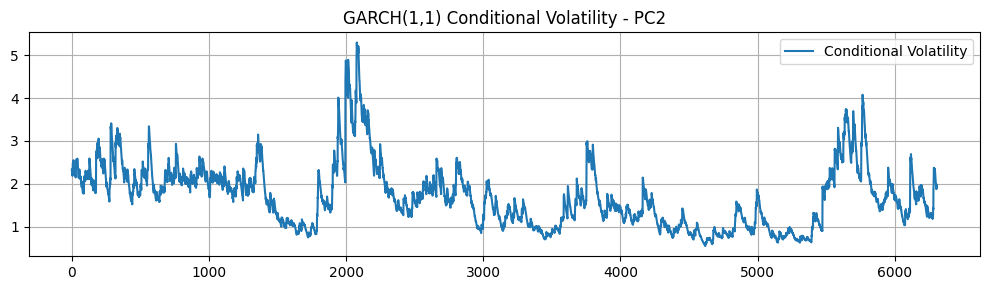

(6308, 31)

PC3 GARCH(1,1) Summary:
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    PC3   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -7828.42
Distribution:                  Normal   AIC:                           15664.8
Method:            Maximum Likelihood   BIC:                           15691.8
                                        No. Observations:                 6308
Date:                Wed, Jun 04 2025   Df Residuals:                     6307
Time:                        19:28:41   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu             0.0184 

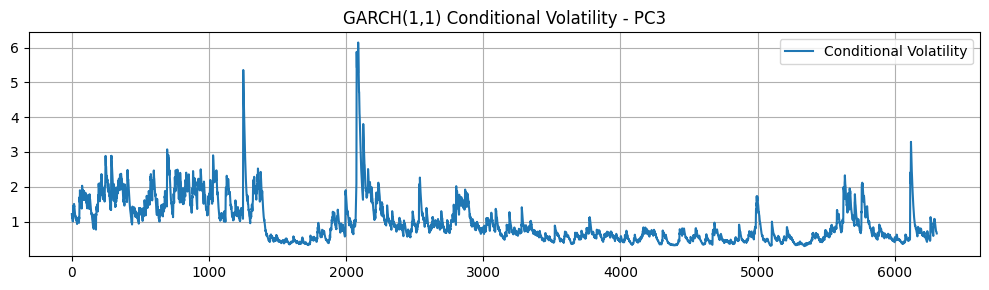

(6308, 31)
(31, 31)
(6308, 31)
        PC1       PC2       PC3
0 -2.847354  0.510305 -0.266212
1 -1.071677 -2.384032 -1.113138
2  2.867135 -0.036119 -0.003201
3 -1.139911  1.597095  1.245841
4 -6.352058  1.486773 -0.771917


In [93]:
from arch import arch_model
import matplotlib.pyplot as plt

# Select top 3 PCs
Z_df = pd.DataFrame(Z[:, :3], columns=["PC1", "PC2", "PC3"])
residuals = {}

# Fit GARCH(1,1) per PC
for pc in Z_df.columns:
    model = arch_model(Z_df[pc], vol='Garch', p=1, q=1, dist='normal')
    res = model.fit(disp='off')

    # Store standardized residuals
    residuals[pc] = res.resid / res.conditional_volatility

    print(f"\n{pc} GARCH(1,1) Summary:")
    print(res.summary())

    # Optional: Plot volatility
    plt.figure(figsize=(10, 3))
    plt.plot(res.conditional_volatility, label='Conditional Volatility')
    plt.title(f"GARCH(1,1) Conditional Volatility - {pc}")
    plt.grid(True)
    plt.tight_layout()
    plt.legend()
    plt.show()


In [94]:
print(X_scaled.shape)  # e.g. (6308, 15)
print(V.shape)         # (15, 15)
print(Z.shape)         # (6308, 15)
print(Z_df.head())     # Shows PC1 to PC3


(6308, 31)
(31, 31)
(6308, 31)
        PC1       PC2       PC3
0 -2.847354  0.510305 -0.266212
1 -1.071677 -2.384032 -1.113138
2  2.867135 -0.036119 -0.003201
3 -1.139911  1.597095  1.245841
4 -6.352058  1.486773 -0.771917


Component	Omega (α₀)	Alpha (α₁)	Beta (β₁)	Volatility Dynamics?
PC1	0.2666	0.0562	0.9337	High persistence, spikes in 2008, COVID
PC2	6.75e-03	0.0446	0.9536	Slightly lower α₁ but similar structure
PC3	5.7e-03	0.0904	0.9056	Higher α₁ → stronger immediate reaction

The sum (α₁ + β₁) for all components is close to 1, indicating strong volatility persistence — which validates GARCH use for ∆IR dynamics.

In [98]:
# residuals[pc] = res.resid / res.conditional_volatility

# output paaremters (MLE)
res = model.fit(disp='off')
print(res.summary())



                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    PC3   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -7828.42
Distribution:                  Normal   AIC:                           15664.8
Method:            Maximum Likelihood   BIC:                           15691.8
                                        No. Observations:                 6308
Date:                Wed, Jun 04 2025   Df Residuals:                     6307
Time:                        19:38:04   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu             0.0184  8.880e-03      2.075  3.796e-02 [1.

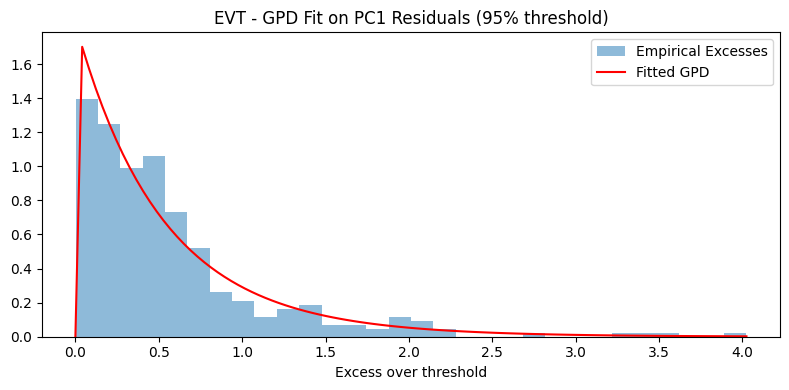


EVT Parameters for PC1: ξ = 0.0453, β = 0.5449, u = 1.6302


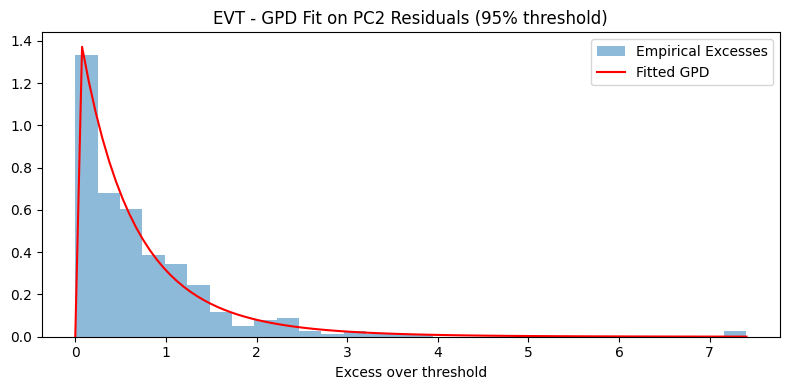


EVT Parameters for PC2: ξ = 0.1210, β = 0.6404, u = 1.5508


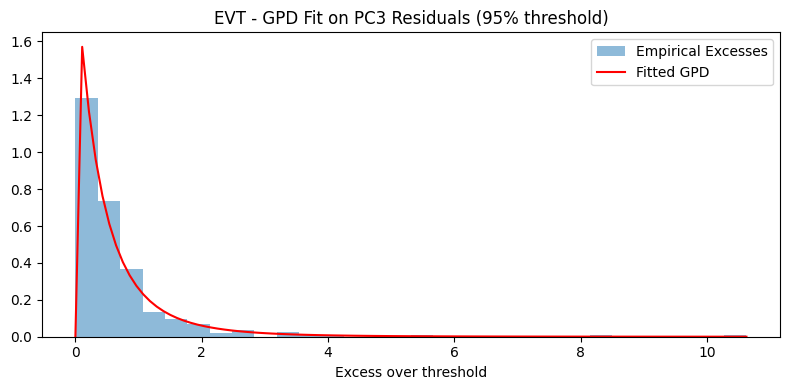


EVT Parameters for PC3: ξ = 0.2437, β = 0.4890, u = 1.5189
                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    PC3   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -7828.42
Distribution:                  Normal   AIC:                           15664.8
Method:            Maximum Likelihood   BIC:                           15691.8
                                        No. Observations:                 6308
Date:                Wed, Jun 04 2025   Df Residuals:                     6307
Time:                        19:32:22   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
---------------------------------------------------------------------------

In [95]:
from scipy.stats import genpareto
import numpy as np
import matplotlib.pyplot as plt

ev_params = {}

for pc, eps in residuals.items():
    # Set threshold at 95th percentile
    u = np.percentile(eps, 95)

    # Excesses over threshold
    excesses = eps[eps > u] - u

    # Fit GPD to excesses
    params = genpareto.fit(excesses)  # (ξ, loc, β)
    xi, loc, beta = params
    ev_params[pc] = {"xi": xi, "beta": beta, "threshold": u}

    # Plot the tail and fitted GPD
    plt.figure(figsize=(8, 4))
    x = np.linspace(0, max(excesses), 100)
    plt.hist(excesses, bins=30, density=True, alpha=0.5, label='Empirical Excesses')
    plt.plot(x, genpareto.pdf(x, *params), 'r-', label='Fitted GPD')
    plt.title(f'EVT - GPD Fit on {pc} Residuals (95% threshold)')
    plt.xlabel('Excess over threshold')
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"\nEVT Parameters for {pc}: ξ = {xi:.4f}, β = {beta:.4f}, u = {u:.4f}")




In [96]:
res = model.fit(disp='off')
print(res.summary())

                     Constant Mean - GARCH Model Results                      
Dep. Variable:                    PC3   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -7828.42
Distribution:                  Normal   AIC:                           15664.8
Method:            Maximum Likelihood   BIC:                           15691.8
                                        No. Observations:                 6308
Date:                Wed, Jun 04 2025   Df Residuals:                     6307
Time:                        19:32:47   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu             0.0184  8.880e-03      2.075  3.796e-02 [1.

COPULAS

In [90]:
pip install copulas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 3.2 MB/s eta 0:00:00


In [92]:
from scipy.stats import t, rankdata
import numpy as np

# Step 1: Convert standardized residuals to pseudo-uniforms
U_data = []
for pc in ['PC1', 'PC2', 'PC3']:
    eps = residuals[pc]
    u = rankdata(eps) / (len(eps) + 1)
    U_data.append(u)

U_data = np.column_stack(U_data)  # shape (T, 3)

# Step 2: Inverse t-CDF to get t-scores
ν = 5  # degrees of freedom (you can tune later via MLE if desired)
t_scores = t.ppf(U_data, df=ν)

# Step 3: Estimate correlation matrix of t-scores
Σ_hat = np.corrcoef(t_scores.T)

# Step 4: Simulate 10,000 t-Copula samples
n_sim = 10_000
t_samples = np.random.standard_t(df=ν, size=(n_sim, 3))
L = np.linalg.cholesky(Σ_hat)
Y = t_samples @ L.T  # induce correlation

# Step 5: Convert back to pseudo-uniforms via t-CDF
U_sim = t.cdf(Y, df=ν)

# Step 6: Map U_sim back to residuals (inverse empirical CDF)
Z_sim = np.zeros_like(U_sim)
for i, pc in enumerate(['PC1', 'PC2', 'PC3']):
    sorted_eps = np.sort(residuals[pc])
    ranks = (U_sim[:, i] * len(sorted_eps)).astype(int)
    ranks = np.clip(ranks, 0, len(sorted_eps) - 1)
    Z_sim[:, i] = sorted_eps[ranks]

# Step 7: Reconstruct ∆IRs via inverse PCA
delta_IR_sim = Z_sim @ V[:, :3].T
simulated_shocks = pd.DataFrame(delta_IR_sim, columns=delta_matrix.columns)


✅ Next Step?
Shall I help you apply these shocks to the SaS liability portfolio to:

Recalculate liability values?

Compute losses and determine the 99.5% VaR (Solvency II Capital Requirement)?